# Some ideas for DoE Tests

In [1]:
import math

import luxpy as lx
import numpy as np
from matplotlib import pyplot
import seaborn as sns
import pandas as pd

# temp import only
from empir19nrm02.tools.help import strd, label_font_size, plot_cmf2, save_fig, get_target, label_management, \
    quantil, display_responsivity, get_fig_file_name

%run -i jhelp

%matplotlib inline

from empir19nrm02.tools.help import plotCorrelation
from empir19nrm02.spectral import MCSpectrumSamples, generate_FourierMC0
from empir19nrm02.tools import plotHistScales, plotHistScalesWl, plotHistScalesValue, \
    array2analyse, analyse_stat, seaborn_plot_basedata, seaborn_plot_result, sumMC, sumMCV, plotCorrMatrixSmall
from empir19nrm02.f1prime import py_f1PrimeG,  py_f1PrimeGlx

from empir19nrm02 import _SPD, _RES

from numpy.linalg import norm, inv
from scipy.stats import chi2

print('Version of luxpy:', lx.__version__)
out_dir = 'DoE'


Version of luxpy: v1.10.0


# Parameter for the simulation
#### Let's modify some standard data first and calculate some integrated values like $f_{1}^{'}$ and Yxy tristimulus values

In [2]:
strWeighting = 'A'
strObserver = '1931_2'
# let's use the V(Lambda) Function (0 ... X, 1...Y, 2...Z)
iObserverOffset = 1
wlResolution = 1
wlStart = 380
wlStop = 780
trials = 2000

bIdeal = False
bSimDetector = False    # True use RES for Simulation, False use SPD for simulation
selected_detector = 73
selected_SPD = 2 # 1=NLA, 2=L41

# MC Simulation
Define some data to work with (let's start with the $V(\lambda)$ function or a white PT-LED example)

In [3]:
lxCmf = lx._CMF['1931_2']
lxCmfInterpolate = lx.cie_interp(lxCmf['bar'], wl_new = np.arange(wlStart,wlStop+1,wlResolution), kind = 'S')
res = len(lxCmfInterpolate[0])

# Data storage
Take a nominal wavelength scale and the ideal detector/SPD and sore all together into a class instance SPD from luxpy

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


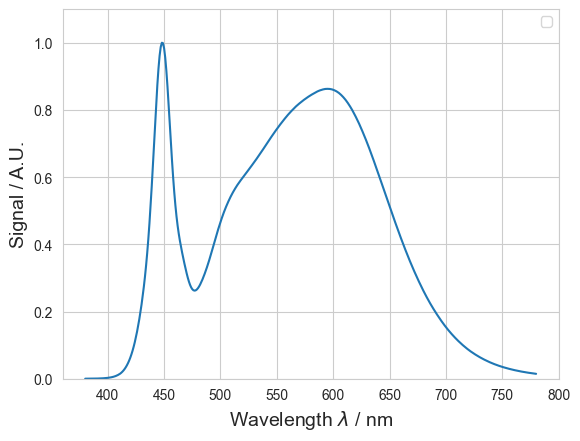

In [4]:
# Using a detector responsivity for the simulation
if bSimDetector:
    if bIdeal:
        # using an ideal detector
        wl=lxCmfInterpolate[0].reshape(1,res)
        value=lxCmfInterpolate[2].reshape(1,res)
        spd_init = np.r_[wl, value]
    else:
        # using an detector from the data base
        from empir19nrm02 import _RES
        wl= _RES['VLDetectors']['S']['data'][0].copy()
        value= _RES['VLDetectors']['S']['data'][selected_detector].copy()
        res_tmp = wl.shape[0]
        wl=wl.reshape(1,res_tmp)
        value=value.reshape(1,res_tmp)
        spd_org = np.r_[wl, value]
        spd_init = lx.cie_interp(spd_org, \
            wl_new = np.arange(wlStart,wlStop+1,wlResolution),\
            kind = 'S',negative_values_allowed=True)
# Using a SD for the simulation
else:
    if bIdeal:
        # using an ideal SD (e.g. illumiant L)
        lxSpdInterpolate = lx.cie_interp(lx._CIE_ILLUMINANTS['LED_L41'], \
            wl_new = np.arange(wlStart,wlStop+1,wlResolution),\
            kind = 'S')
        wl=lxSpdInterpolate[0].reshape(1,res)
        value=lxSpdInterpolate[1].reshape(1,res)
        spd_init = np.r_[wl, value]
    else:
        # using a ideal SD from the PhotoLED project
        from empir19nrm02 import _SPD
        wl= _SPD['PHOTOLED']['S']['data'][0].copy()
        value= _SPD['PHOTOLED']['S']['data'][selected_SPD].copy()
        res_tmp = wl.shape[0]
        wl=wl.reshape(1,res_tmp)
        value=value.reshape(1,res_tmp)
        spd_org = np.r_[wl, value]
        spd_init = lx.cie_interp(spd_org, \
            wl_new = np.arange(wlStart,wlStop+1,wlResolution),\
            kind = 'S',negative_values_allowed=True)

spd_init[1,:]=spd_init[1,:]/np.max(spd_init[1,:])

pyplot.plot( spd_init[0],spd_init[1])
pyplot.legend()
pyplot.xlabel('Wavelength $\lambda$ / nm', fontsize=label_font_size)
pyplot.ylabel('Signal / A.U.', fontsize=label_font_size)
pyplot.ylim([0,1.1])
save_fig(dir=out_dir, filename='L41')



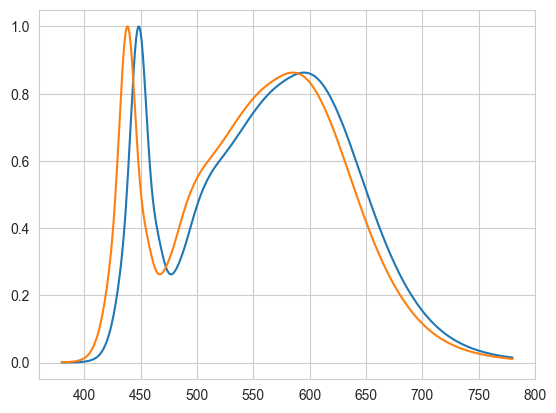

Yxy: [[5.2129e+04 3.7561e-01 3.7229e-01]]
Yxy_shift: [[5.3275e+04 3.6373e-01 3.7601e-01]]
Diff x: 0.011872577382095129, Diff y: -0.003720589447835043


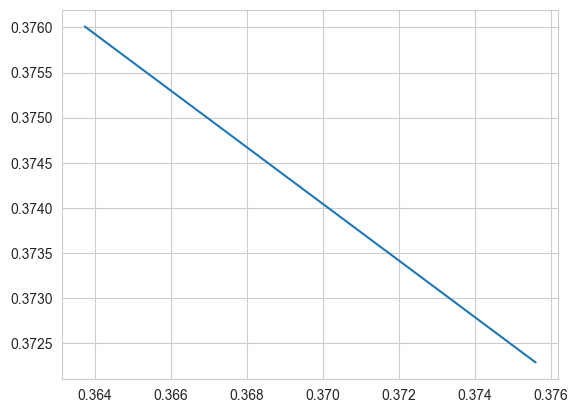

In [5]:
lxspd = lx.spd(spd_init)
XYZ = lx.spd_to_xyz( lxspd, relative=False, cieobs='1931_2')
Yxy = lx.xyz_to_Yxy (XYZ)


shift = 10
spd_wlshift = lx.cie_interp(spd_init, \
            wl_new = shift + np.arange(wlStart,wlStop+1,wlResolution),\
            kind = 'S',negative_values_allowed=True)
spd_wlshift[0] = spd_init[0]

pyplot.plot( spd_init[0],spd_init[1])
pyplot.plot( spd_wlshift[0],spd_wlshift[1])
pyplot.show()

XYZ_shift = lx.spd_to_xyz( spd_wlshift, relative=False, cieobs='1931_2')
Yxy_shift = lx.xyz_to_Yxy (XYZ_shift)

print('Yxy:', Yxy)
print('Yxy_shift:', Yxy_shift)
print(f'Diff x: {Yxy[0][1]-Yxy_shift[0][1]}, Diff y: {Yxy[0][2]-Yxy_shift[0][2]}')

pyplot.plot( [Yxy[0][1],Yxy_shift[0][1]],[Yxy[0][2],Yxy_shift[0][2]])


# Scale to reference?
* True:    all graphs will be shown as difference to the reference
* False:   all graphs will be shown as they are (without referencing the data)

In [6]:
scale_to_reference = True

# MC Steps?
All MC simulation include several steps (one step for every parameter in the model). The usage of these steps can be
selected here.

At the end, all selected parameters needs to be switched on together for the combined uncertainty.

The last version 'cov' means, that the simulation will be done based on the covaricane matrix and not based on the model
parameter variation.

In [7]:
mc_enable = { 'nothing': True,
              'wl_noise_nc': True,          # non correlated wavelength noise
              'wl_noise_c': True,           # correlated wavelength noise
              'wl_fourier_noise':True,      # fourier correlated wavelength noise
              'value_noise_nc': True,       # non correlated value noise
              'value_noise_c': True,        # correlated value noise
              'value_fourier_noise':True,   # fourier correlated value noise
              'all': True,                  # all components together
              'cov': False,                 # simulation based on the covariance matrix and multivariate gaussian noise only
              'file': False,                # simulation from a former simulation
              }

mc_disable = mc_enable.copy()
for key in mc_disable:
    mc_disable[key]=False

mc_cov = mc_disable.copy()
mc_cov['cov']=True

mc_file = mc_disable.copy()
mc_file['file']=True


In [8]:
# THX: https://stackoverflow.com/questions/7965743/how-can-i-set-the-aspect-ratio-in-matplotlib
def aspectratio_to_one( ax):
    ratio = 1.0
    x_left, x_right = ax.get_xlim()
    y_low, y_high = ax.get_ylim()
    ax.set_aspect(abs((x_right-x_left)/(y_low-y_high))*ratio)

def showResults( samples, name):
    print( samples.MCTable)
    samples.MCTable.to_excel(get_fig_file_name(dir=out_dir, filename= name + '.xlsx', table=True))

    v_wl_ref, v_wl, v_wl_diff, v_mean, v_mean_diff, v_std, q_min, q_max, cov_image, corr_image, counts = samples.get_result()

    fig, ax1 = pyplot.subplots()
    ax1.plot( v_wl_ref, v_mean, label=name+' mean')
    ax1.plot( v_wl_ref, v_std, label=name+' std')
    ax1.fill_between( v_wl_ref, q_min, q_max)
    ax1.set_xlabel(strd['xlambda'], fontsize=label_font_size)
    ax1.set_ylabel( 'mean; stddev / A.U.', fontsize=label_font_size)
    ax1.legend()
    save_fig(dir=out_dir, filename=name)

    fig, ax1 = pyplot.subplots()
    ax1.plot( v_wl_ref, v_mean_diff, label=name+' mean diff')
    ax1.plot( v_wl_ref, v_std, label=name+' stddev')
    ax1.fill_between( v_wl_ref, q_min-v_mean, q_max-v_mean)
    ax1.set_xlabel(strd['xlambda'], fontsize=label_font_size)
    ax1.set_ylabel( 'mean dif; stddev / A.U.', fontsize=label_font_size)
    ax1.legend()
    save_fig(dir=out_dir, filename=name+'Diff')

    plotCorrelation( cov_image, v_wl_ref, name + 'Covariance')
    save_fig(dir=out_dir, filename=name+'cov')

    plotCorrelation( corr_image, v_wl_ref, name + 'Correlation')
    save_fig(dir=out_dir, filename=name+'corr')

    return cov_image

In [9]:
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms

# THX: https://matplotlib.org/devdocs/gallery/statistics/confidence_ellipse.html
def confidence_ellipse(x, y, ax, n_std=3.0, facecolor='none', **kwargs):
    """
    Create a plot of the covariance confidence ellipse of *x* and *y*.

    Parameters
    ----------
    x, y : array-like, shape (n, )
        Input data.

    ax : matplotlib.axes.Axes
        The axes object to draw the ellipse into.

    n_std : float
        The number of standard deviations to determine the ellipse's radiuses.

    **kwargs
        Forwarded to `~matplotlib.patches.Ellipse`

    Returns
    -------
    matplotlib.patches.Ellipse
    """
    if x.size != y.size:
        raise ValueError("x and y must be the same size")

    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    # Using a special case to obtain the eigenvalues of this
    # two-dimensionl dataset.
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x * 2, height=ell_radius_y * 2,
                      facecolor=facecolor, fill=False, **kwargs)

    # Calculating the stdandard deviation of x from
    # the squareroot of the variance and multiplying
    # with the given number of standard deviations.
    scale_x = np.sqrt(cov[0, 0]) * n_std
    mean_x = np.mean(x)

    # calculating the stdandard deviation of y ...
    scale_y = np.sqrt(cov[1, 1]) * n_std
    mean_y = np.mean(y)

    transf = transforms.Affine2D() \
        .rotate_deg(45) \
        .scale(scale_x, scale_y) \
        .translate(mean_x, mean_y)

    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse)

# Running the MC simulation

# Generate a first MC Simulation
* take the initial spectral data (SD or responsivity)
* generate some noise on the value scale only
* run the MC simulation
* calculate statistical results
* save the data as csv and binary (okl) file
* show some results

nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375601  6.376306e-04   
0           wl_noise_c    0    1.0  0       normal  0.375637  1.285177e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375611  1.821921e-03   
0       value_noise_nc    0   0.01  0       normal  0.375610  2.222570e-04   
0        value_noise_c    0   0.01  0       normal  0.375644  6.663943e-04   
0  value_fourier_noise    0   0.01  4            F  0.375595  9.575971e-04   
0                  all                              0.37560

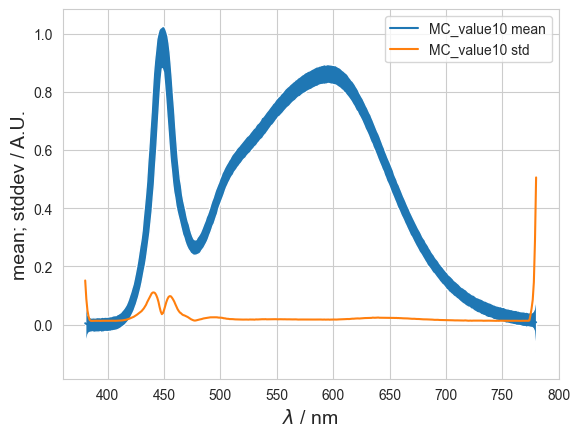

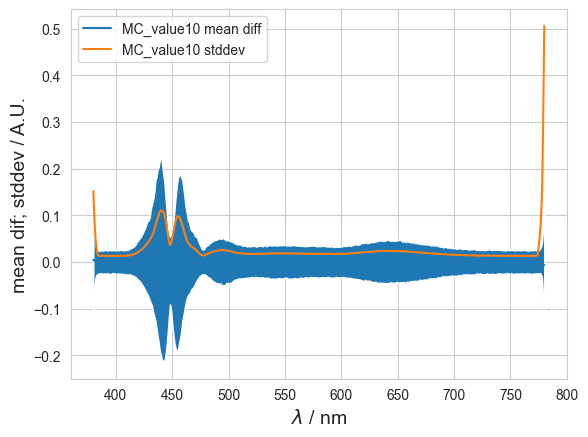

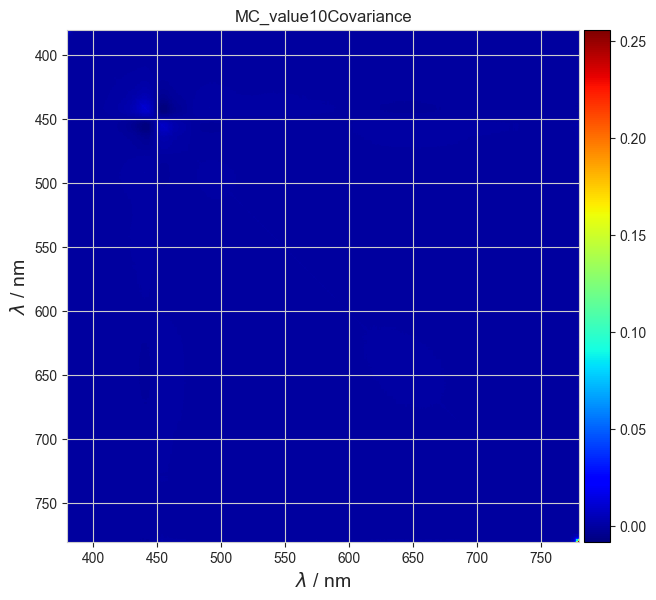

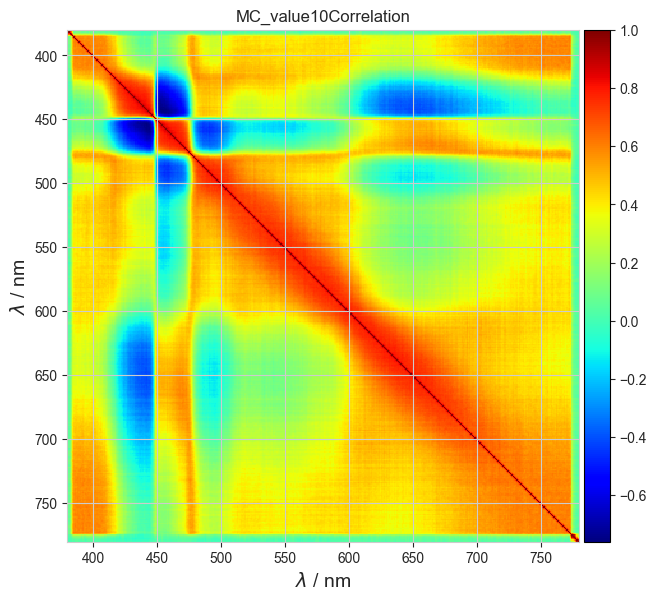

In [10]:
whished_results = ['x', 'y']
whished_results_str = [ 'x', 'y']

mcSpectrumSamples = MCSpectrumSamples(spd=spd_init, trials=trials)
mc_value = mc_enable.copy()
mcSpectrumSamples.run_MC(mc_value, whished_results)
mcSpectrumSamples.calc_summary(wavelength_stat=False)
mcSpectrumSamples.save_to_csv()
mcSpectrumSamples.save()

cov_image = showResults(mcSpectrumSamples, 'MC_value'+str(shift))

nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375601  6.376306e-04   
0           wl_noise_c    0    1.0  0       normal  0.375637  1.285177e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375611  1.821921e-03   
0       value_noise_nc    0   0.01  0       normal  0.375610  2.222570e-04   
0        value_noise_c    0   0.01  0       normal  0.375644  6.663943e-04   
0  value_fourier_noise    0   0.01  4            F  0.375595  9.575971e-04   
0                  all                              0.37560

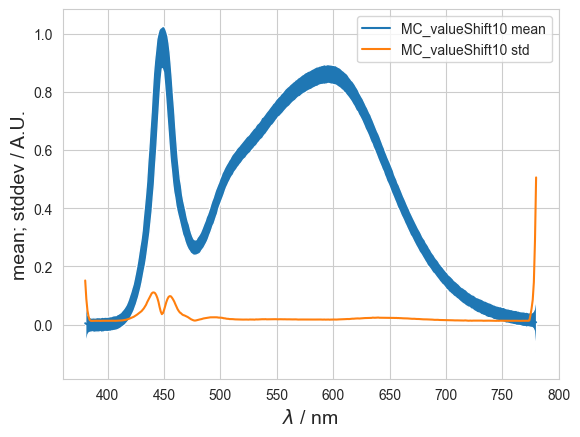

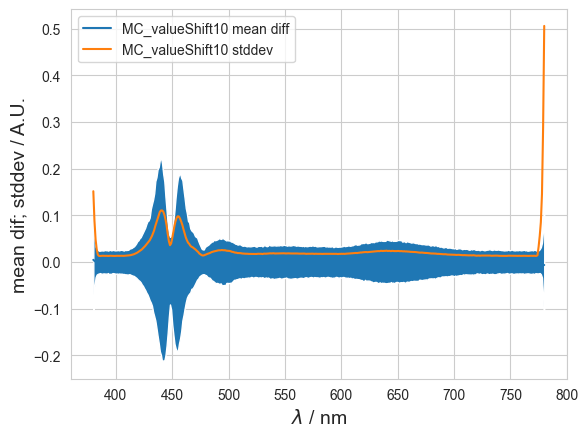

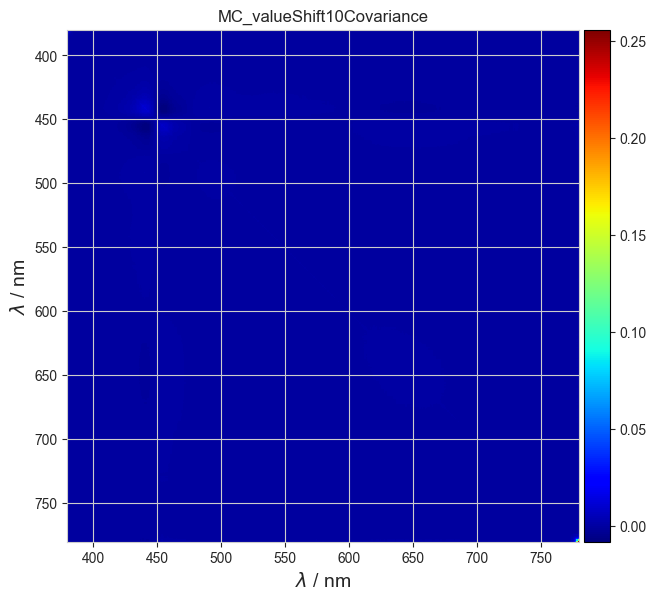

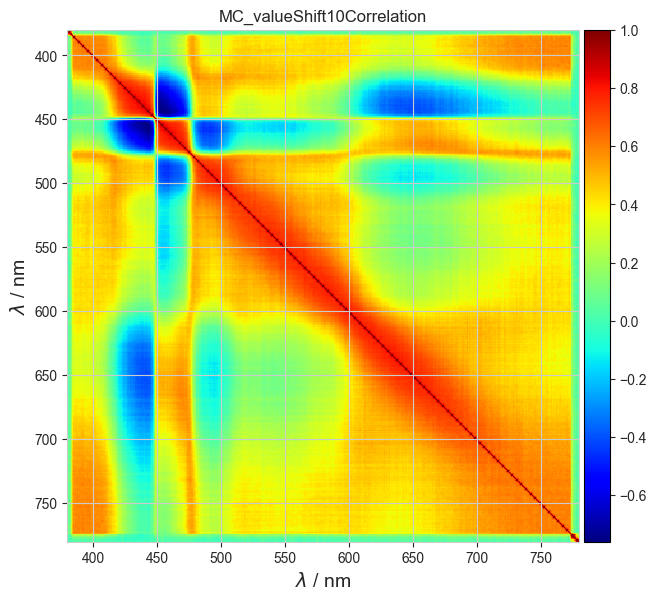

In [11]:
def make2ndMC( shift_loc, spd_shift):
    mcSpectrumSamples2 = MCSpectrumSamples(spd=spd_shift, trials=trials)
    mc_value = mc_enable.copy()
    mcSpectrumSamples2.run_MC(mc_value, whished_results)
    mcSpectrumSamples2.calc_summary(wavelength_stat=False)
    mcSpectrumSamples2.save_to_csv()
    mcSpectrumSamples2.save()
    return mcSpectrumSamples2

mcSpectrumSamples2 = make2ndMC(shift, spd_wlshift)
cov_image2 = showResults(mcSpectrumSamples, 'MC_valueShift'+str(shift))

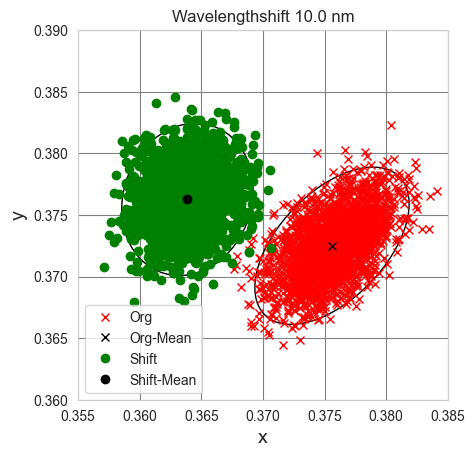

In [12]:
def plotxySingle(fig, ax1, shift_loc, mcSpectrumSamples2_loc, legend=True):
    ax1.plot(mcSpectrumSamples.spectrumResults.result['x']['data'],mcSpectrumSamples.spectrumResults.result['y']['data'], 'rx' , label = 'Org')
    ax1.plot(mcSpectrumSamples.spectrumResults.result['x']['Mean'],mcSpectrumSamples.spectrumResults.result['y']['Mean'], 'kx' , label = 'Org-Mean')
    ax1.plot(mcSpectrumSamples2_loc.spectrumResults.result['x']['data'],mcSpectrumSamples2_loc.spectrumResults.result['y']['data'] , 'go', label = 'Shift')
    ax1.plot(mcSpectrumSamples2_loc.spectrumResults.result['x']['Mean'],mcSpectrumSamples2_loc.spectrumResults.result['y']['Mean'], 'ko' , label = 'Shift-Mean')
    confidence_ellipse(mcSpectrumSamples.spectrumResults.result['x']['data'],mcSpectrumSamples.spectrumResults.result['y']['data'], ax1, n_std=2.45, edgecolor='k')
    confidence_ellipse(mcSpectrumSamples2_loc.spectrumResults.result['x']['data'],mcSpectrumSamples2_loc.spectrumResults.result['y']['data'], ax1, n_std=2.45, edgecolor='k')
    if legend:
        ax1.legend()
    ax1.grid(color='grey')
    ax1.set_xlabel('x', fontsize=label_font_size)
    ax1.set_ylabel('y', fontsize=label_font_size)
    ax1.grid(color='grey')
    ax1.set_xlim([0.355,0.385])
    ax1.set_ylim([0.360,0.390])
    if legend:
        ax1.set_title(f"Wavelengthshift {shift:.1f} nm")
    aspectratio_to_one(ax1)

    #save_fig(dir=out_dir, filename='xyBoth'+str(shift_loc))

fig, ax1 = pyplot.subplots()
plotxySingle(fig, ax1, shift, mcSpectrumSamples2)

In [13]:
def calcMeanCov(mcSpectrumSamples_loc):
    x1 = np.array((mcSpectrumSamples_loc.spectrumResults.result['x']['Mean'],mcSpectrumSamples_loc.spectrumResults.result['y']['Mean']))
    data_x1 = np.array((mcSpectrumSamples_loc.spectrumResults.result['x']['data'],mcSpectrumSamples_loc.spectrumResults.result['y']['data']))
    cov1 = mcSpectrumSamples_loc.spectrumResults.get_table_covariane(['x', 'y'])
    return x1, cov1

x1, cov1 = calcMeanCov(mcSpectrumSamples)
x2, cov2 = calcMeanCov(mcSpectrumSamples2)

print( x1, cov1)
print( x2, cov2)

[3.7560e-01 3.7250e-01] [[6.5297e-06 3.5399e-06]
 [3.5399e-06 6.7904e-06]]
[3.6387e-01 3.7626e-01] [[4.7347e-06 6.8170e-07]
 [6.8170e-07 6.3620e-06]]


Evaluation according to Zeier
https://citeseerx.ist.psu.edu/viewdoc/summary?doi=10.1.1.513.2806

* multi variate degree of equivalence $\boldsymbol{d}_{i}$ is a vector of dimension $m$
* assuming an $m$-variate normal distribution
* $mxm$ covariance matrix
* confidence region around $\boldsymbol{d}_{i}$
* for $\chi_{m,\alpha}^{2}$ usually the inverse of the culmulative pdf of the $\chi^{2}$ distribution with $m$degrees of freedom for the confidence level $alpha=0.95$ is used. (Example  $\chi_{2,0.95}^{2}=6$) 

* $(\boldsymbol{x}-\boldsymbol{d}_{i})^{\mathrm{T}}{\boldsymbol{V}_{\boldsymbol{d}_{i}}}^{-1}(\boldsymbol{x}-\boldsymbol{d}_{i})=\chi_{m,\alpha}^{2}$

In [14]:
def calc_multiDim_DoE( x1_, cov1_, x2_, cov2_, data_=None):
    d = x1_-x2_
    V=cov1_+cov2_
    if data_ is None:
        data_ = np.random.default_rng().multivariate_normal(d, V, 1000)
        data_ = data_.T
    # We need to use the inverse of the cumulative distribution
    df=cov1_.shape[0]
    chisquare = chi2.ppf(0.95, df=df)

    d_norm = norm(d)
    print('chisquare:', chisquare)
    print('Difference Vecotr:', d, d_norm)
    print('Resulting Covariance Matrix:',V)
    d_y = math.sqrt(1./(d.T @ inv(V) @ d)*chisquare)
    print('dy:', d_y*d_norm)
    print('DoE:', 1/d_y)
    return d, d_y, V, data_

chisquare: 5.991464547107979
Difference Vecotr: [1.1732e-02 -3.7633e-03] 0.012321268720210188
Resulting Covariance Matrix: [[1.1264e-05 4.2216e-06]
 [4.2216e-06 1.3152e-05]]
dy: 0.0071135108718937716
DoE: 1.7320938903590932


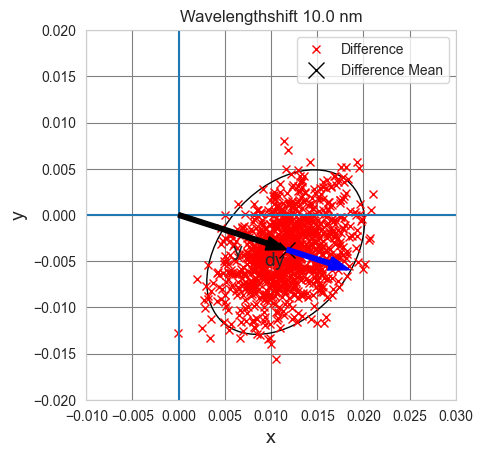

In [15]:
d, dy, V, data = calc_multiDim_DoE(x1, cov1, x2, cov2)

def plot_multi_DoE( fig, ax1, shift_loc, d_, dy_, V_, data_, legend=True):
    ax1.plot(data_[0], data_[1], 'rx' , label = 'Difference')
    ax1.plot(d_[0], d_[1], 'kx' , label = 'Difference Mean', markersize=12)
    confidence_ellipse(data_[0],data_[1], ax1, n_std=2.45, edgecolor='k')
    ax1.axvline(0)
    ax1.axhline(0)
    ax1.set_xlim([-0.01, 0.03])
    ax1.set_ylim([-0.02, 0.02])
    ax1.grid(color='grey')
    if legend:
        ax1.legend()
    ax1.arrow(0,0, d_[0], d_[1], width=.0005, color='black', length_includes_head=True, zorder=100)
    ax1.arrow(d_[0],d_[1], dy_*d_[0], dy_*d_[1], width=.0005, color='blue', length_includes_head=True, zorder=100)

    ax1.text(d_[0]/2, d_[1]/2-0.0025, "y",fontsize=label_font_size)
    ax1.text((dy_*d_[0]+d_[0])/2, (dy_*d_[1]+d_[1])/2-0.0025, "dy",fontsize=label_font_size)

    ax1.set_xlabel('x', fontsize=label_font_size)
    ax1.set_ylabel('y', fontsize=label_font_size)
    if legend:
        ax1.set_title(f"Wavelengthshift {shift:.1f} nm")

    aspectratio_to_one(ax1)


    #save_fig(dir=out_dir, filename='2dDoE'+str(shift_loc))

fig, ax1 = pyplot.subplots()
plot_multi_DoE( fig, ax1, shift, d, dy, V, data)

In [16]:
sd1 = mcSpectrumSamples.v_mean
sd2 = mcSpectrumSamples2.v_mean
d1, dy1, V1, data1 = calc_multiDim_DoE(sd1, cov_image, sd2, cov_image2)


chisquare: 448.690621241841
Difference Vecotr: [-1.9135e-02 -7.5717e-03 -2.8461e-03 -9.7796e-04 -8.6510e-04 -1.0008e-03
 -1.2314e-03 -1.5458e-03 -2.7730e-03 -2.5485e-03 -2.2187e-03 -2.6675e-03
 -3.4874e-03 -3.8365e-03 -4.4133e-03 -4.5348e-03 -5.4004e-03 -6.8583e-03
 -7.9781e-03 -9.5850e-03 -1.1023e-02 -1.2877e-02 -1.5604e-02 -1.7765e-02
 -2.0426e-02 -2.3737e-02 -2.8067e-02 -3.3029e-02 -3.8022e-02 -4.4085e-02
 -5.0319e-02 -5.7882e-02 -6.6073e-02 -7.4640e-02 -8.3597e-02 -9.4725e-02
 -1.0705e-01 -1.1874e-01 -1.3077e-01 -1.4471e-01 -1.5806e-01 -1.7352e-01
 -1.9049e-01 -2.0928e-01 -2.2950e-01 -2.5250e-01 -2.7725e-01 -3.0766e-01
 -3.3691e-01 -3.6815e-01 -4.0294e-01 -4.3830e-01 -4.6652e-01 -4.9228e-01
 -5.0919e-01 -5.1685e-01 -5.0735e-01 -4.8498e-01 -4.4540e-01 -3.8978e-01
 -3.1980e-01 -2.3811e-01 -1.4652e-01 -5.0827e-02 4.8118e-02 1.4311e-01
 2.3002e-01 3.0201e-01 3.6103e-01 4.0321e-01 4.2859e-01 4.3663e-01
 4.3056e-01 4.1492e-01 3.9008e-01 3.6004e-01 3.2676e-01 2.9229e-01
 2.6104e-01 2.3172

# Summarizing all the calculations while changing shift

In [17]:
def plot_SD(fig, ax, ref_sd, new_sd, shift):
    ax.plot( ref_sd[0], ref_sd[1], 'r-', label='Reference')
    ax.plot( new_sd[0], new_sd[1], 'g-', label=f'Shift {shift:.1f} nm')
    ax.legend()
    ax.set_xlabel('Wavelength $\lambda$ / nm', fontsize=label_font_size)
    ax.set_ylabel('Signal / A.U.', fontsize=label_font_size)
    ax.set_title(f"Wavelengthshift {shift:.1f} nm")
    ax.set_ylim([0,1.1])

def plot_DoE(fig, ax, shift_field, DoE_xy, DoE_md):
    ax.plot( shift_field, DoE_xy, 'rx', label='$E_n (x,y)$')
    ax.plot( shift_field, DoE_md, 'go', label='$E_n spectral$')
    ax.set_xlim([0,10])
    ax.set_xlabel('$\Delta \lambda / \mathrm{nm}$', fontsize=label_font_size)
    ax.set_ylabel('$E_n$-Score', fontsize=label_font_size)
    ax.set_xlim([0,10])
    ax.set_ylim([0,2])
    ax.hlines(1, xmin=0, xmax=10)
    ax.legend()
    #save_fig(dir=out_dir, filename='DoeSum')

In [18]:
import cv2

frame_rate = 5
aspect_ratio_video = 16/9
aspect_ratio_diag1 = 1
vertical_res = 768
frame_size_v = (int(vertical_res*aspect_ratio_video), int(vertical_res))
frame_size_1 = (int(vertical_res*aspect_ratio_diag1), int(vertical_res))

def init_video(video_name, frame_size):
    if not 'MP4' in video_name:
        video_name = video_name + '.MP4'
    # generate video writer
    fourcc = cv2.VideoWriter_fourcc(*'X264')
    #fourcc = cv2.VideoWriter_fourcc(*'MP4V')
    video_writer = cv2.VideoWriter(video_name, fourcc, frame_rate, frame_size)

    return video_writer

def add_frame( video_writer, frame_size):
    # save the current frame
    pyplot.savefig('temp_frame.png')
    # load the current frame and save to the video
    frame = cv2.imread('temp_frame.png')
    frame = cv2.resize(frame, frame_size)
    video_writer.write(frame)


In [19]:

video_writer_L41 = init_video( 'L41Shift', frame_size_v)
video_writer_single = init_video( 'L41Single', frame_size_1)
video_writer_diff = init_video( 'L41SDiff', frame_size_1)
video_writer_DoE = init_video( 'L41DoE', frame_size_v)
video_writer_xy = init_video( 'L41xy', frame_size_v)
video_writer_ges = init_video( 'L41Ges', frame_size_v)

nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [-5.3769e-05 2.3338e-05] 5.861530589831153e-05
Resulting Covariance Matrix: [[1.3729e-05 7.5004e-06]
 [7.5004e-06 1.3955e-05]]
dy: 0.006465220861385525
DoE: 0.009066249576777801
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375601  6.376306e-04   
0           wl_noise_c    0    1.0  0       normal  0.375637  1.285177e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375611  1.821921e-03   
0       value_noise_nc    0   0.01  0       normal  0.375610  2.222

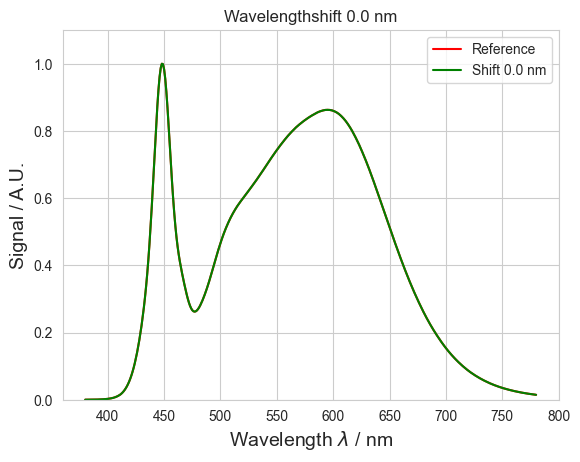

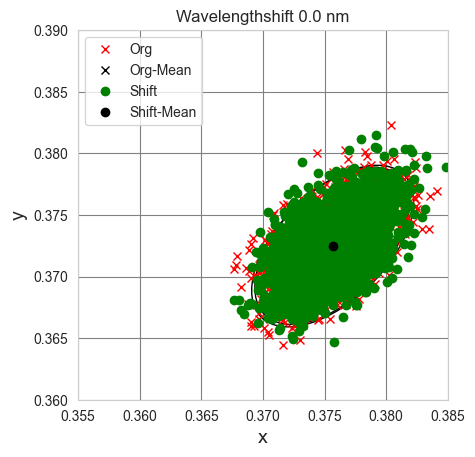

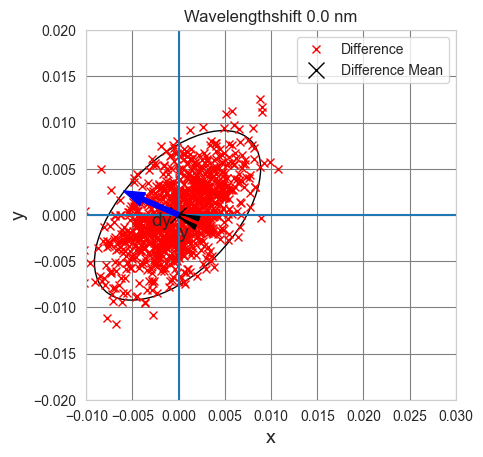

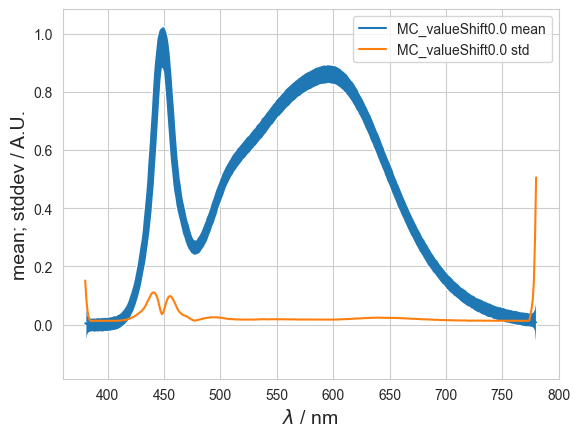

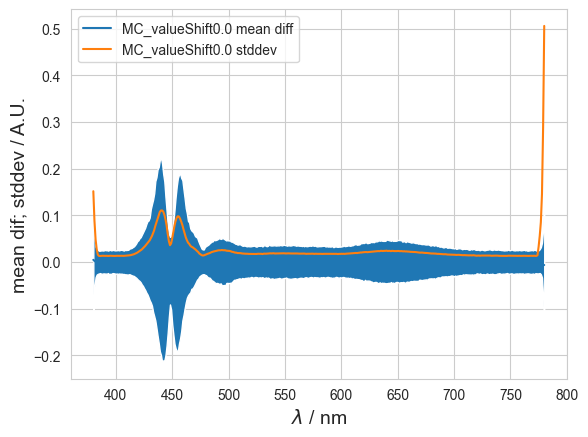

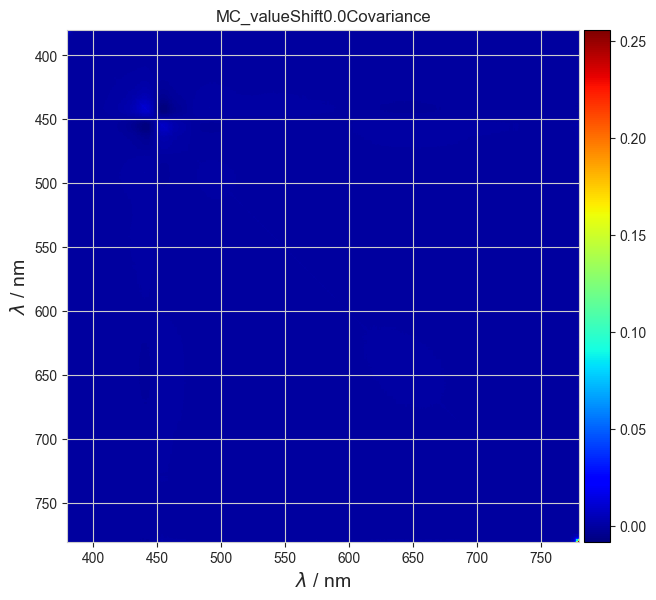

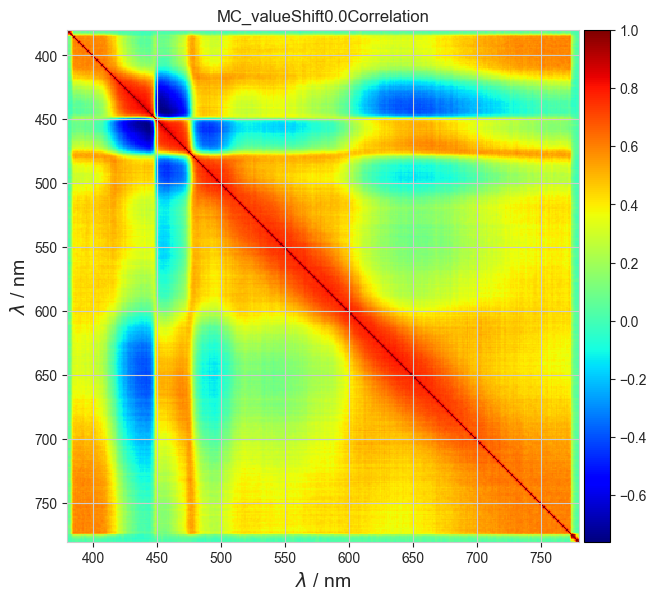

chisquare: 448.690621241841
Difference Vecotr: [1.0627e-01 5.9953e-02 1.6199e-02 2.1745e-04 3.3635e-04 1.7090e-04
 -1.5916e-04 -4.3661e-05 -7.3974e-04 -6.4205e-04 -1.4235e-04 1.1271e-05
 -1.8839e-04 3.7710e-05 2.7402e-05 -1.7308e-04 5.4243e-04 2.4702e-04
 -1.2946e-05 9.6390e-05 -5.1388e-05 2.2741e-04 -1.0543e-04 -1.9690e-05
 1.9219e-04 2.8352e-04 1.6893e-04 -3.1926e-04 -6.8899e-05 2.6106e-04
 4.8273e-04 3.0515e-04 1.2508e-04 1.7011e-04 1.8523e-04 -1.3239e-04
 -2.5510e-05 1.6295e-04 3.0555e-04 5.5030e-04 9.0036e-04 4.2937e-04
 3.1737e-04 5.8991e-04 1.1687e-03 1.2537e-03 1.3388e-03 1.2845e-03
 1.2693e-03 1.7049e-03 3.0361e-03 2.6324e-03 2.6410e-03 4.0829e-03
 2.5984e-03 2.2059e-03 4.5443e-03 3.9544e-03 5.2004e-03 5.8926e-03
 5.4033e-03 5.9085e-03 5.1966e-03 3.0359e-03 3.1172e-03 2.6909e-03
 1.4032e-03 -4.9436e-04 -1.3172e-03 -2.0232e-03 -2.5880e-03 -4.3823e-03
 -5.4239e-03 -4.9853e-03 -5.4809e-03 -5.3417e-03 -4.4905e-03 -5.1238e-03
 -3.6737e-03 -3.3196e-03 -3.8366e-03 -2.7079e-03 -2.7522

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [5.1002e-04 1.1897e-04] 0.0005237109884885264
Resulting Covariance Matrix: [[1.3395e-05 7.1575e-06]
 [7.1575e-06 1.3715e-05]]
dy: 0.008681688868762296
DoE: 0.06032363016058985
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375601  6.376306e-04   
0           wl_noise_c    0    1.0  0       normal  0.375637  1.285177e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375611  1.821921e-03   
0       value_noise_nc    0   0.01  0       normal  0.375610  2.22257

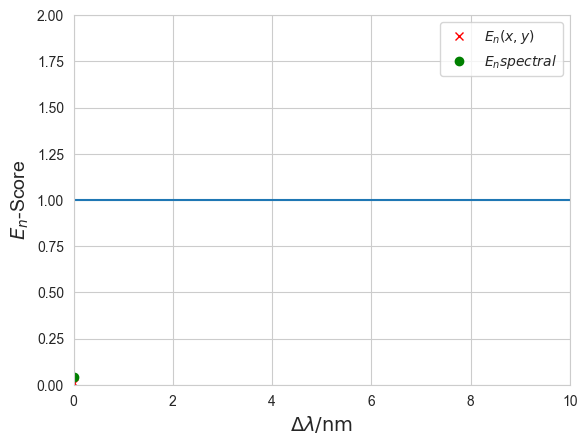

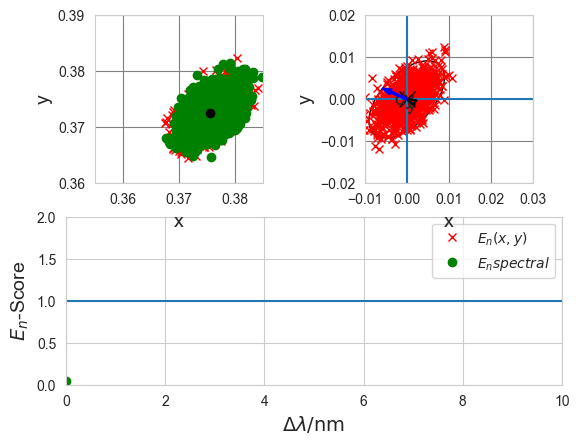

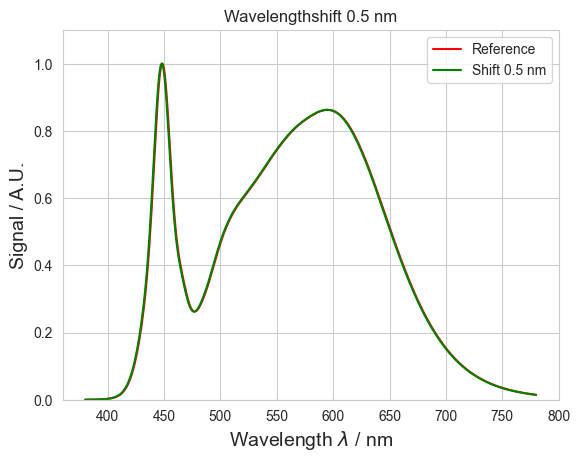

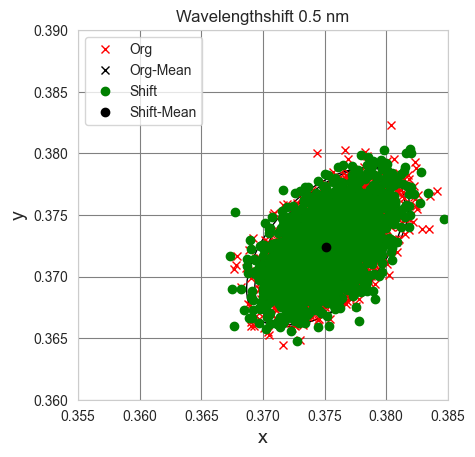

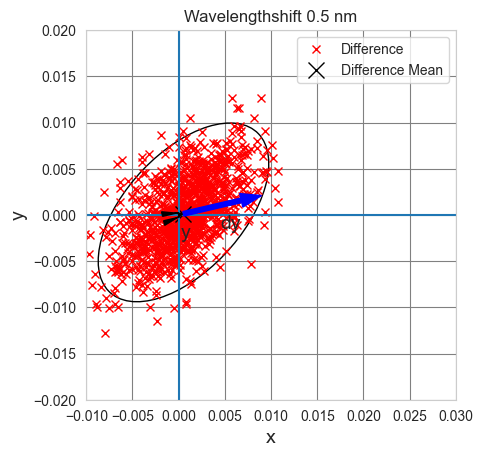

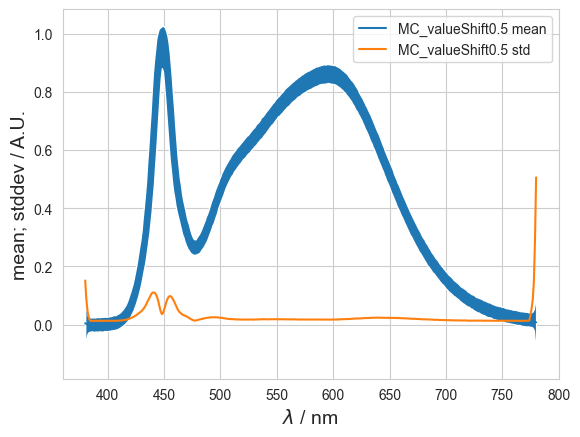

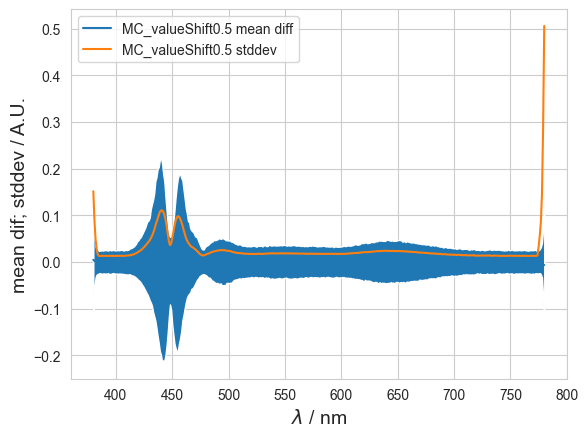

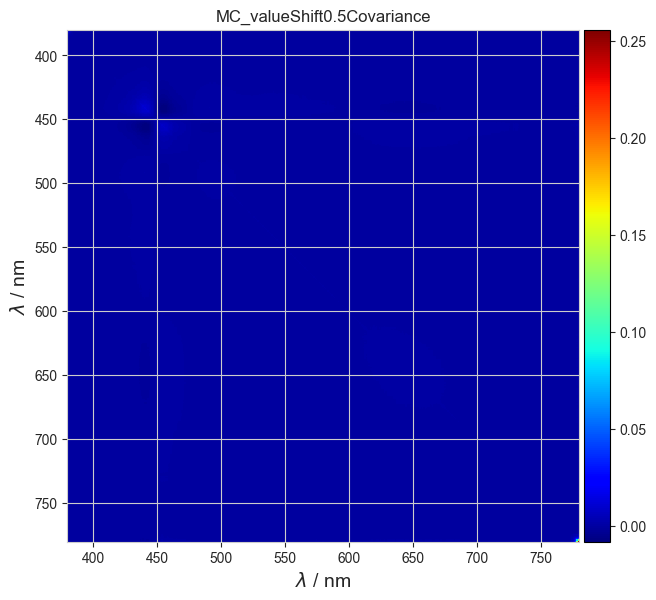

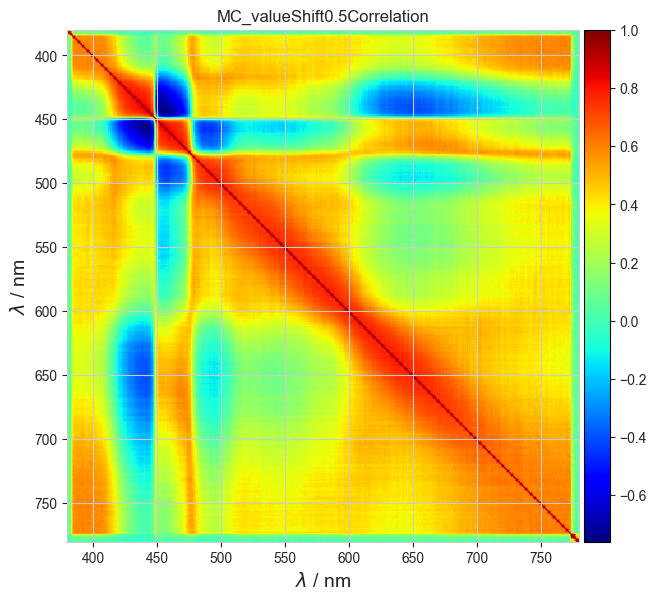

chisquare: 448.690621241841
Difference Vecotr: [7.9390e-03 5.2004e-03 2.4969e-03 2.0974e-03 1.7360e-03 7.8740e-04
 5.2354e-04 4.8549e-04 -3.9126e-04 5.6373e-05 2.5678e-04 2.5664e-04
 3.5808e-04 7.3086e-04 6.6892e-04 5.2140e-04 6.5530e-04 3.6393e-05
 -1.9629e-04 -2.8240e-04 5.5018e-05 -2.5662e-04 -2.0915e-04 9.8296e-06
 6.4088e-06 -2.4793e-05 -2.6779e-05 -3.8655e-04 -3.2637e-04 -4.0800e-04
 6.4135e-05 -3.4865e-04 -1.2698e-03 -9.4447e-04 -8.5295e-04 -1.5801e-03
 -2.1311e-03 -1.9052e-03 -2.7465e-03 -3.1451e-03 -3.0618e-03 -4.0918e-03
 -4.7627e-03 -4.6900e-03 -5.4193e-03 -5.5168e-03 -5.9883e-03 -7.4774e-03
 -6.9631e-03 -7.8003e-03 -8.2546e-03 -9.5057e-03 -1.1766e-02 -1.1607e-02
 -1.3812e-02 -1.5789e-02 -1.4562e-02 -1.7949e-02 -1.7897e-02 -2.0659e-02
 -2.2659e-02 -2.3669e-02 -2.2780e-02 -2.2806e-02 -1.9315e-02 -1.5846e-02
 -1.0608e-02 -5.6910e-03 -1.1749e-03 4.7299e-03 8.7411e-03 1.0682e-02
 1.3258e-02 1.7141e-02 1.9216e-02 2.0309e-02 1.9585e-02 1.7859e-02
 1.7356e-02 1.4998e-02 1.4005e-02 

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [1.1743e-03 4.6222e-05] 0.0011752076032100086
Resulting Covariance Matrix: [[1.3223e-05 6.9694e-06]
 [6.9694e-06 1.3723e-05]]
dy: 0.007774146189692485
DoE: 0.1511687038723535
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375601  6.376306e-04   
0           wl_noise_c    0    1.0  0       normal  0.375637  1.285177e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375611  1.821921e-03   
0       value_noise_nc    0   0.01  0       normal  0.375610  2.222570

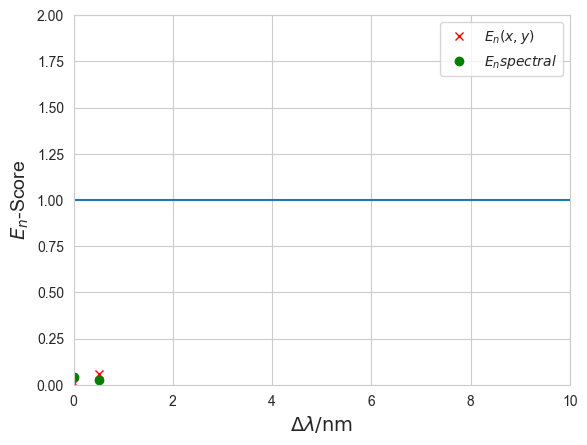

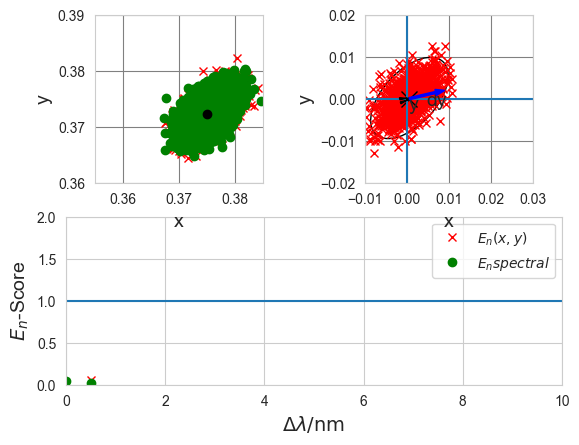

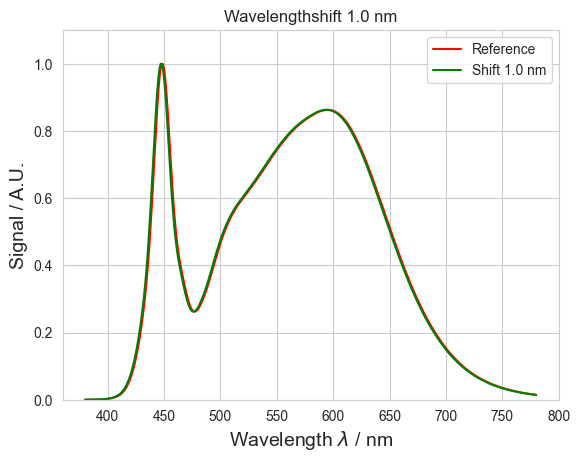

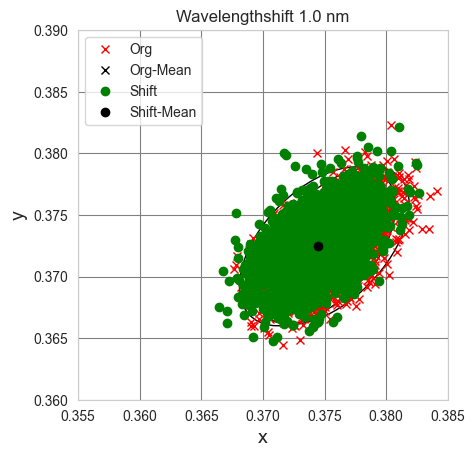

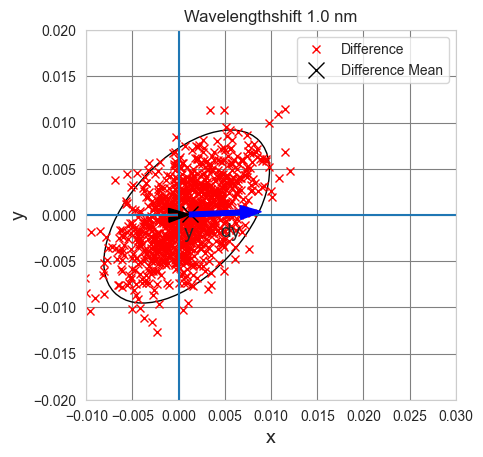

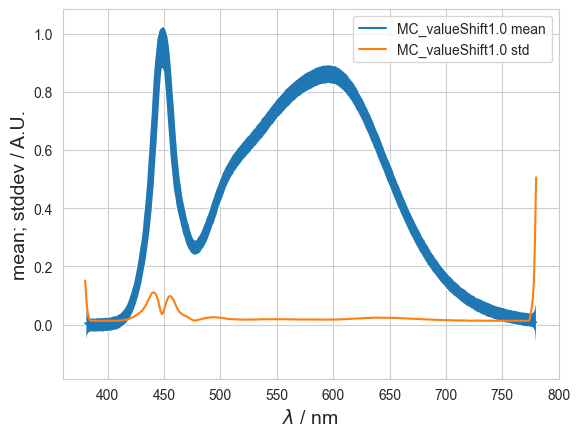

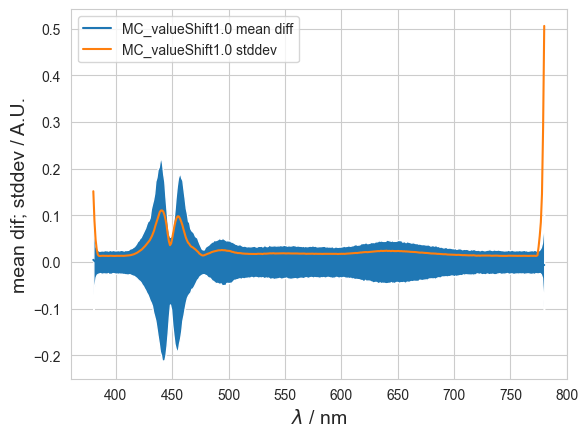

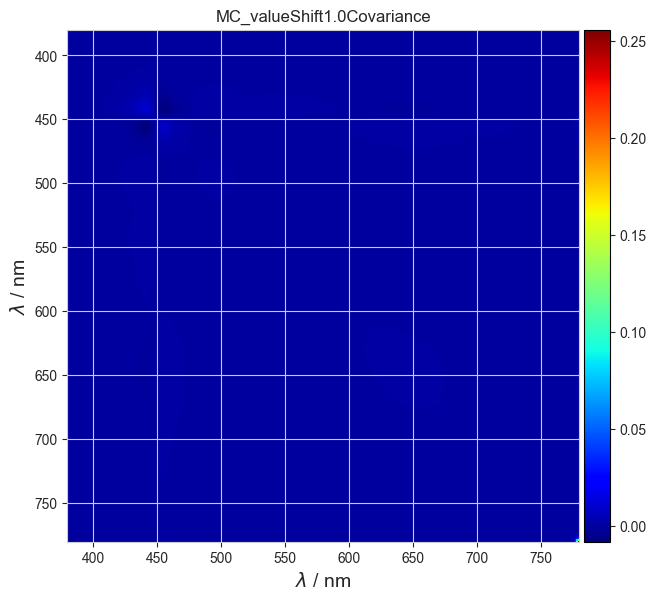

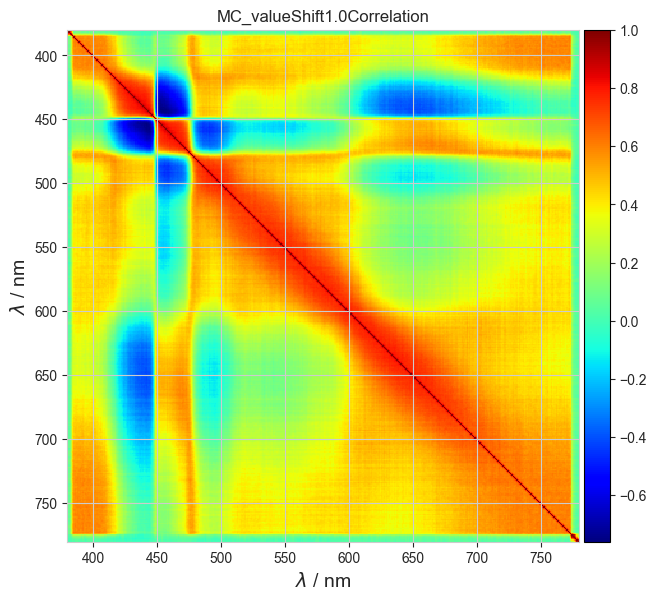

chisquare: 448.690621241841
Difference Vecotr: [-7.0260e-02 -3.3949e-02 -1.5645e-02 -4.9332e-03 8.5474e-04 4.3827e-04
 2.4957e-04 1.9694e-04 -2.1963e-04 -1.4754e-04 -8.5399e-05 4.0850e-05
 2.8507e-04 1.8711e-04 3.7781e-05 1.5434e-04 4.7452e-04 3.0807e-04
 -4.9674e-04 -3.0406e-04 -2.9936e-04 -4.0397e-04 -3.5090e-04 -3.0750e-04
 -3.6020e-04 -8.6941e-04 -8.2225e-04 -1.0610e-03 -1.2550e-03 -1.3615e-03
 -1.2637e-03 -1.7753e-03 -2.8031e-03 -2.9563e-03 -3.2337e-03 -4.4572e-03
 -4.9572e-03 -5.5192e-03 -6.3365e-03 -7.2965e-03 -8.2054e-03 -8.9934e-03
 -1.0789e-02 -1.1381e-02 -1.2411e-02 -1.3991e-02 -1.5609e-02 -1.6882e-02
 -1.7792e-02 -2.0361e-02 -2.1571e-02 -2.2581e-02 -2.6232e-02 -2.9738e-02
 -3.4098e-02 -3.9476e-02 -4.0942e-02 -4.5642e-02 -4.7410e-02 -4.7839e-02
 -5.0099e-02 -5.1303e-02 -4.9020e-02 -4.5705e-02 -3.9409e-02 -3.1239e-02
 -2.0766e-02 -1.1525e-02 -8.1245e-04 1.0610e-02 2.0434e-02 2.8081e-02
 3.6089e-02 4.0642e-02 4.5163e-02 4.4687e-02 4.3019e-02 4.1992e-02
 3.7787e-02 3.3346e-02 2

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [1.9547e-03 2.6926e-05] 0.0019548445722887713
Resulting Covariance Matrix: [[1.3494e-05 7.2855e-06]
 [7.2855e-06 1.3800e-05]]
dy: 0.007658755937116811
DoE: 0.2552430953981653
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375601  6.376306e-04   
0           wl_noise_c    0    1.0  0       normal  0.375637  1.285177e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375611  1.821921e-03   
0       value_noise_nc    0   0.01  0       normal  0.375610  2.222570

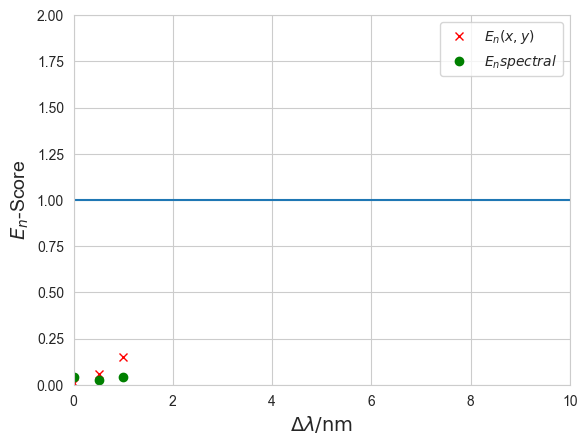

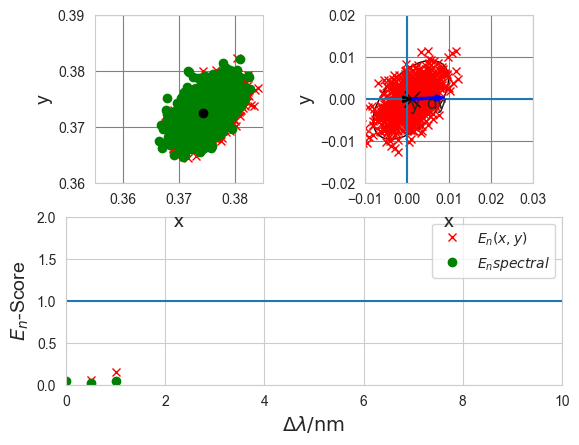

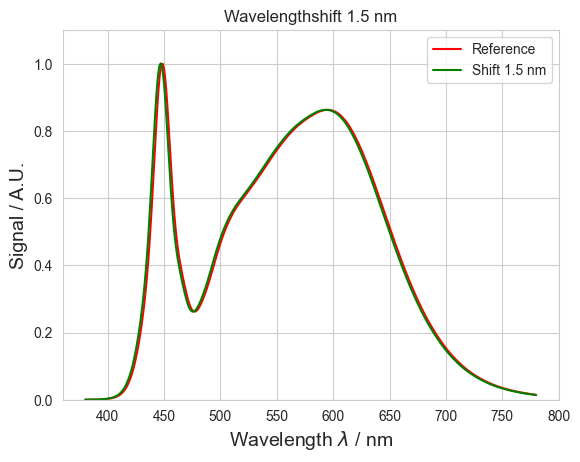

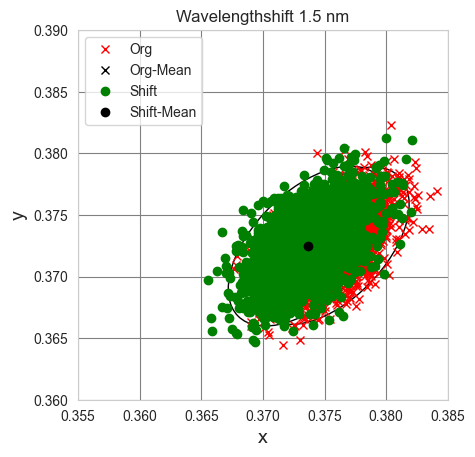

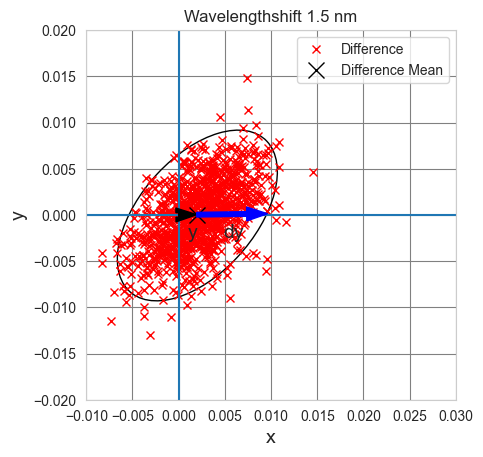

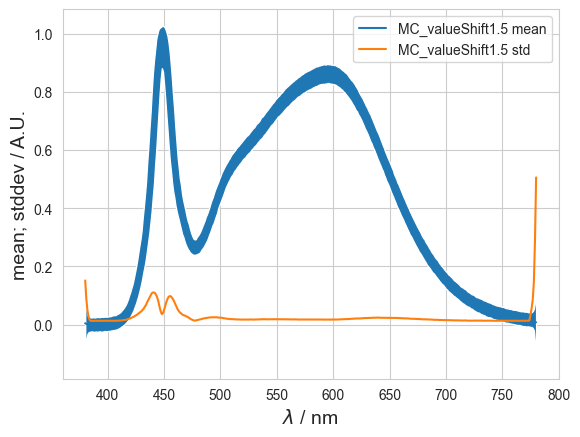

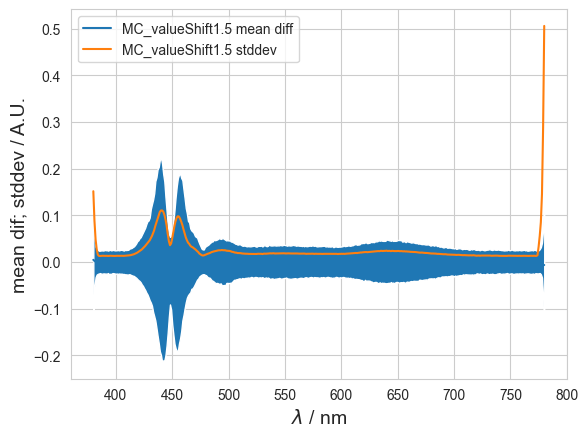

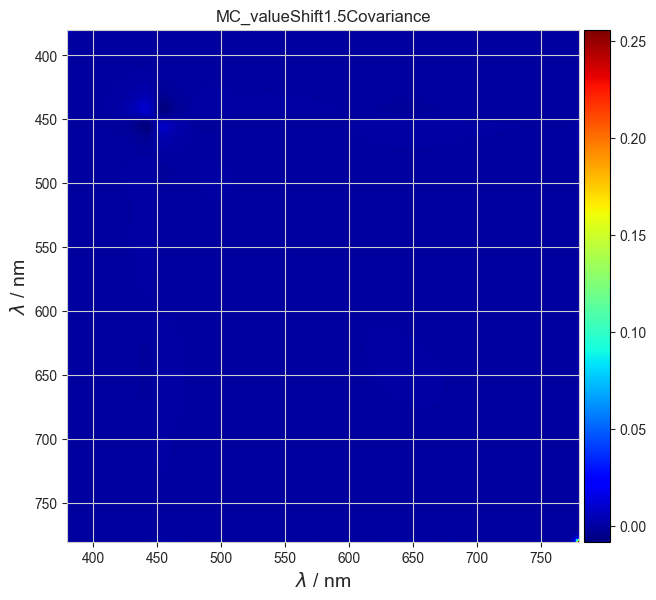

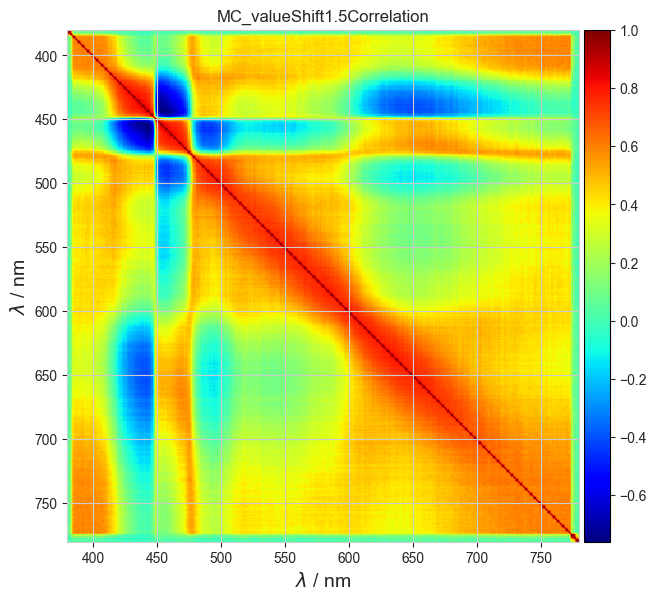

chisquare: 448.690621241841
Difference Vecotr: [4.3819e-04 -7.8486e-05 -1.2926e-03 -1.7109e-04 1.8084e-05 5.5354e-05
 4.8131e-04 2.3689e-04 -5.9992e-04 -2.2088e-04 6.9045e-05 -1.8446e-04
 -2.7594e-04 -1.4774e-04 -8.7354e-05 -2.1367e-04 1.7379e-04 -5.0685e-04
 -7.1838e-04 -7.1462e-04 -1.0642e-03 -1.1513e-03 -8.9601e-04 -1.0249e-03
 -1.4667e-03 -1.8489e-03 -1.6869e-03 -2.3898e-03 -2.6535e-03 -2.8469e-03
 -2.9270e-03 -4.1835e-03 -5.0217e-03 -5.6848e-03 -6.3565e-03 -8.0217e-03
 -8.9185e-03 -1.0027e-02 -1.1216e-02 -1.2631e-02 -1.4143e-02 -1.6080e-02
 -1.8672e-02 -1.9707e-02 -2.1815e-02 -2.4185e-02 -2.5400e-02 -2.7965e-02
 -3.0164e-02 -3.3488e-02 -3.6483e-02 -4.0583e-02 -4.5091e-02 -4.8909e-02
 -5.7004e-02 -6.4178e-02 -6.7860e-02 -7.4627e-02 -7.9450e-02 -8.3126e-02
 -8.3825e-02 -8.2027e-02 -7.8208e-02 -7.2220e-02 -6.2209e-02 -4.7162e-02
 -2.9181e-02 -1.2979e-02 3.9572e-03 2.2366e-02 3.7822e-02 4.9010e-02
 6.0926e-02 6.7188e-02 7.2816e-02 7.2948e-02 7.1489e-02 6.4424e-02
 5.9312e-02 5.2861e-0

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [2.4365e-03 -2.1595e-04] 0.002446095066371647
Resulting Covariance Matrix: [[1.3007e-05 6.8242e-06]
 [6.8242e-06 1.3491e-05]]
dy: 0.007251743888753866
DoE: 0.337311287311883
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375601  6.376306e-04   
0           wl_noise_c    0    1.0  0       normal  0.375637  1.285177e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375611  1.821921e-03   
0       value_noise_nc    0   0.01  0       normal  0.375610  2.222570e

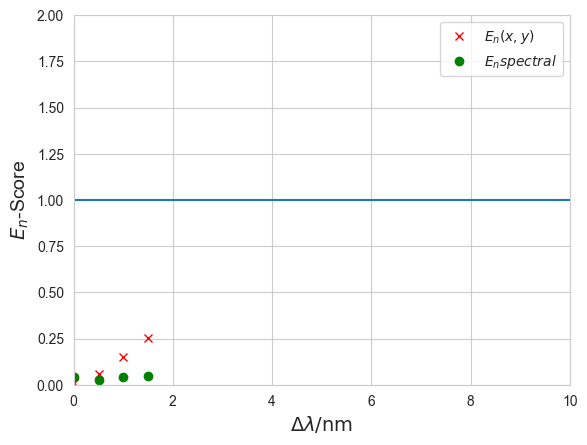

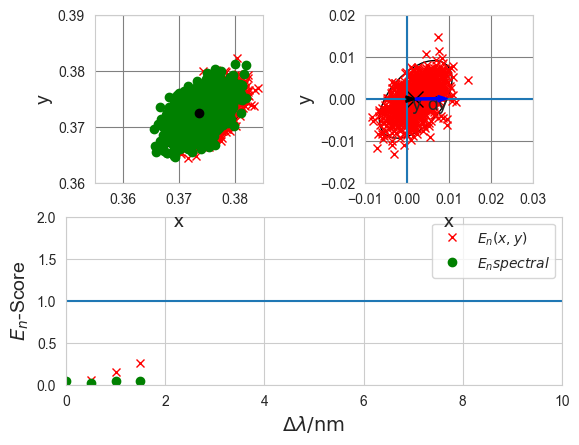

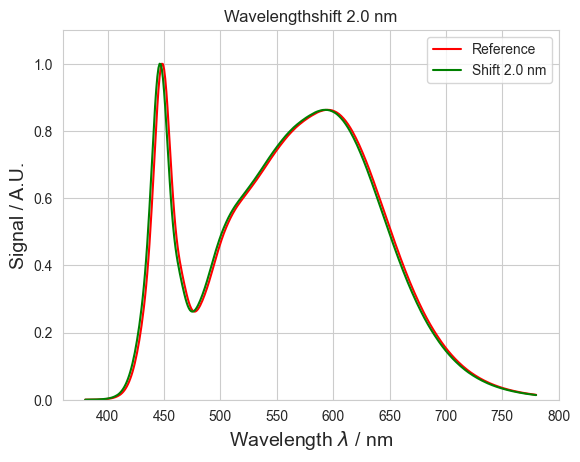

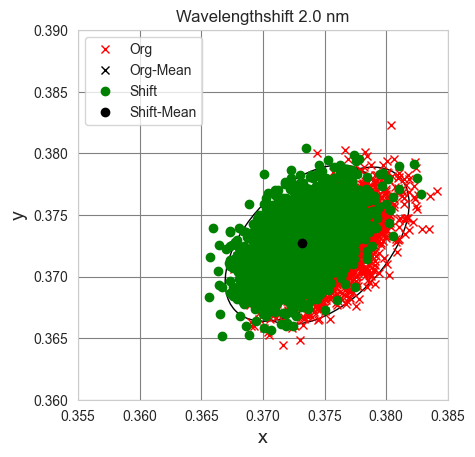

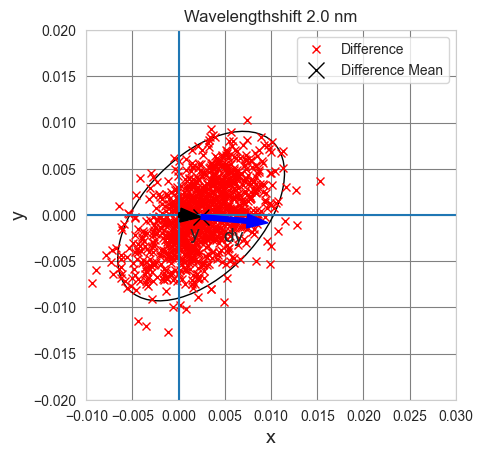

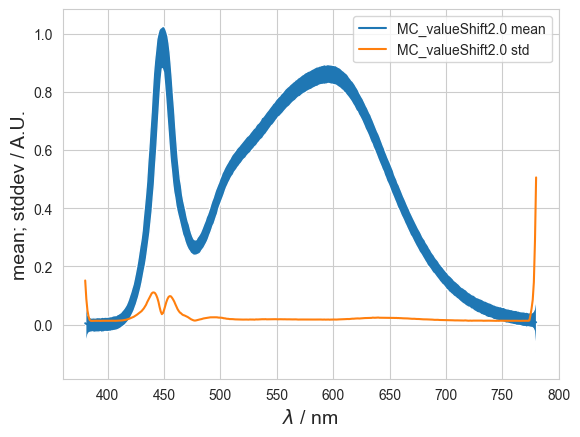

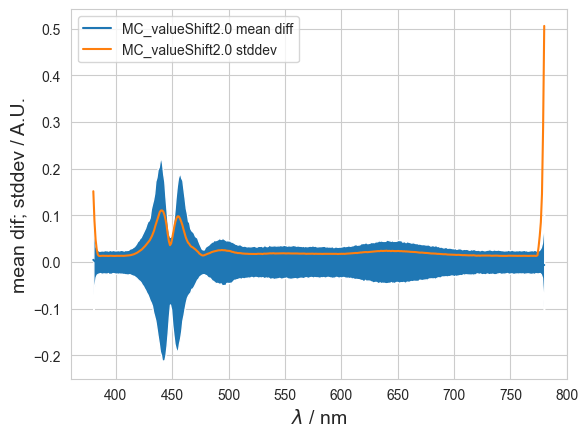

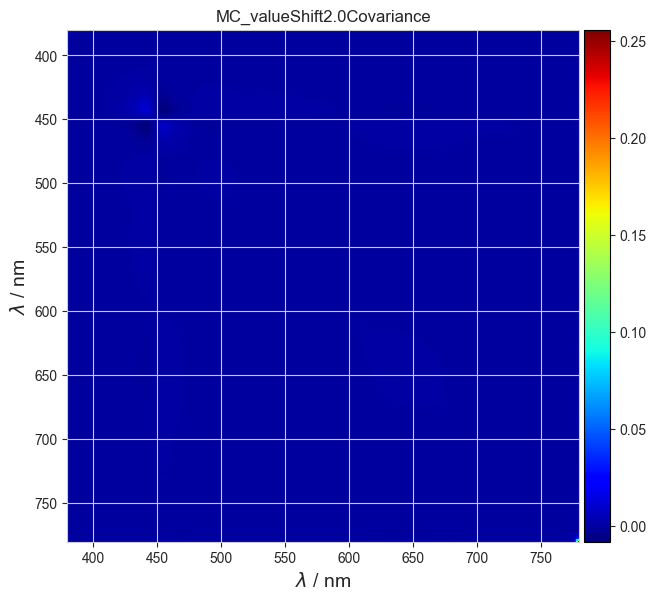

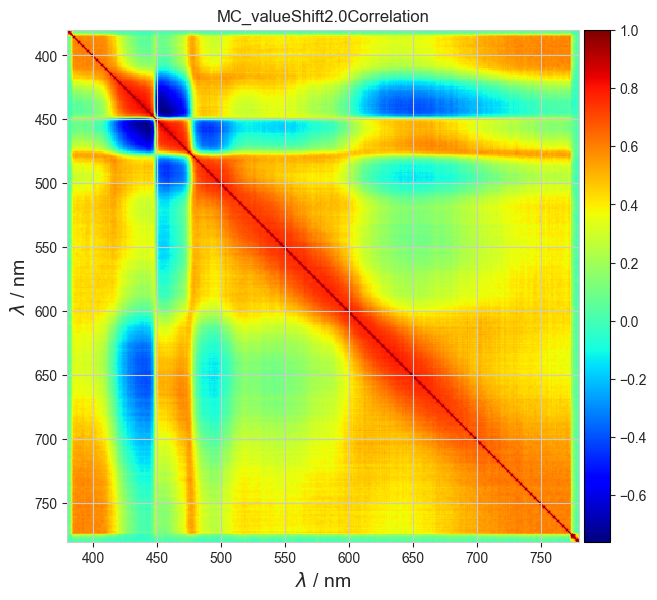

chisquare: 448.690621241841
Difference Vecotr: [4.1204e-01 2.4849e-01 1.2870e-01 5.3287e-02 2.0972e-04 9.9750e-05
 1.5432e-04 -2.8679e-04 -8.8958e-04 -4.3403e-04 -3.2983e-04 -6.0051e-04
 -5.6642e-04 -5.2211e-04 -3.6376e-04 -4.8119e-04 -3.6573e-05 -7.0638e-04
 -1.1035e-03 -1.1949e-03 -1.2049e-03 -1.3376e-03 -1.5255e-03 -1.4474e-03
 -1.5347e-03 -2.6980e-03 -3.1233e-03 -3.5656e-03 -3.9347e-03 -4.1340e-03
 -4.2266e-03 -5.5979e-03 -7.0937e-03 -7.4893e-03 -8.5287e-03 -1.0705e-02
 -1.2317e-02 -1.3414e-02 -1.5452e-02 -1.7513e-02 -1.8755e-02 -2.1599e-02
 -2.4614e-02 -2.6346e-02 -2.8084e-02 -3.1235e-02 -3.4072e-02 -3.7244e-02
 -4.1529e-02 -4.4804e-02 -4.8591e-02 -5.4086e-02 -6.0197e-02 -6.5581e-02
 -7.6286e-02 -8.5474e-02 -9.1273e-02 -9.9626e-02 -1.0341e-01 -1.0701e-01
 -1.0949e-01 -1.0896e-01 -1.0307e-01 -9.2699e-02 -7.6111e-02 -5.5396e-02
 -3.2219e-02 -1.0161e-02 1.3237e-02 3.5937e-02 5.6707e-02 7.1179e-02
 8.2826e-02 9.2858e-02 9.8681e-02 9.9182e-02 9.3934e-02 8.7367e-02
 7.9652e-02 7.0174e-0

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [3.1418e-03 -1.3140e-04] 0.0031445392426629375
Resulting Covariance Matrix: [[1.2733e-05 5.9734e-06]
 [5.9734e-06 1.2846e-05]]
dy: 0.0075776091081107624
DoE: 0.41497775852506713
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375601  6.376306e-04   
0           wl_noise_c    0    1.0  0       normal  0.375637  1.285177e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375611  1.821921e-03   
0       value_noise_nc    0   0.01  0       normal  0.375610  2.222

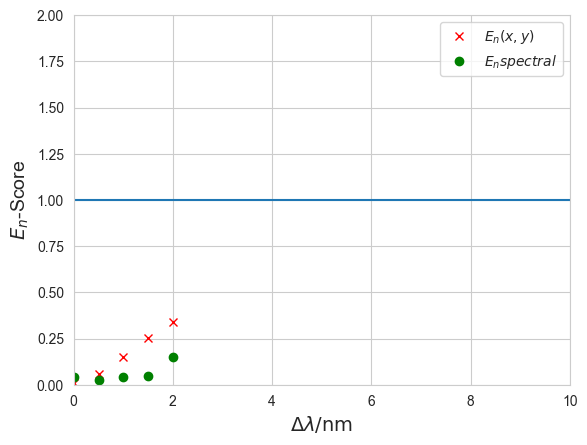

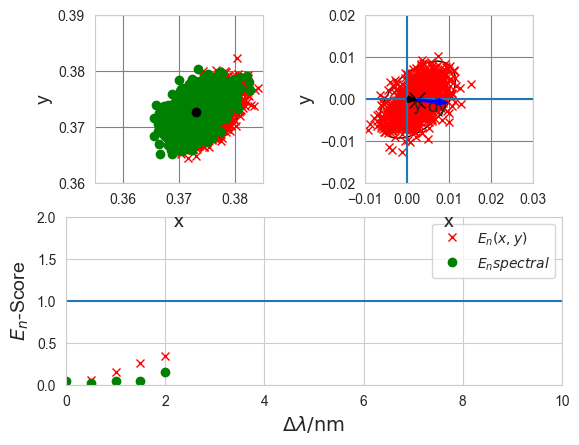

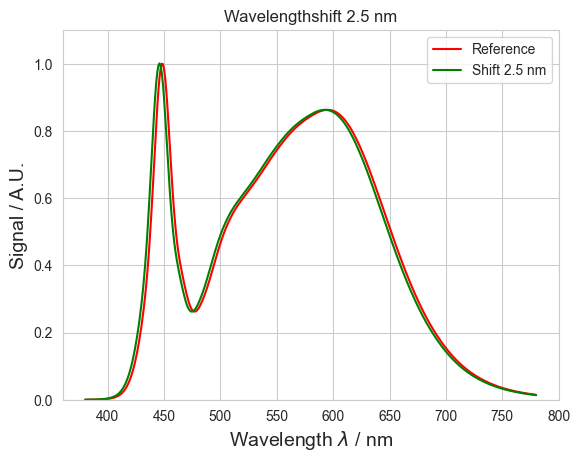

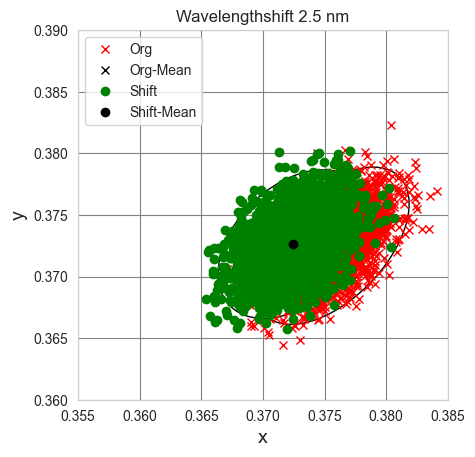

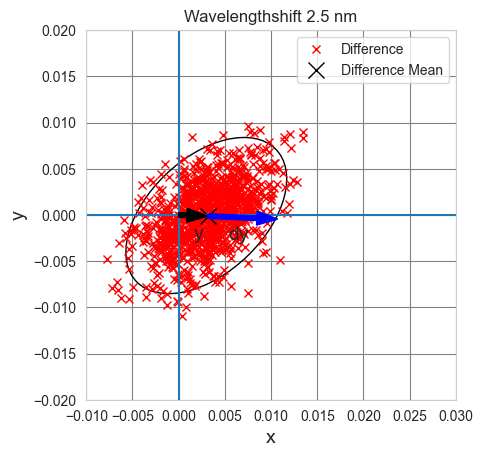

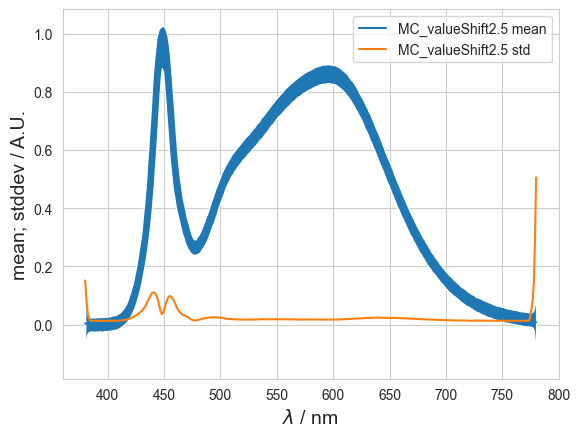

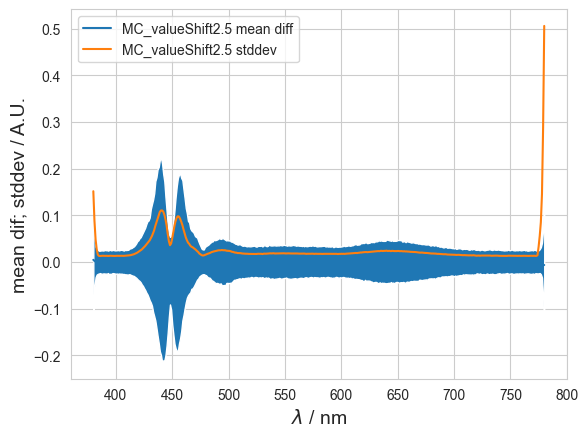

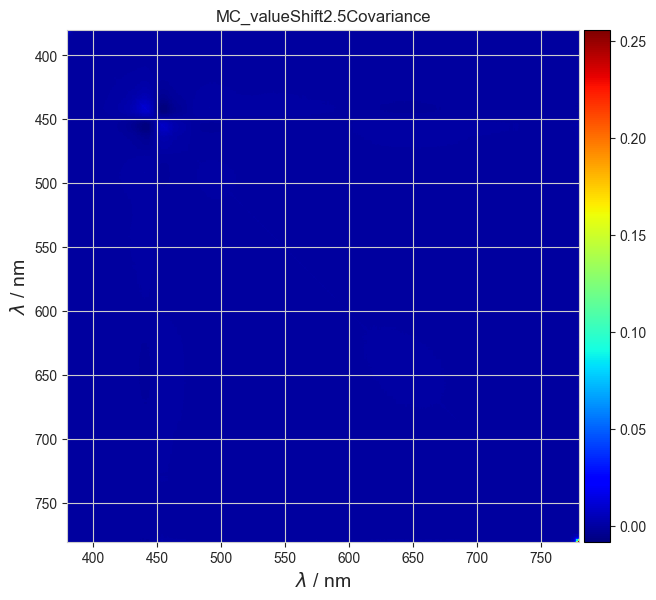

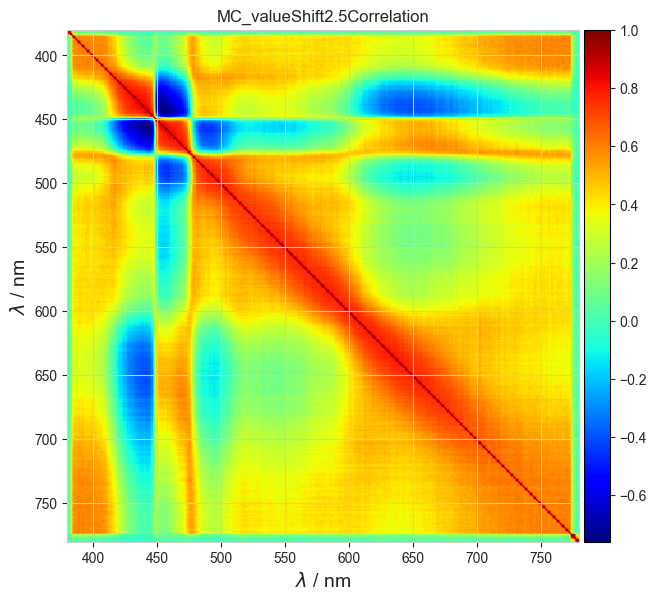

chisquare: 448.690621241841
Difference Vecotr: [4.0947e-03 3.7977e-03 1.6029e-03 6.1170e-04 9.9969e-04 3.2151e-04
 6.8279e-04 3.4263e-04 -6.5093e-04 -9.9665e-05 3.4632e-04 7.3337e-05
 -1.4564e-04 -4.3965e-05 -2.6930e-04 -3.6915e-04 -4.3282e-04 -9.7895e-04
 -1.3002e-03 -1.2963e-03 -1.2519e-03 -1.1364e-03 -1.5277e-03 -1.7093e-03
 -2.0272e-03 -2.5439e-03 -3.4370e-03 -3.8326e-03 -4.3944e-03 -5.2415e-03
 -5.7936e-03 -7.1170e-03 -9.2698e-03 -1.0682e-02 -1.1846e-02 -1.4575e-02
 -1.6662e-02 -1.8570e-02 -2.1196e-02 -2.3609e-02 -2.5967e-02 -2.8898e-02
 -3.2834e-02 -3.5374e-02 -3.9099e-02 -4.2778e-02 -4.6258e-02 -5.0893e-02
 -5.5795e-02 -6.1270e-02 -6.6525e-02 -7.4501e-02 -8.4369e-02 -9.3542e-02
 -1.0385e-01 -1.1567e-01 -1.2319e-01 -1.3442e-01 -1.3934e-01 -1.4233e-01
 -1.4228e-01 -1.3882e-01 -1.2752e-01 -1.1328e-01 -9.0720e-02 -6.3608e-02
 -3.2911e-02 -3.7888e-03 2.6581e-02 5.5519e-02 7.9700e-02 9.9014e-02
 1.1304e-01 1.2277e-01 1.2590e-01 1.2514e-01 1.1933e-01 1.0861e-01
 9.8845e-02 8.7190e-02 7

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [3.8196e-03 -1.4568e-04] 0.003822328798004713
Resulting Covariance Matrix: [[1.2756e-05 6.4993e-06]
 [6.4993e-06 1.3619e-05]]
dy: 0.007471222475186057
DoE: 0.5116068770137279
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375601  6.376306e-04   
0           wl_noise_c    0    1.0  0       normal  0.375637  1.285177e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375611  1.821921e-03   
0       value_noise_nc    0   0.01  0       normal  0.375610  2.222570

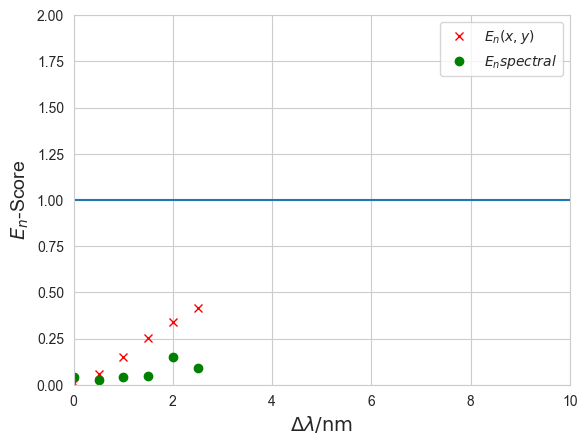

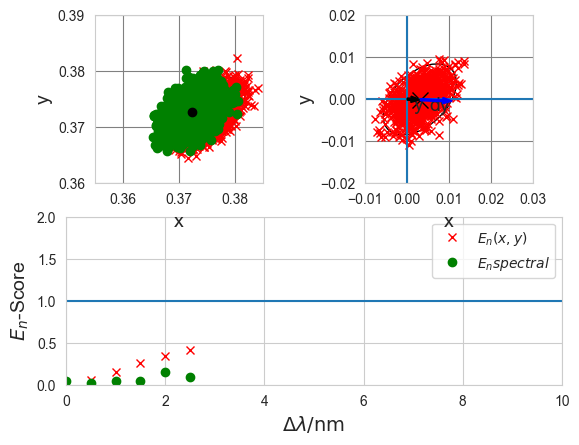

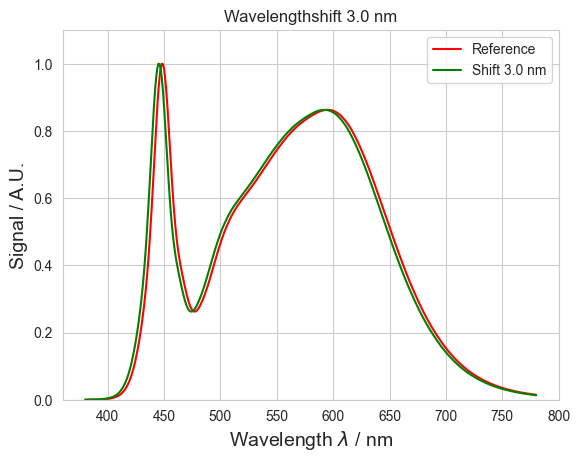

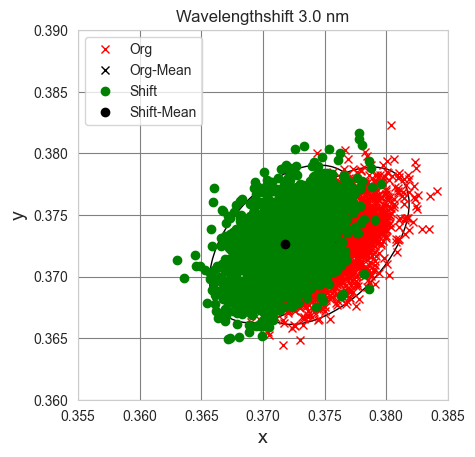

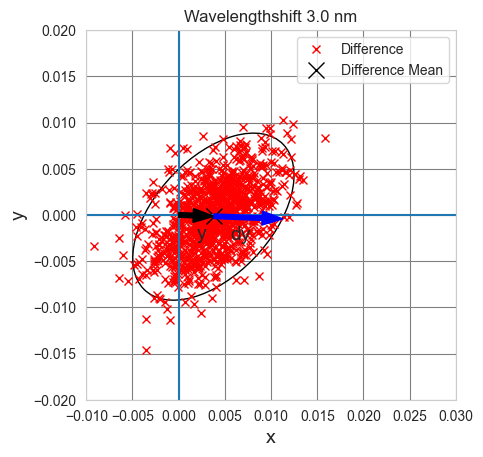

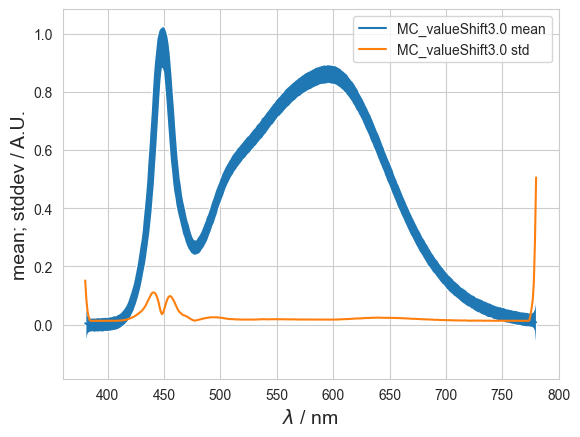

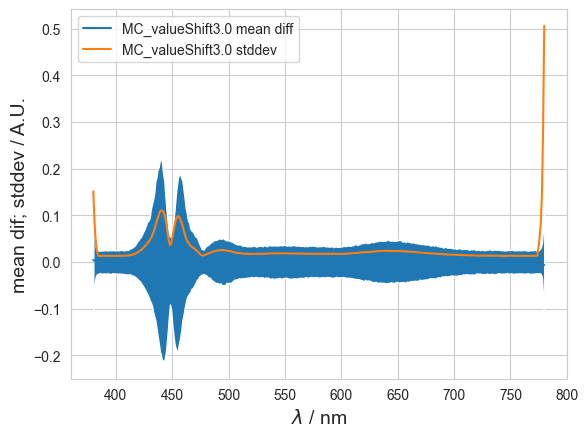

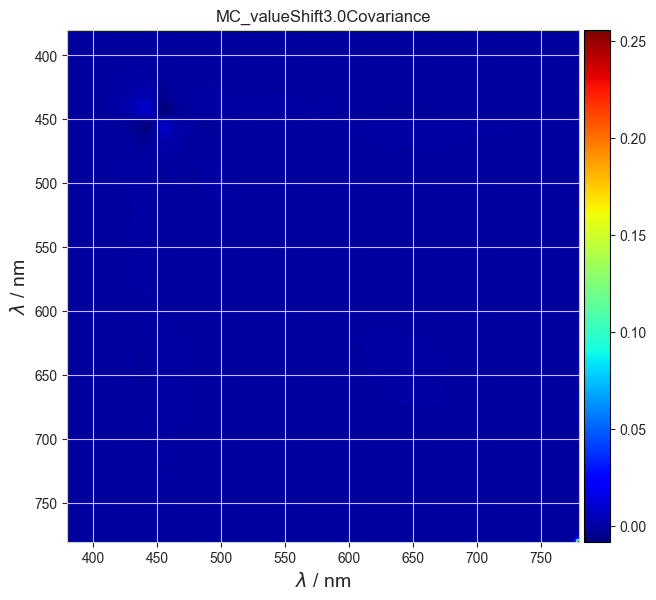

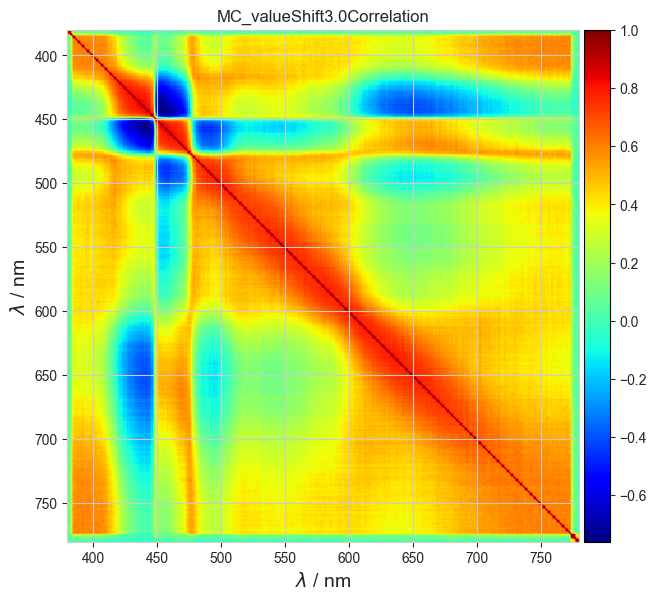

chisquare: 448.690621241841
Difference Vecotr: [-2.4900e-03 1.1856e-03 2.1937e-04 5.4505e-04 6.0511e-07 -1.8419e-04
 4.3259e-04 1.7106e-04 -4.7548e-04 -5.3833e-04 -5.2571e-04 -2.1078e-04
 -3.6660e-05 -2.9343e-04 -5.2901e-04 -7.6617e-04 -4.4189e-04 -8.0532e-04
 -1.3398e-03 -1.3708e-03 -1.5297e-03 -2.3054e-03 -2.5295e-03 -2.6116e-03
 -2.6714e-03 -3.5088e-03 -3.8822e-03 -5.1648e-03 -5.9551e-03 -7.1313e-03
 -7.7623e-03 -9.5169e-03 -1.1683e-02 -1.3130e-02 -1.4948e-02 -1.7769e-02
 -2.0780e-02 -2.2954e-02 -2.5648e-02 -2.9342e-02 -3.1641e-02 -3.6321e-02
 -4.1010e-02 -4.4756e-02 -4.9149e-02 -5.3793e-02 -5.7531e-02 -6.2443e-02
 -6.9788e-02 -7.5851e-02 -8.4443e-02 -9.2564e-02 -1.0349e-01 -1.1242e-01
 -1.2824e-01 -1.4079e-01 -1.5111e-01 -1.6281e-01 -1.6865e-01 -1.7233e-01
 -1.7011e-01 -1.6330e-01 -1.4925e-01 -1.2911e-01 -1.0073e-01 -6.7964e-02
 -3.1631e-02 3.1049e-03 3.8380e-02 7.1918e-02 1.0055e-01 1.2195e-01
 1.3616e-01 1.4642e-01 1.5101e-01 1.4774e-01 1.3781e-01 1.2707e-01
 1.1379e-01 1.0050e-0

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [4.4498e-03 -2.7666e-04] 0.004458356841970095
Resulting Covariance Matrix: [[1.2651e-05 6.3290e-06]
 [6.3290e-06 1.3692e-05]]
dy: 0.007424752291277617
DoE: 0.6004721325461111
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375601  6.376306e-04   
0           wl_noise_c    0    1.0  0       normal  0.375637  1.285177e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375611  1.821921e-03   
0       value_noise_nc    0   0.01  0       normal  0.375610  2.222570

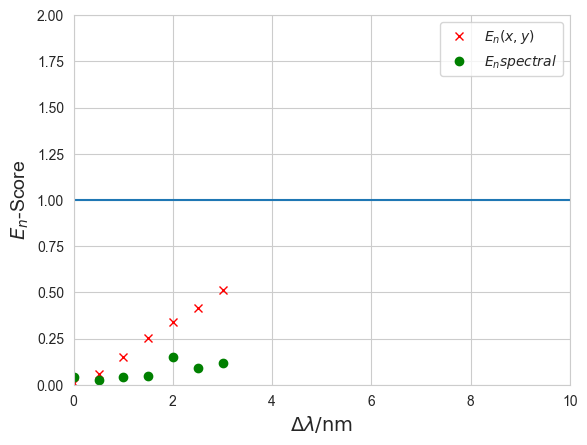

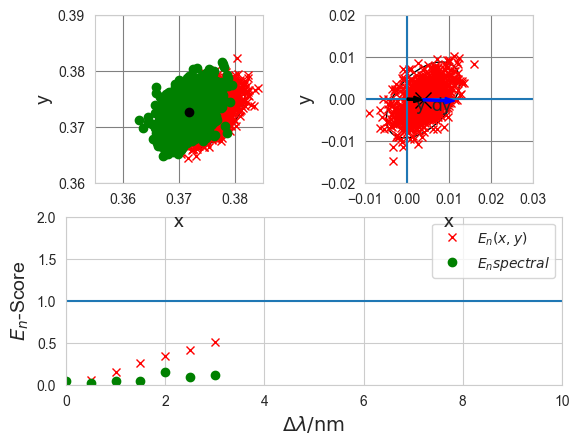

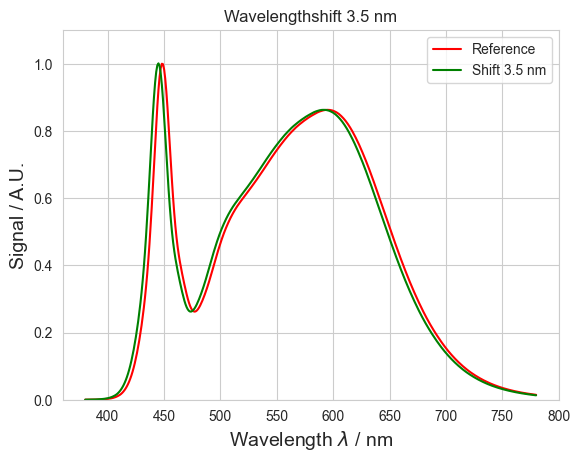

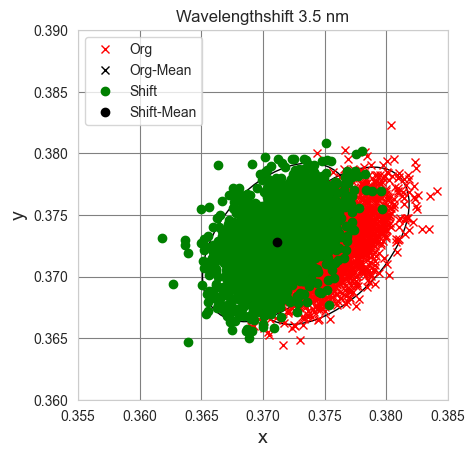

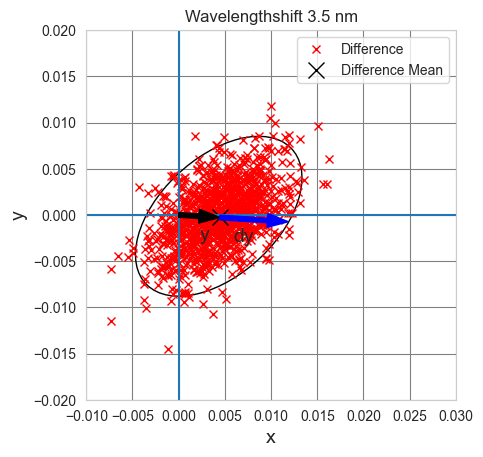

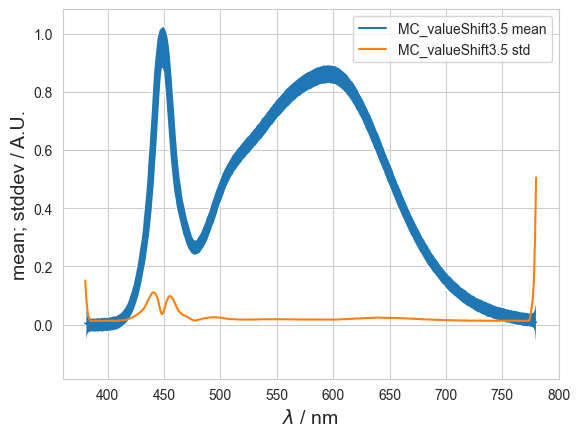

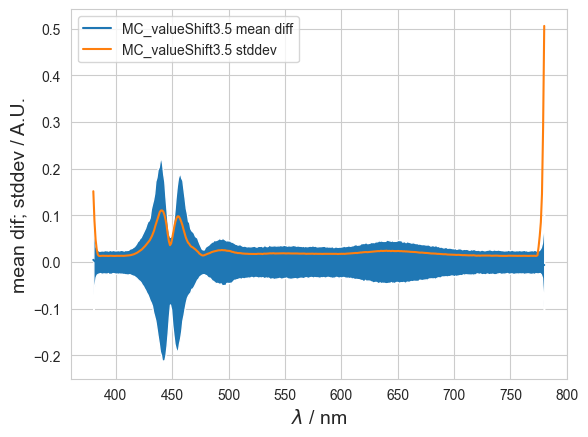

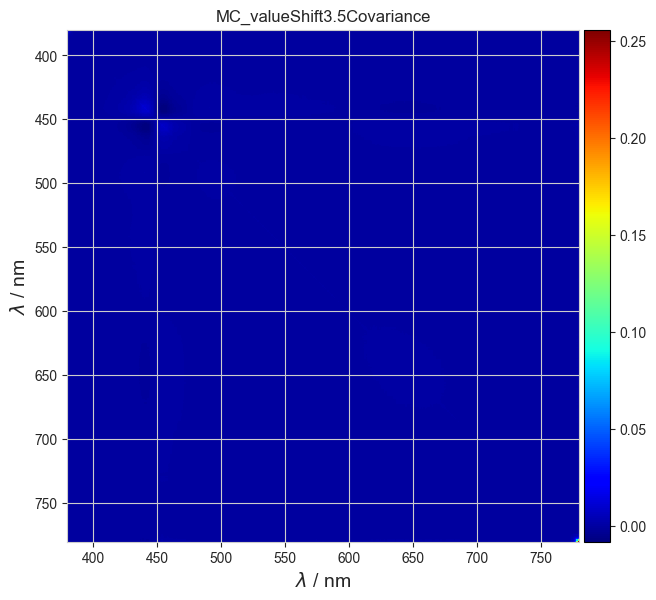

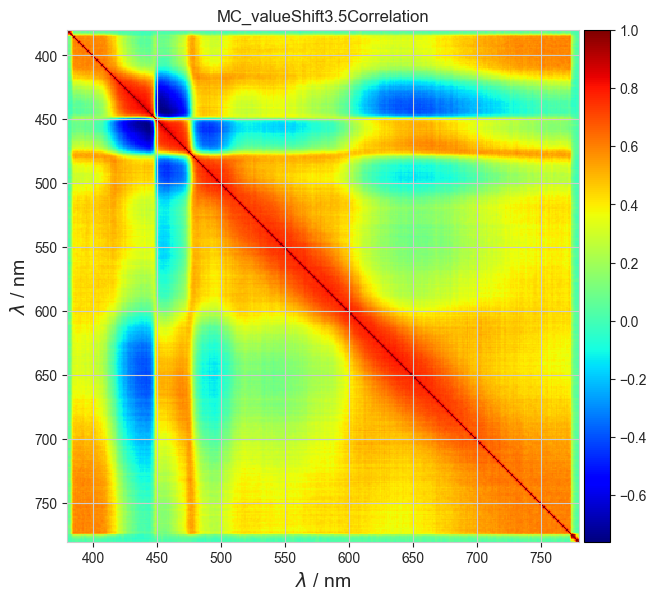

chisquare: 448.690621241841
Difference Vecotr: [-2.7111e-03 -3.4663e-03 -2.4314e-03 -1.1638e-04 5.2973e-04 3.3259e-04
 4.5493e-04 2.3249e-04 -3.0585e-04 -3.3633e-04 -3.2621e-04 2.5049e-04
 1.5841e-04 3.2128e-05 -1.1471e-04 -4.1170e-04 -4.7587e-04 -1.1257e-03
 -1.2075e-03 -1.4084e-03 -1.7906e-03 -2.0565e-03 -2.4106e-03 -2.5591e-03
 -3.4180e-03 -4.3593e-03 -4.9310e-03 -6.2788e-03 -7.1638e-03 -8.4840e-03
 -9.4735e-03 -1.1462e-02 -1.3812e-02 -1.5867e-02 -1.8435e-02 -2.1720e-02
 -2.4887e-02 -2.7680e-02 -3.1539e-02 -3.5640e-02 -3.8905e-02 -4.3953e-02
 -4.8980e-02 -5.3250e-02 -5.8227e-02 -6.2835e-02 -6.8601e-02 -7.6200e-02
 -8.4226e-02 -9.1418e-02 -1.0103e-01 -1.1268e-01 -1.2444e-01 -1.3825e-01
 -1.5404e-01 -1.6646e-01 -1.7883e-01 -1.9359e-01 -2.0062e-01 -2.0159e-01
 -1.9808e-01 -1.8858e-01 -1.6931e-01 -1.4267e-01 -1.0753e-01 -6.8275e-02
 -2.6803e-02 1.4839e-02 5.5808e-02 9.3640e-02 1.2399e-01 1.4950e-01
 1.6833e-01 1.7613e-01 1.7584e-01 1.7095e-01 1.6019e-01 1.4581e-01
 1.3037e-01 1.1369e-01

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [5.0384e-03 -4.2378e-04] 0.005056198293932229
Resulting Covariance Matrix: [[1.2253e-05 5.6981e-06]
 [5.6981e-06 1.2929e-05]]
dy: 0.007374635324738126
DoE: 0.6856201115425019
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375601  6.376306e-04   
0           wl_noise_c    0    1.0  0       normal  0.375637  1.285177e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375611  1.821921e-03   
0       value_noise_nc    0   0.01  0       normal  0.375610  2.222570

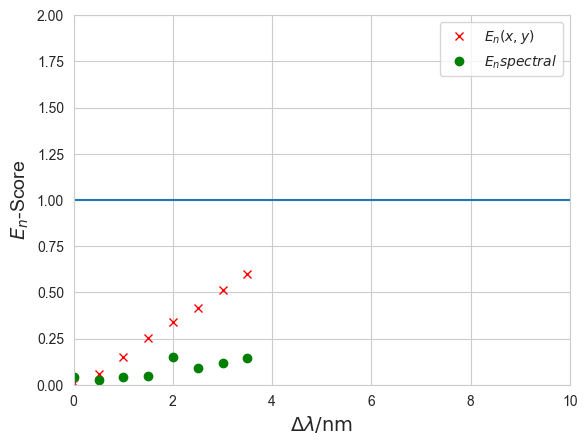

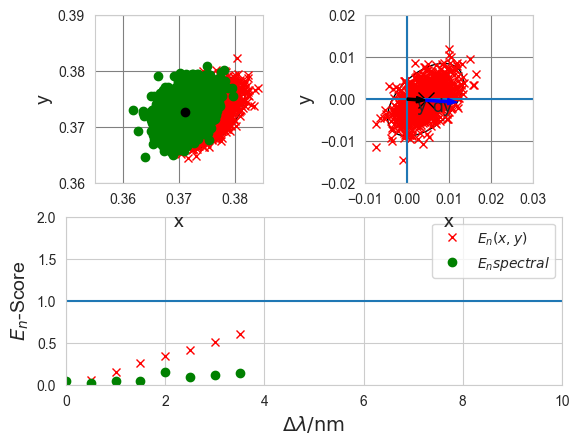

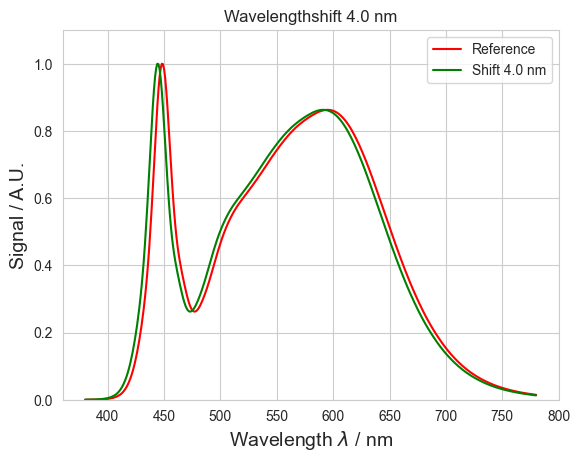

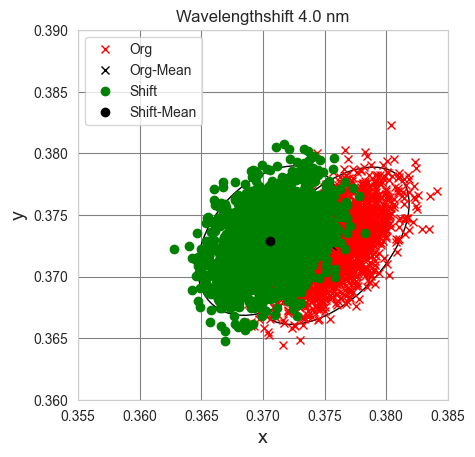

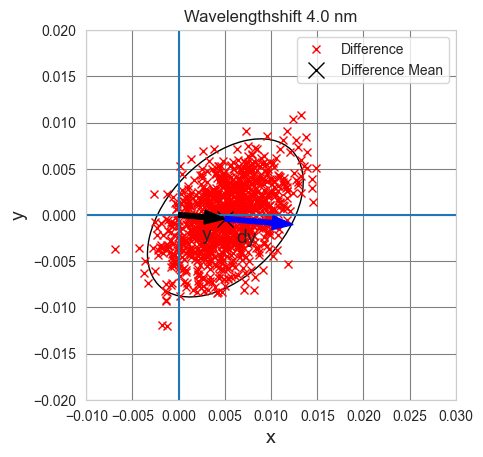

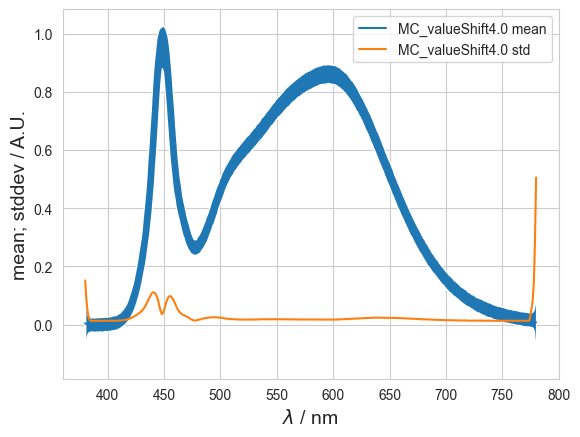

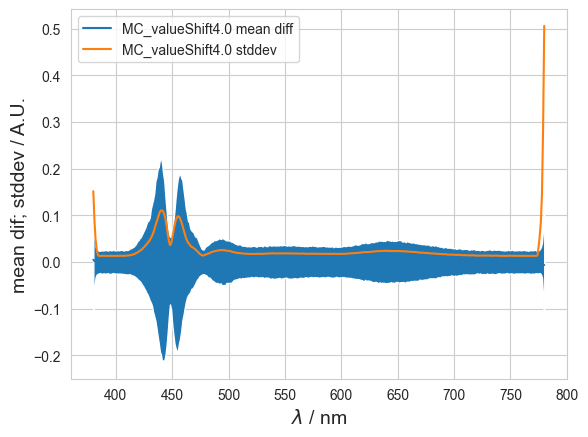

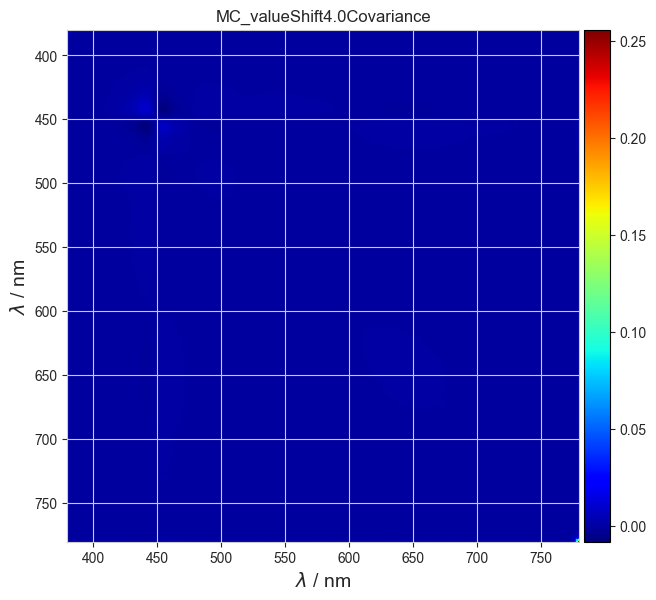

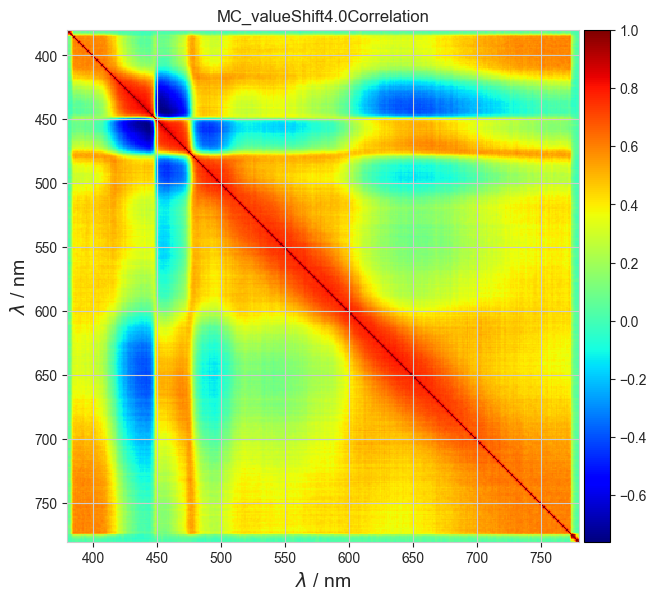

chisquare: 448.690621241841
Difference Vecotr: [-2.7964e-03 -3.5545e-03 -3.1099e-03 -1.1124e-03 -7.5104e-04 -2.3968e-04
 -6.3042e-06 -8.2670e-05 -7.3590e-04 -4.8578e-04 -6.9077e-04 -6.1548e-04
 -8.7347e-04 -9.6557e-04 -1.0962e-03 -8.7583e-04 -9.3359e-04 -1.4221e-03
 -1.9318e-03 -1.9173e-03 -2.1867e-03 -2.7267e-03 -3.4042e-03 -3.8781e-03
 -4.6023e-03 -5.4062e-03 -6.3184e-03 -7.7208e-03 -8.8051e-03 -1.0094e-02
 -1.1619e-02 -1.4260e-02 -1.6858e-02 -1.9456e-02 -2.2130e-02 -2.5743e-02
 -2.9602e-02 -3.2832e-02 -3.6524e-02 -4.2059e-02 -4.5338e-02 -5.1236e-02
 -5.7137e-02 -6.2186e-02 -6.7927e-02 -7.4061e-02 -7.9992e-02 -8.7472e-02
 -9.6547e-02 -1.0689e-01 -1.1594e-01 -1.2844e-01 -1.4359e-01 -1.5889e-01
 -1.7680e-01 -1.9401e-01 -2.0677e-01 -2.2056e-01 -2.2634e-01 -2.2694e-01
 -2.1991e-01 -2.0536e-01 -1.8224e-01 -1.5179e-01 -1.1121e-01 -6.6771e-02
 -1.8723e-02 2.7552e-02 7.1097e-02 1.1309e-01 1.4749e-01 1.7287e-01
 1.8823e-01 1.9764e-01 1.9504e-01 1.9104e-01 1.7760e-01 1.6160e-01
 1.4312e-01 1.2

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [5.6339e-03 -5.6961e-04] 0.00566266091646253
Resulting Covariance Matrix: [[1.2619e-05 5.8667e-06]
 [5.8667e-06 1.3033e-05]]
dy: 0.007406770438514142
DoE: 0.7645249658363256
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375601  6.376306e-04   
0           wl_noise_c    0    1.0  0       normal  0.375637  1.285177e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375611  1.821921e-03   
0       value_noise_nc    0   0.01  0       normal  0.375610  2.222570e

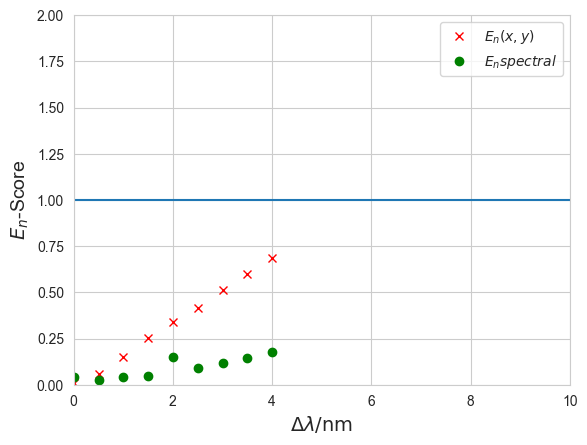

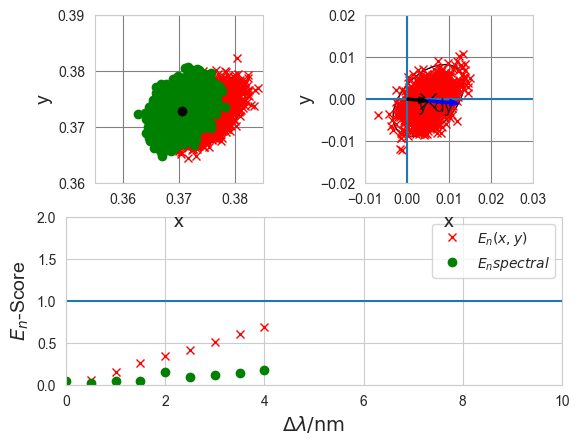

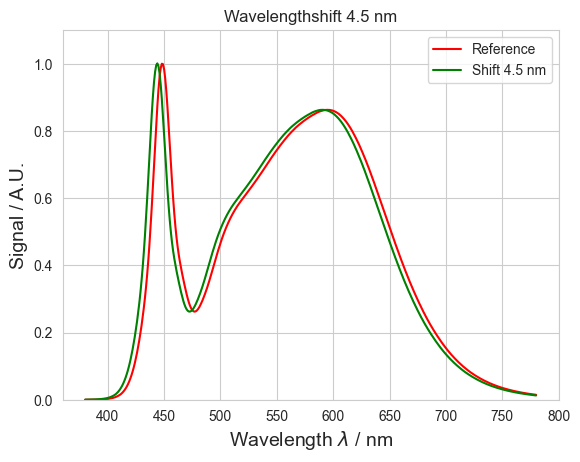

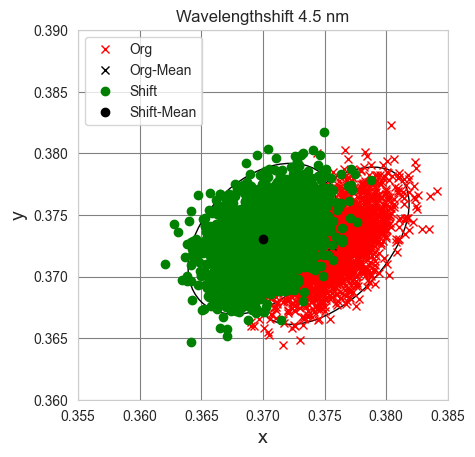

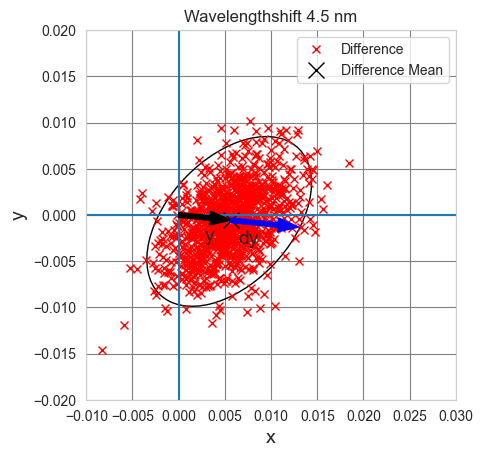

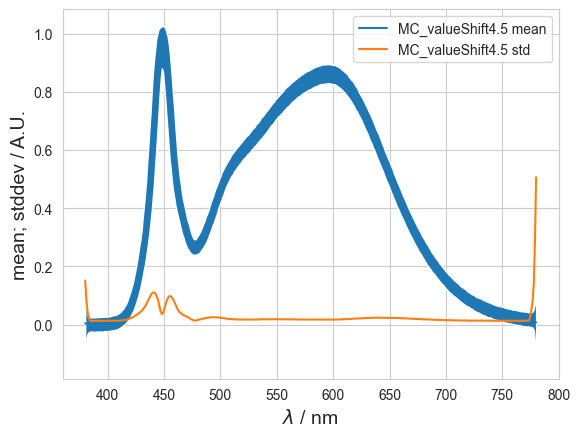

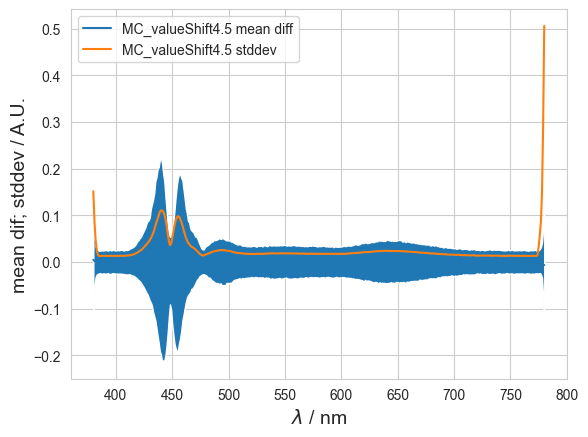

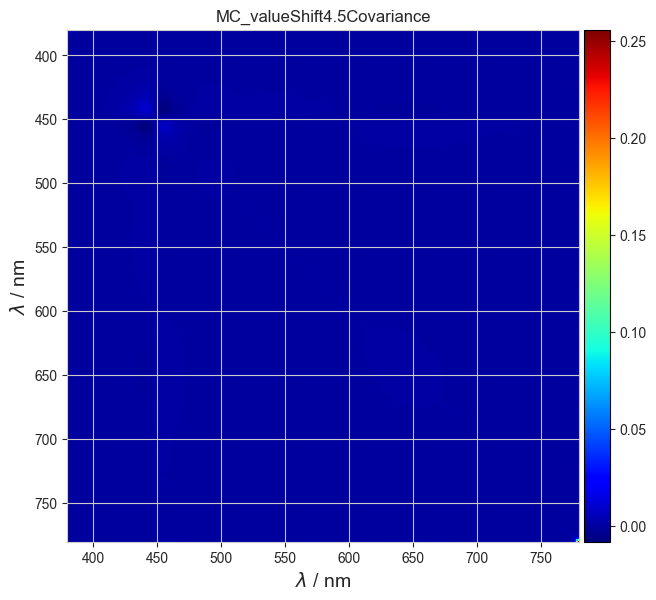

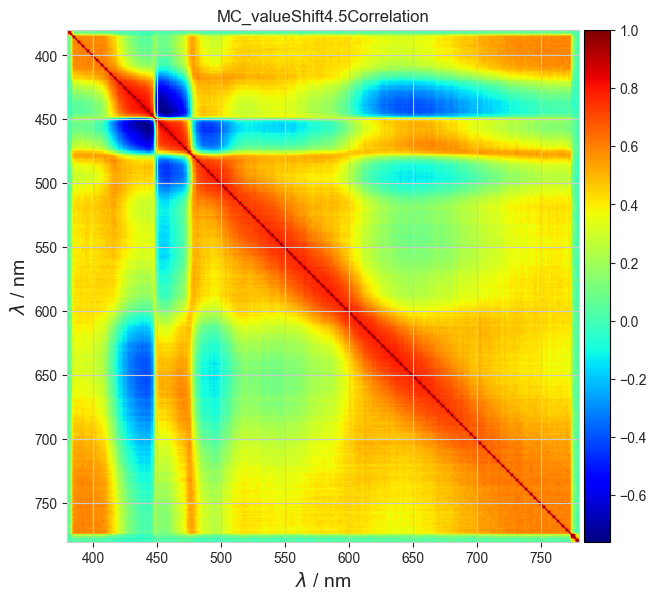

chisquare: 448.690621241841
Difference Vecotr: [-1.8037e-02 -6.2422e-03 -5.1959e-04 7.0041e-04 5.9779e-05 -1.5155e-04
 1.2598e-04 -9.9375e-05 -6.3297e-04 -5.8345e-04 -7.0968e-04 -6.3891e-04
 -6.5943e-04 -8.4355e-04 -1.0193e-03 -9.6918e-04 -9.4360e-04 -1.6013e-03
 -2.3899e-03 -2.3450e-03 -2.6194e-03 -3.5562e-03 -4.1144e-03 -4.3311e-03
 -5.0177e-03 -6.2297e-03 -7.4399e-03 -8.8507e-03 -1.0320e-02 -1.2079e-02
 -1.3845e-02 -1.6524e-02 -1.9627e-02 -2.2314e-02 -2.5584e-02 -3.0016e-02
 -3.4418e-02 -3.8848e-02 -4.3262e-02 -4.8242e-02 -5.3449e-02 -5.9246e-02
 -6.6242e-02 -7.1627e-02 -7.8289e-02 -8.5522e-02 -9.3618e-02 -1.0204e-01
 -1.1154e-01 -1.2435e-01 -1.3638e-01 -1.5170e-01 -1.6700e-01 -1.8568e-01
 -2.0665e-01 -2.2341e-01 -2.3637e-01 -2.4946e-01 -2.5526e-01 -2.5172e-01
 -2.4218e-01 -2.2396e-01 -1.9524e-01 -1.5813e-01 -1.1174e-01 -6.1344e-02
 -7.3684e-03 4.4983e-02 9.2863e-02 1.3743e-01 1.7285e-01 1.9757e-01
 2.1367e-01 2.2174e-01 2.1765e-01 2.0927e-01 1.9446e-01 1.7599e-01
 1.5611e-01 1.3698

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [6.2480e-03 -7.6062e-04] 0.006294102307639795
Resulting Covariance Matrix: [[1.2348e-05 5.4049e-06]
 [5.4049e-06 1.2773e-05]]
dy: 0.0073993129686635
DoE: 0.8506333404595355
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375601  6.376306e-04   
0           wl_noise_c    0    1.0  0       normal  0.375637  1.285177e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375611  1.821921e-03   
0       value_noise_nc    0   0.01  0       normal  0.375610  2.222570e-

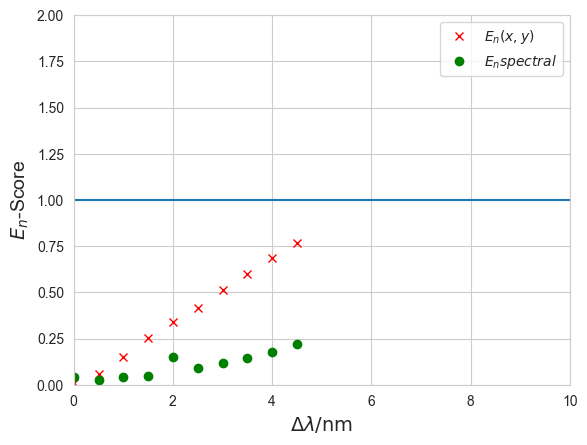

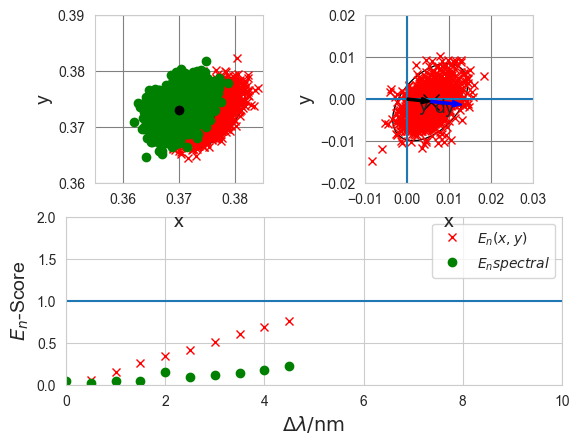

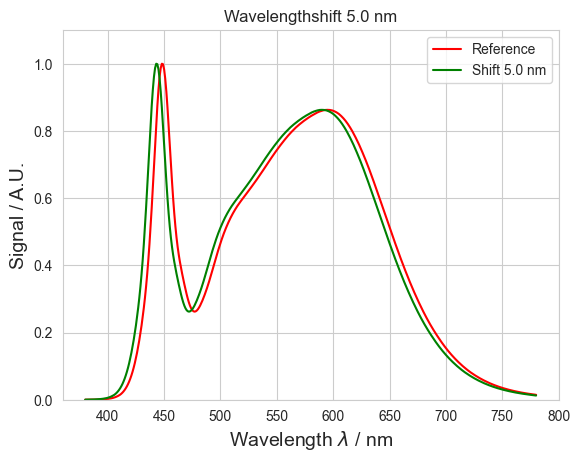

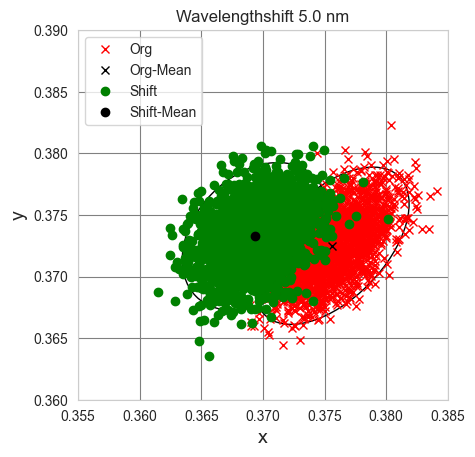

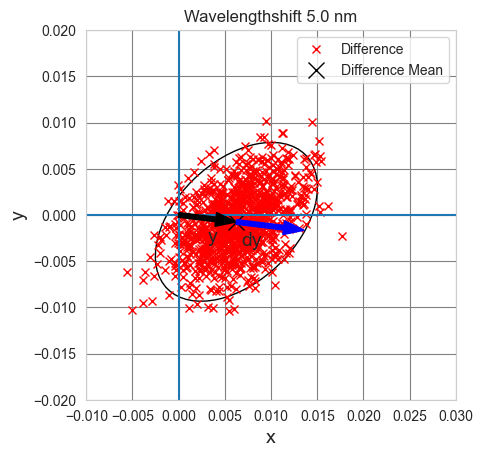

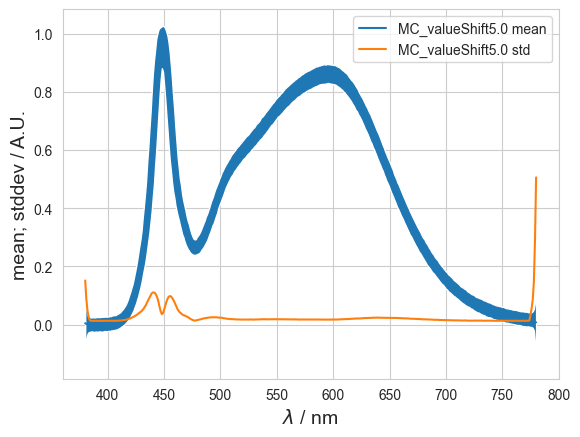

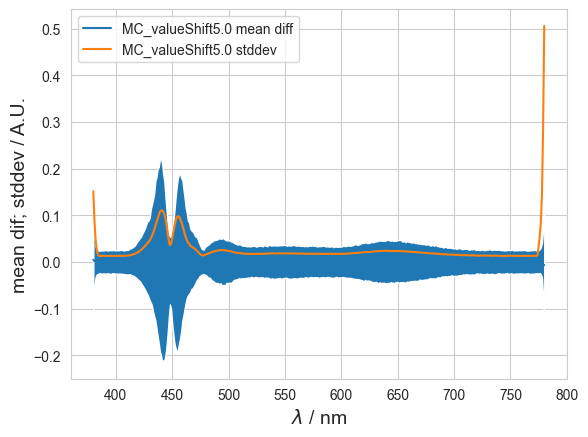

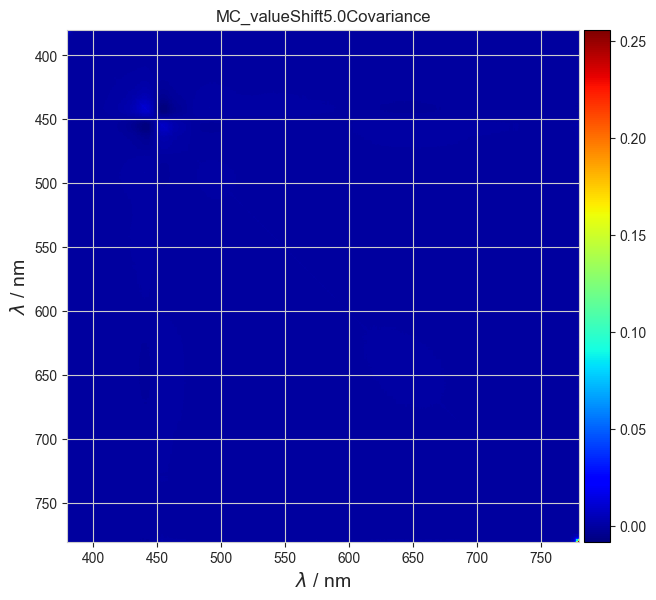

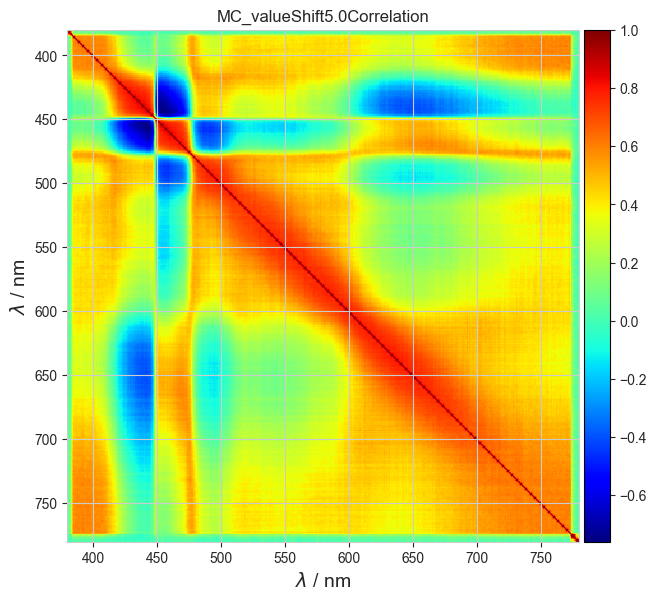

chisquare: 448.690621241841
Difference Vecotr: [-1.4864e-02 1.6330e-03 -1.0004e-04 5.5061e-05 6.5343e-05 -5.2355e-05
 -1.6938e-04 -1.9871e-04 -1.0502e-03 -9.7439e-04 -5.1239e-04 -4.6624e-04
 -5.5511e-04 -9.4690e-04 -1.2799e-03 -1.3233e-03 -1.5341e-03 -2.2659e-03
 -2.9614e-03 -3.1819e-03 -3.5375e-03 -4.0307e-03 -5.0482e-03 -5.2807e-03
 -6.0052e-03 -7.1903e-03 -8.9027e-03 -1.0680e-02 -1.2106e-02 -1.4391e-02
 -1.6185e-02 -1.9376e-02 -2.3161e-02 -2.6418e-02 -3.0085e-02 -3.4991e-02
 -3.9609e-02 -4.4469e-02 -4.9652e-02 -5.5800e-02 -6.1020e-02 -6.8075e-02
 -7.5795e-02 -8.2289e-02 -9.0611e-02 -9.8854e-02 -1.0780e-01 -1.1778e-01
 -1.2840e-01 -1.4193e-01 -1.5711e-01 -1.7312e-01 -1.9235e-01 -2.1318e-01
 -2.3496e-01 -2.5383e-01 -2.6708e-01 -2.7958e-01 -2.8372e-01 -2.7989e-01
 -2.6686e-01 -2.4308e-01 -2.0791e-01 -1.6500e-01 -1.1107e-01 -5.3707e-02
 5.9286e-03 6.2564e-02 1.1742e-01 1.6341e-01 2.0104e-01 2.2552e-01
 2.4155e-01 2.4710e-01 2.4204e-01 2.3092e-01 2.1360e-01 1.9151e-01
 1.6975e-01 1.4948e

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [6.7979e-03 -9.5412e-04] 0.006864526309606684
Resulting Covariance Matrix: [[1.2171e-05 5.7656e-06]
 [5.7656e-06 1.3053e-05]]
dy: 0.007174563986841576
DoE: 0.9567865478928737
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375601  6.376306e-04   
0           wl_noise_c    0    1.0  0       normal  0.375637  1.285177e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375611  1.821921e-03   
0       value_noise_nc    0   0.01  0       normal  0.375610  2.222570

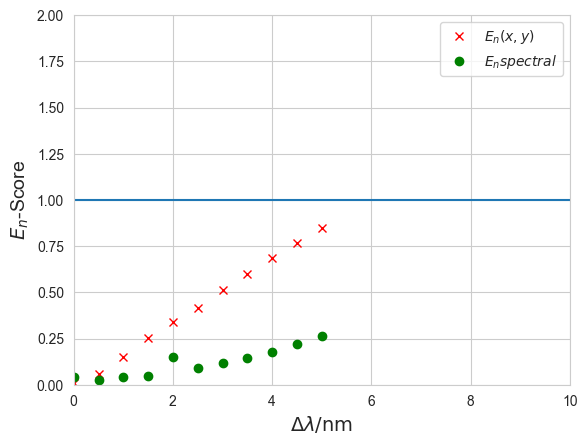

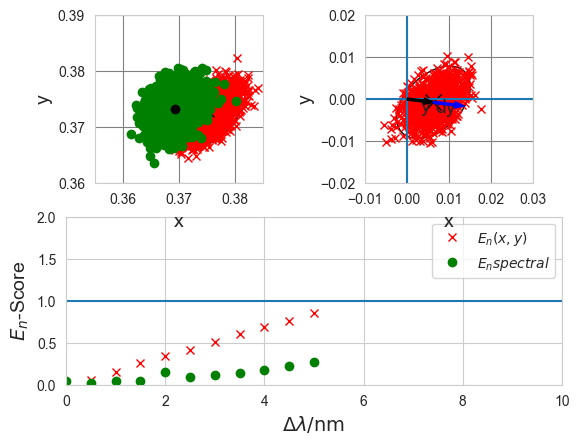

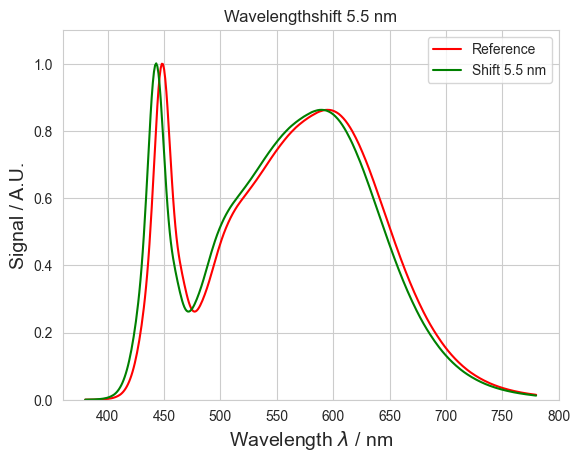

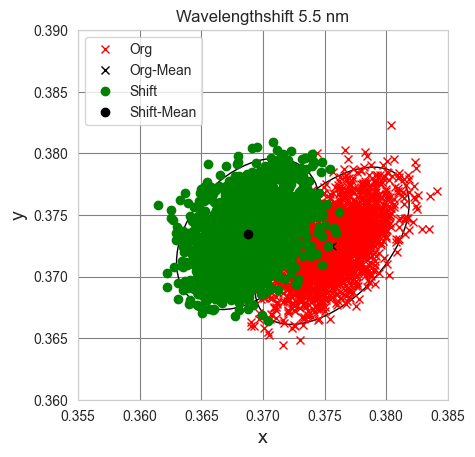

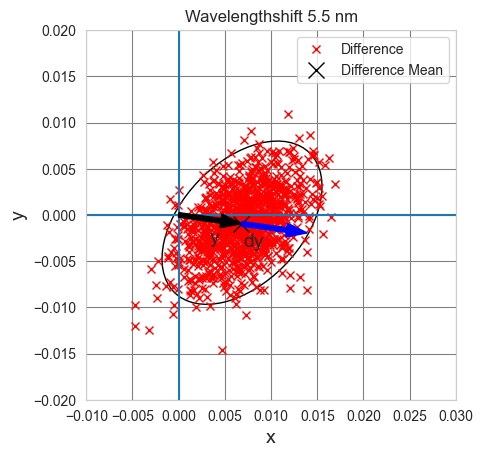

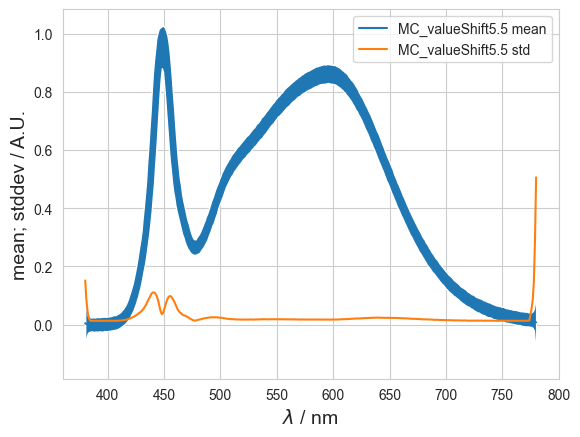

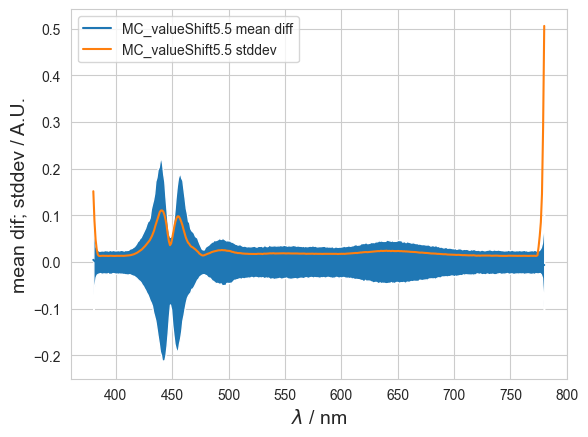

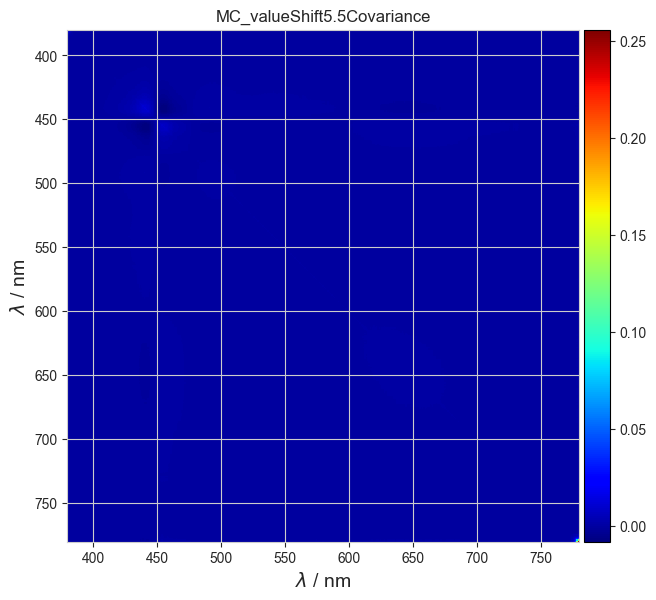

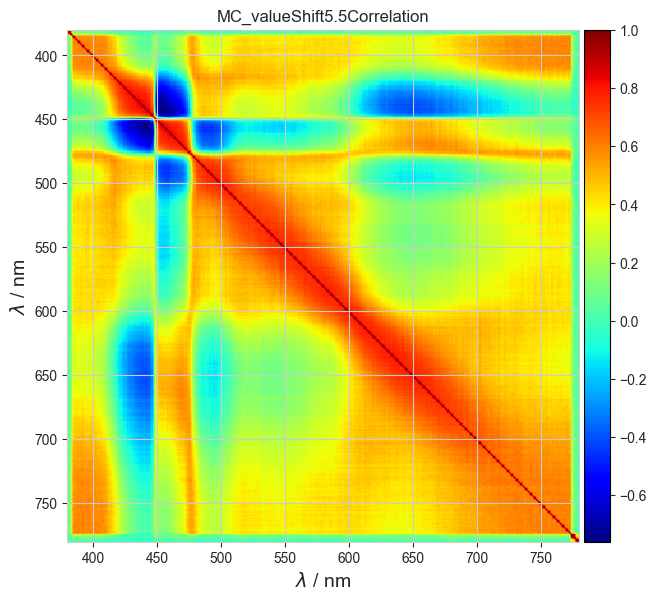

chisquare: 448.690621241841
Difference Vecotr: [2.5223e-02 8.2901e-03 3.2096e-03 9.5896e-04 2.9882e-04 2.0734e-04
 -1.6249e-04 -4.3472e-04 -6.1696e-04 -4.1926e-04 -4.3137e-04 -7.0307e-04
 -7.8757e-04 -1.0732e-03 -1.2449e-03 -1.5341e-03 -1.5604e-03 -2.2562e-03
 -2.6870e-03 -3.4210e-03 -3.7816e-03 -4.3271e-03 -5.2332e-03 -6.1139e-03
 -7.2462e-03 -8.7808e-03 -1.0346e-02 -1.1997e-02 -1.3598e-02 -1.6180e-02
 -1.8627e-02 -2.2076e-02 -2.6112e-02 -2.9580e-02 -3.4034e-02 -3.9111e-02
 -4.4536e-02 -4.9463e-02 -5.5867e-02 -6.2756e-02 -6.9093e-02 -7.7163e-02
 -8.5116e-02 -9.3121e-02 -1.0080e-01 -1.0941e-01 -1.2046e-01 -1.3193e-01
 -1.4534e-01 -1.5970e-01 -1.7609e-01 -1.9413e-01 -2.1597e-01 -2.3583e-01
 -2.6042e-01 -2.8009e-01 -2.9315e-01 -3.0471e-01 -3.0821e-01 -3.0069e-01
 -2.8223e-01 -2.5502e-01 -2.1521e-01 -1.6573e-01 -1.0670e-01 -4.4186e-02
 2.0468e-02 8.1364e-02 1.3743e-01 1.8622e-01 2.2482e-01 2.4945e-01
 2.6250e-01 2.6638e-01 2.6070e-01 2.4744e-01 2.2713e-01 2.0348e-01
 1.8034e-01 1.5759e-01

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [7.3081e-03 -1.1396e-03] 0.007396465121943854
Resulting Covariance Matrix: [[1.1922e-05 5.2908e-06]
 [5.2908e-06 1.3249e-05]]
dy: 0.007246409775780258
DoE: 1.0207075435707662
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375601  6.376306e-04   
0           wl_noise_c    0    1.0  0       normal  0.375637  1.285177e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375611  1.821921e-03   
0       value_noise_nc    0   0.01  0       normal  0.375610  2.222570

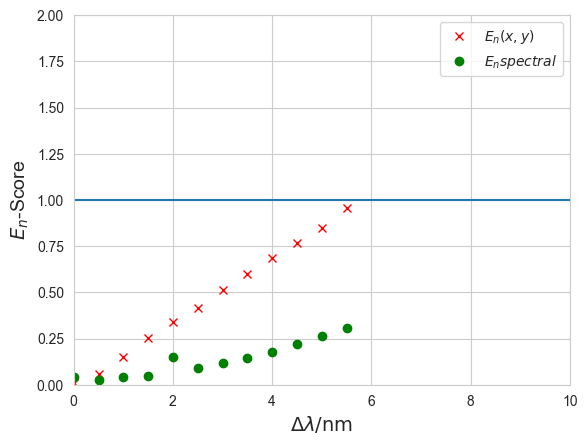

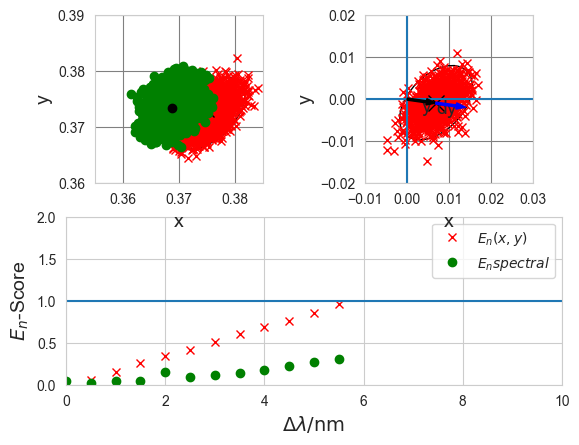

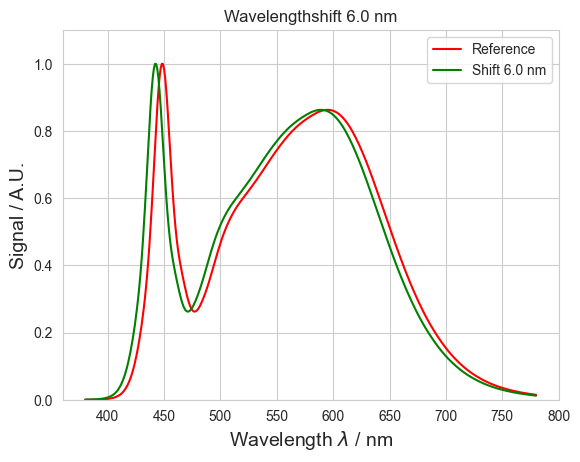

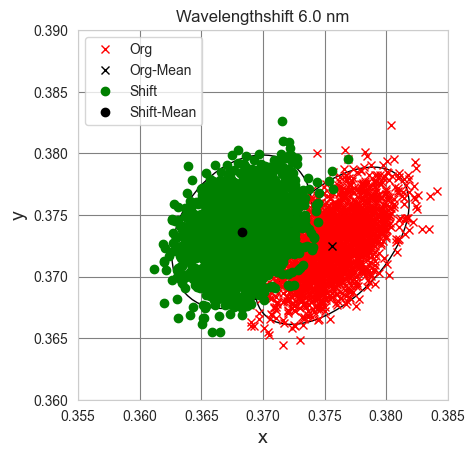

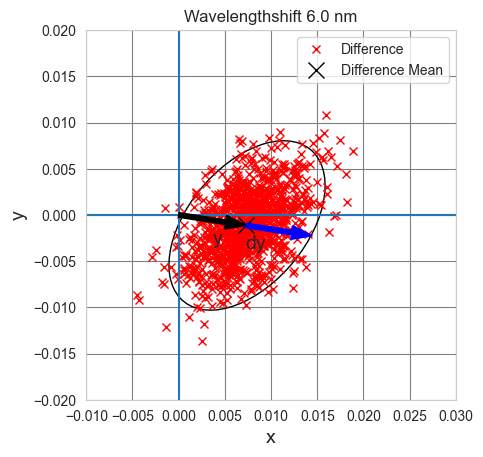

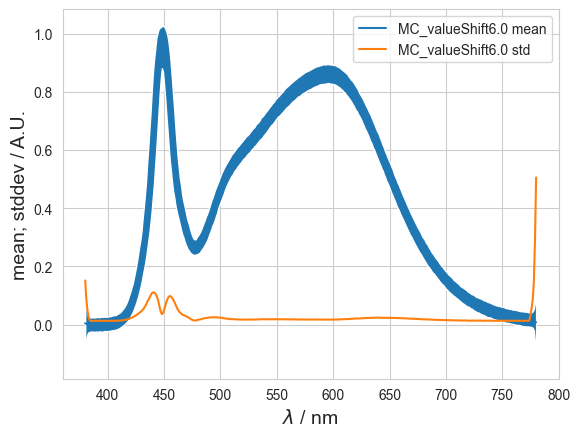

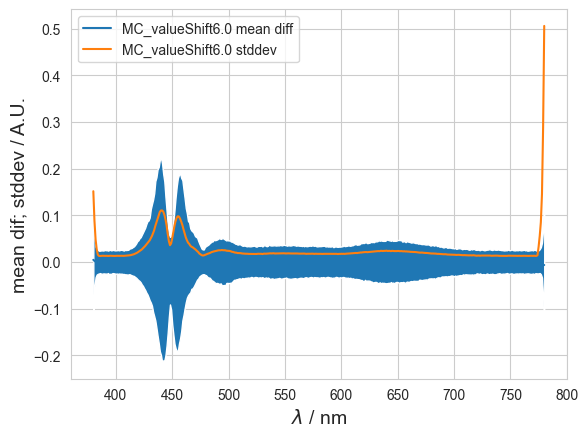

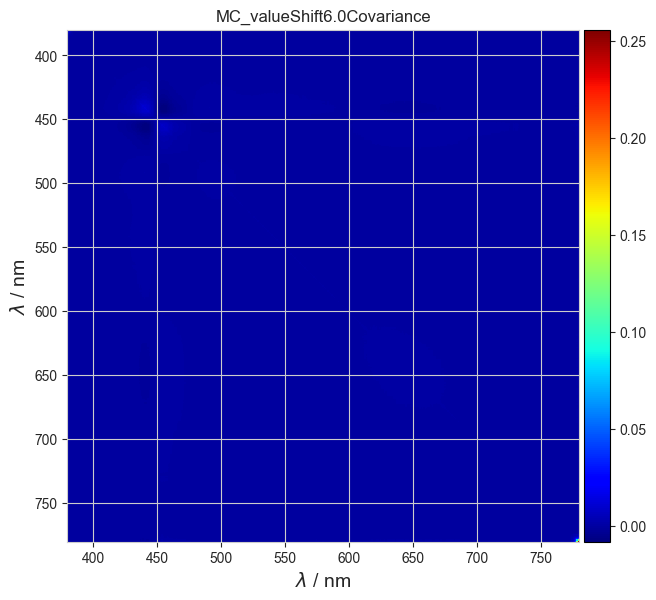

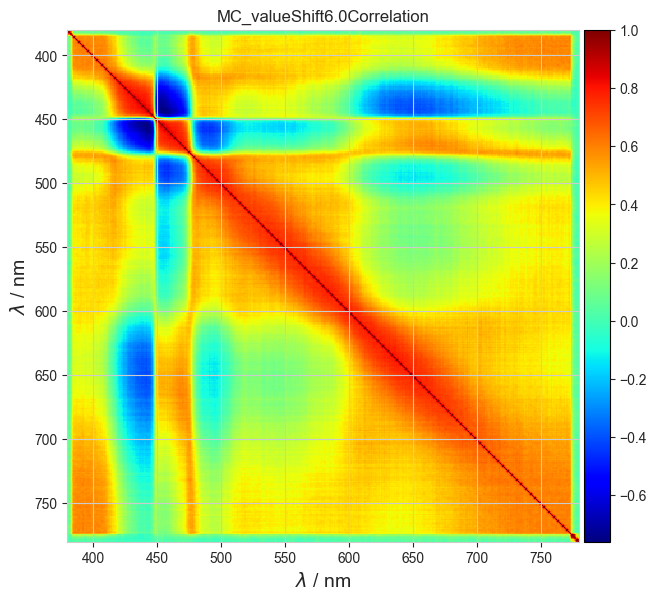

chisquare: 448.690621241841
Difference Vecotr: [4.2243e-03 3.6046e-03 1.0760e-03 1.0606e-03 7.2724e-05 -2.5178e-04
 -8.2043e-05 -4.0791e-04 -1.0720e-03 -1.1423e-03 -9.0815e-04 -6.5432e-04
 -1.0387e-03 -9.1953e-04 -1.2490e-03 -1.6618e-03 -2.1106e-03 -2.9007e-03
 -3.2982e-03 -3.9233e-03 -4.6691e-03 -5.4277e-03 -6.4250e-03 -7.1626e-03
 -8.1302e-03 -9.7287e-03 -1.1282e-02 -1.4114e-02 -1.6175e-02 -1.8496e-02
 -2.1393e-02 -2.5135e-02 -2.9379e-02 -3.3097e-02 -3.7460e-02 -4.3349e-02
 -4.9576e-02 -5.5013e-02 -6.1293e-02 -6.8220e-02 -7.5641e-02 -8.4164e-02
 -9.3608e-02 -1.0178e-01 -1.1140e-01 -1.2121e-01 -1.3222e-01 -1.4527e-01
 -1.5935e-01 -1.7634e-01 -1.9492e-01 -2.1681e-01 -2.3858e-01 -2.6159e-01
 -2.8474e-01 -3.0540e-01 -3.1999e-01 -3.3087e-01 -3.2894e-01 -3.1857e-01
 -2.9733e-01 -2.6441e-01 -2.1778e-01 -1.6326e-01 -9.9464e-02 -3.1805e-02
 3.6913e-02 1.0151e-01 1.5809e-01 2.0902e-01 2.4795e-01 2.7121e-01
 2.8417e-01 2.8562e-01 2.7768e-01 2.6093e-01 2.3888e-01 2.1444e-01
 1.8912e-01 1.6577e-0

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [7.8955e-03 -1.4282e-03] 0.00802364558390444
Resulting Covariance Matrix: [[1.1687e-05 5.1522e-06]
 [5.1522e-06 1.2871e-05]]
dy: 0.007120614940347795
DoE: 1.1268191934435001
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375601  6.376306e-04   
0           wl_noise_c    0    1.0  0       normal  0.375637  1.285177e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375611  1.821921e-03   
0       value_noise_nc    0   0.01  0       normal  0.375610  2.222570e

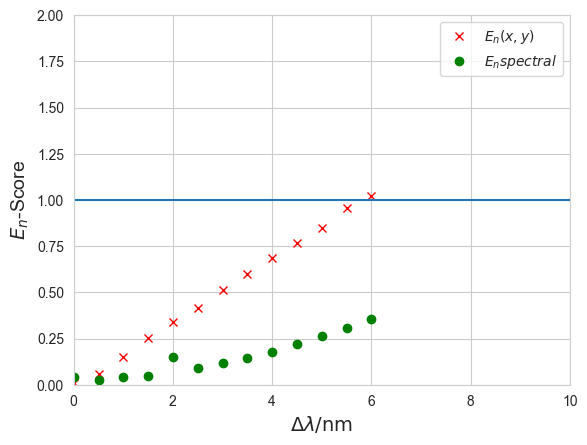

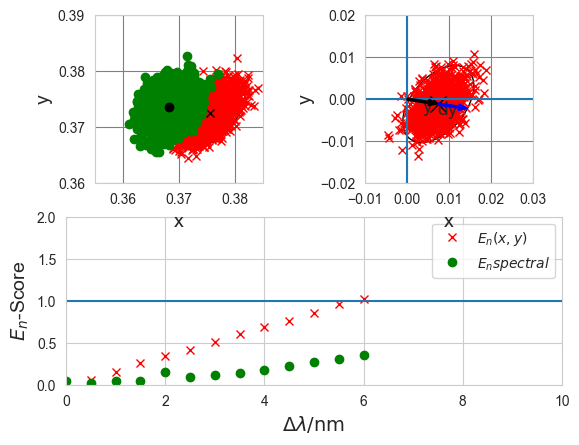

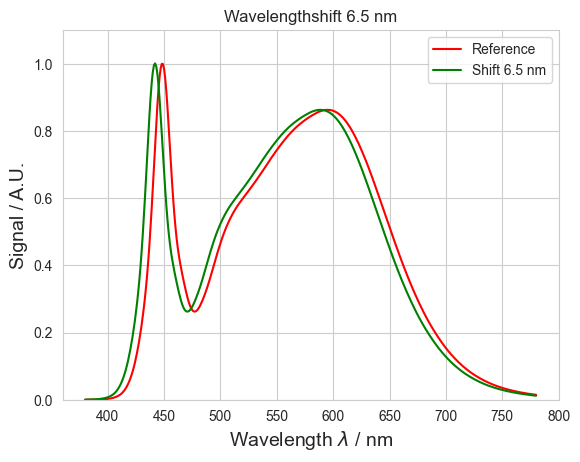

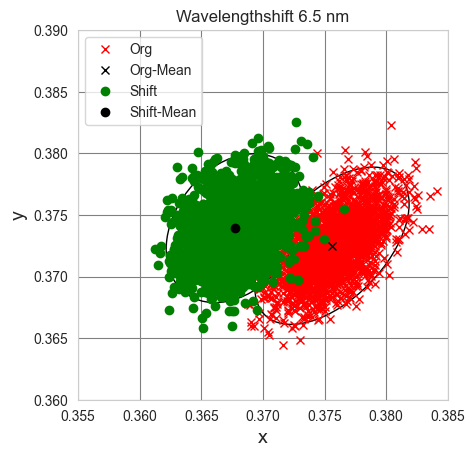

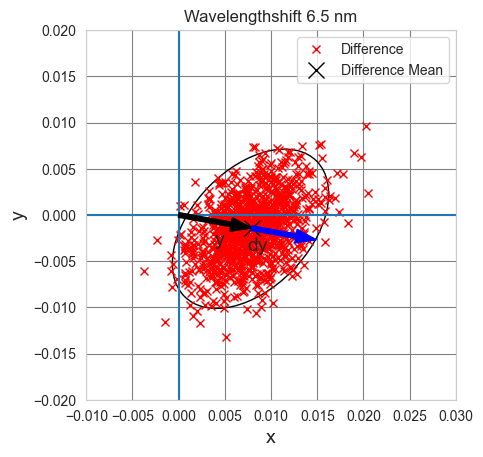

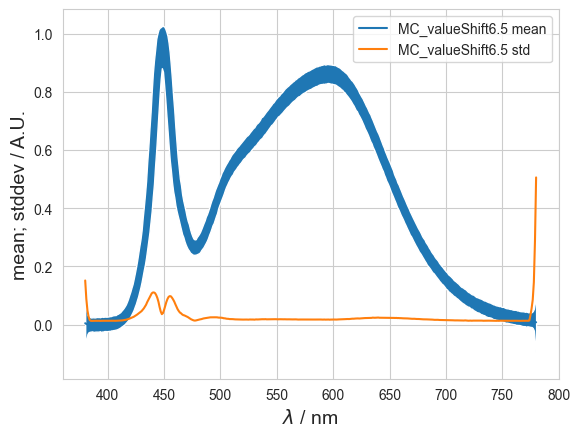

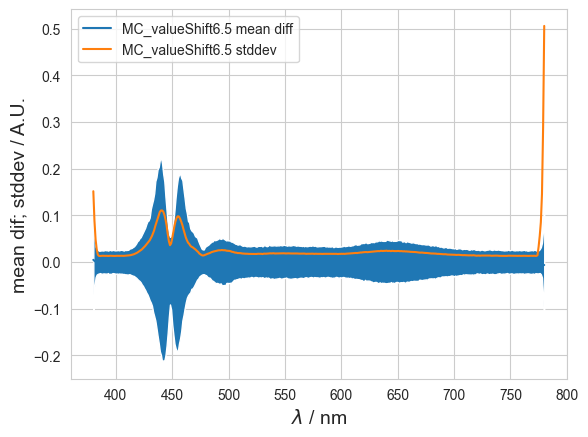

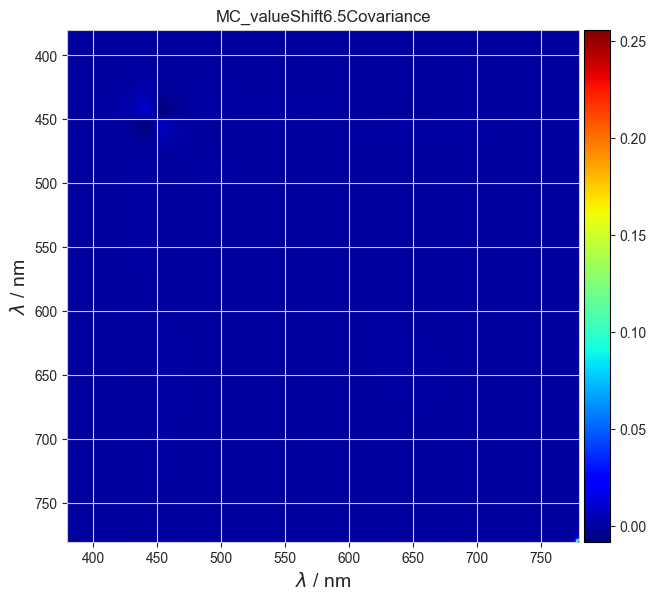

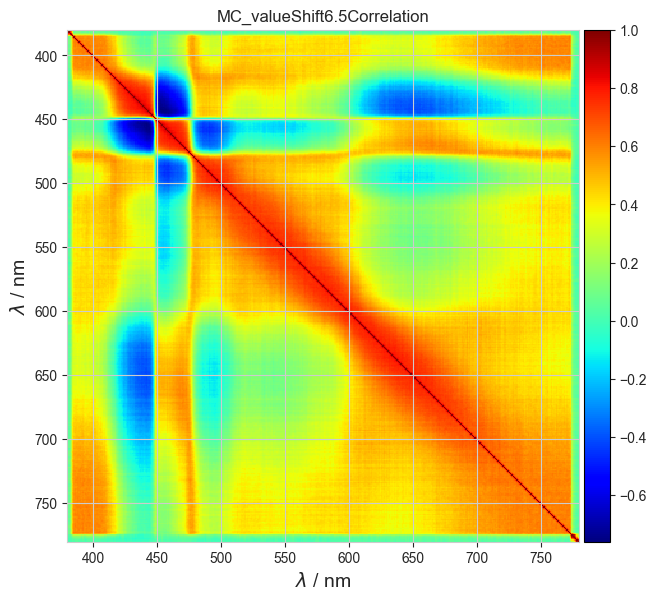

chisquare: 448.690621241841
Difference Vecotr: [-1.5197e-02 -5.7507e-03 -3.9749e-03 -5.9195e-04 5.5577e-04 6.9578e-05
 -4.3969e-05 -1.2895e-04 -7.2076e-04 -8.3763e-04 -9.4463e-04 -8.5631e-04
 -6.8223e-04 -1.1217e-03 -1.5755e-03 -1.4613e-03 -1.8003e-03 -2.5260e-03
 -3.5666e-03 -4.2291e-03 -4.6611e-03 -5.6177e-03 -6.5829e-03 -7.8368e-03
 -9.1749e-03 -1.1027e-02 -1.2846e-02 -1.5338e-02 -1.7711e-02 -2.0816e-02
 -2.3782e-02 -2.8060e-02 -3.2566e-02 -3.7266e-02 -4.2484e-02 -4.9206e-02
 -5.5219e-02 -6.1830e-02 -6.9810e-02 -7.8058e-02 -8.5533e-02 -9.4047e-02
 -1.0472e-01 -1.1395e-01 -1.2463e-01 -1.3726e-01 -1.4911e-01 -1.6396e-01
 -1.8194e-01 -2.0065e-01 -2.1968e-01 -2.4466e-01 -2.6859e-01 -2.9285e-01
 -3.1812e-01 -3.3958e-01 -3.5203e-01 -3.6075e-01 -3.5597e-01 -3.4057e-01
 -3.1344e-01 -2.7325e-01 -2.1940e-01 -1.5753e-01 -8.5935e-02 -1.2320e-02
 5.9984e-02 1.2918e-01 1.9012e-01 2.4026e-01 2.7683e-01 2.9994e-01
 3.0926e-01 3.0910e-01 2.9878e-01 2.7982e-01 2.5491e-01 2.2779e-01
 2.0241e-01 1.7747

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [8.4491e-03 -1.7312e-03] 0.00862463117699532
Resulting Covariance Matrix: [[1.1676e-05 4.8124e-06]
 [4.8124e-06 1.2746e-05]]
dy: 0.0071821448220848036
DoE: 1.2008433957604043
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375601  6.376306e-04   
0           wl_noise_c    0    1.0  0       normal  0.375637  1.285177e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375611  1.821921e-03   
0       value_noise_nc    0   0.01  0       normal  0.375610  2.222570

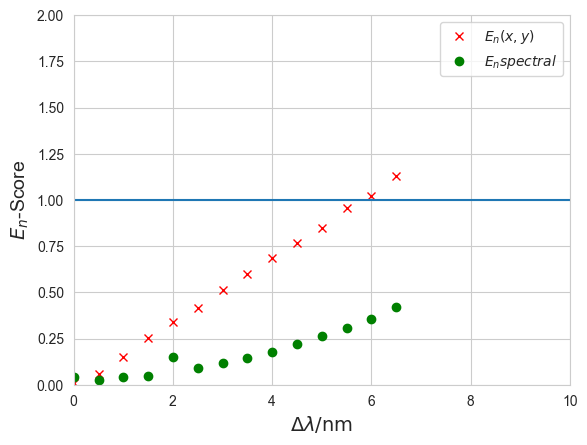

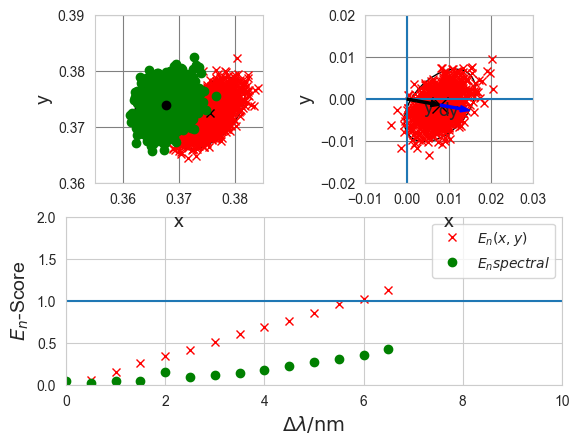

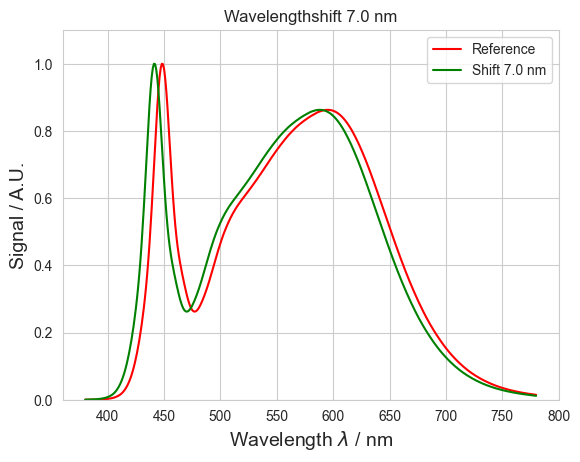

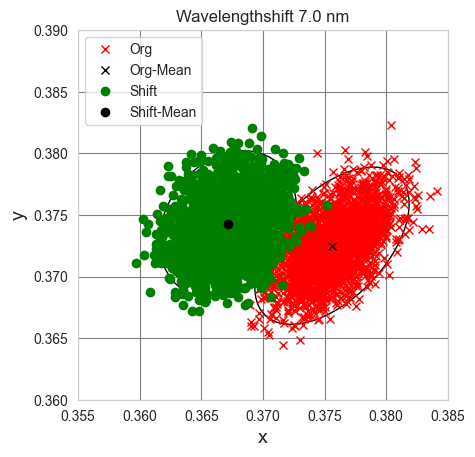

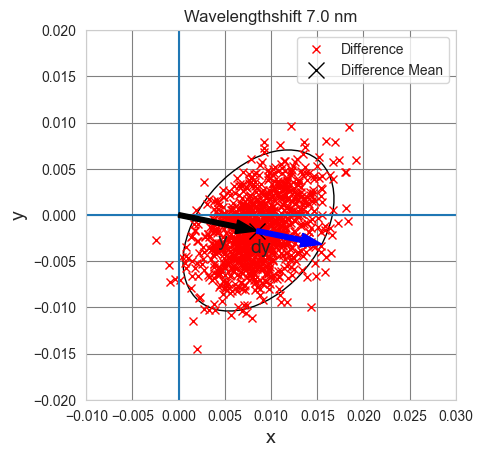

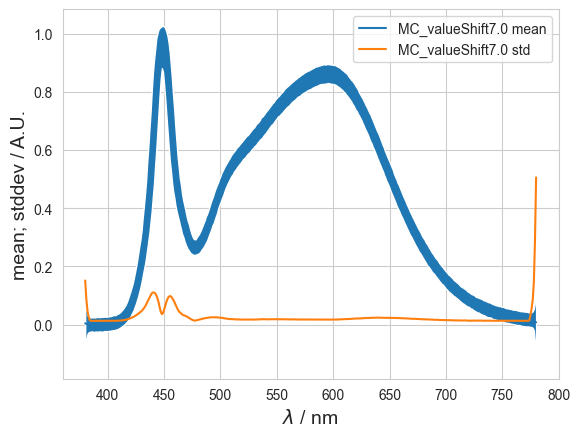

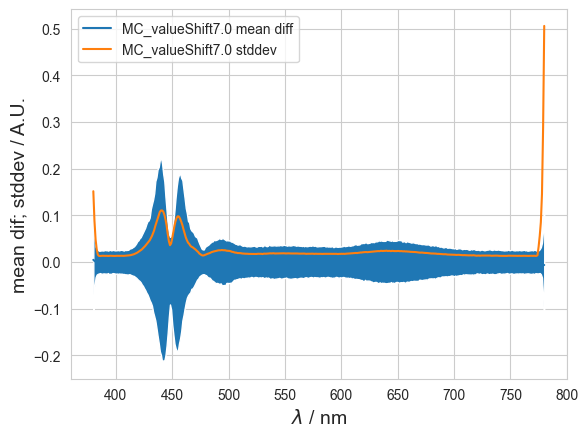

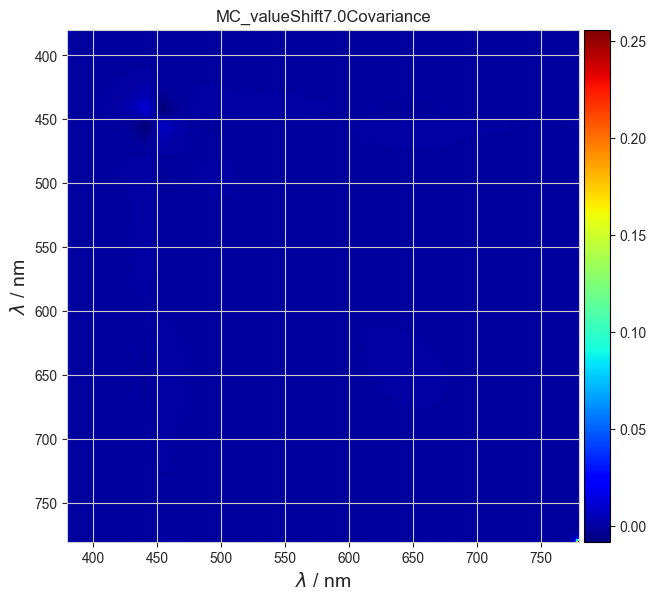

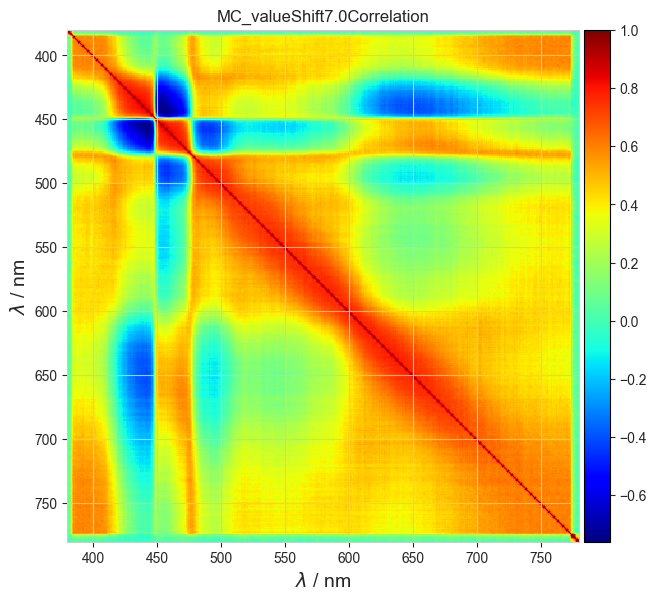

chisquare: 448.690621241841
Difference Vecotr: [1.9721e-03 4.8858e-04 -1.4983e-03 -8.3464e-04 -5.1049e-04 -1.5106e-05
 -5.9786e-05 -3.5179e-04 -8.3424e-04 -8.0895e-04 -9.2692e-04 -1.1906e-03
 -1.3765e-03 -1.4569e-03 -1.4719e-03 -2.3864e-03 -2.4567e-03 -3.3917e-03
 -4.1752e-03 -4.6230e-03 -5.4235e-03 -6.4455e-03 -7.9220e-03 -8.9727e-03
 -1.0804e-02 -1.2903e-02 -1.4726e-02 -1.7628e-02 -2.0501e-02 -2.3614e-02
 -2.7295e-02 -3.1662e-02 -3.6979e-02 -4.1927e-02 -4.8038e-02 -5.5228e-02
 -6.2454e-02 -7.0113e-02 -7.7777e-02 -8.6648e-02 -9.5951e-02 -1.0574e-01
 -1.1630e-01 -1.2593e-01 -1.3813e-01 -1.5073e-01 -1.6570e-01 -1.8165e-01
 -2.0014e-01 -2.2064e-01 -2.4453e-01 -2.6889e-01 -2.9475e-01 -3.2254e-01
 -3.4708e-01 -3.6820e-01 -3.7897e-01 -3.8493e-01 -3.7559e-01 -3.5546e-01
 -3.2239e-01 -2.7603e-01 -2.1686e-01 -1.4875e-01 -7.2754e-02 5.8225e-03
 8.2522e-02 1.5296e-01 2.1258e-01 2.6515e-01 3.0189e-01 3.2267e-01
 3.3118e-01 3.2861e-01 3.1445e-01 2.9305e-01 2.6687e-01 2.3814e-01
 2.1019e-01 1.8547e

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [9.1357e-03 -1.9457e-03] 0.009340655898949835
Resulting Covariance Matrix: [[1.1524e-05 4.6922e-06]
 [4.6922e-06 1.2534e-05]]
dy: 0.007136605144318838
DoE: 1.3088374248063241
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375601  6.376306e-04   
0           wl_noise_c    0    1.0  0       normal  0.375637  1.285177e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375611  1.821921e-03   
0       value_noise_nc    0   0.01  0       normal  0.375610  2.222570

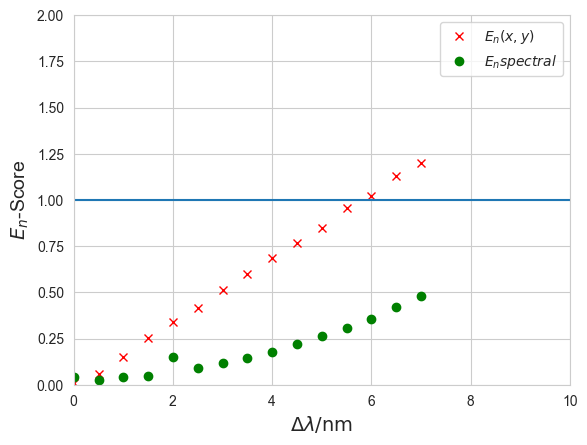

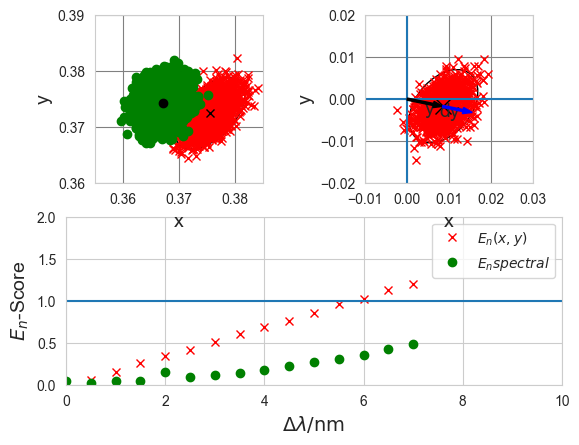

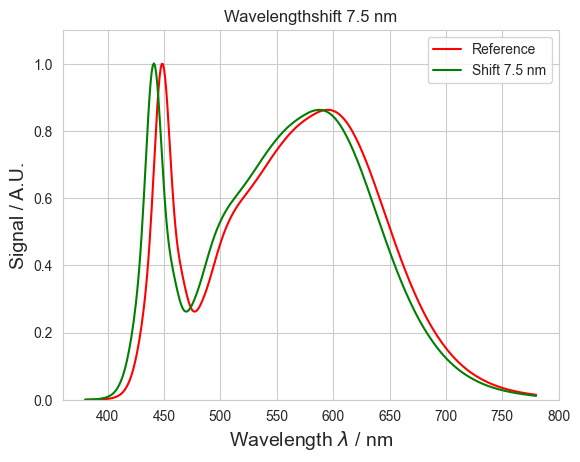

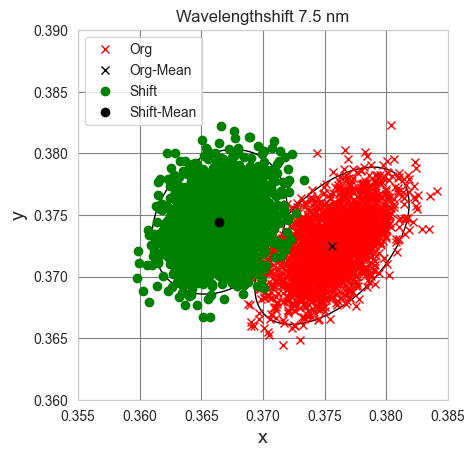

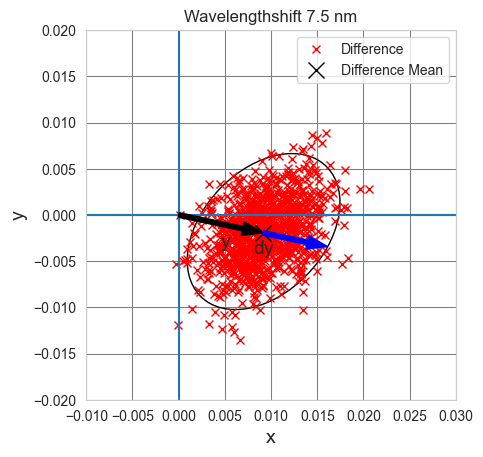

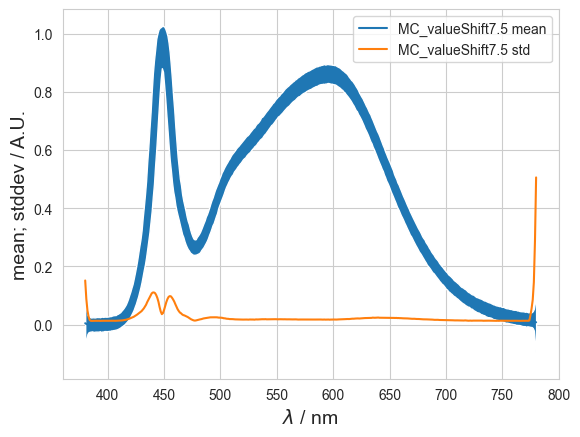

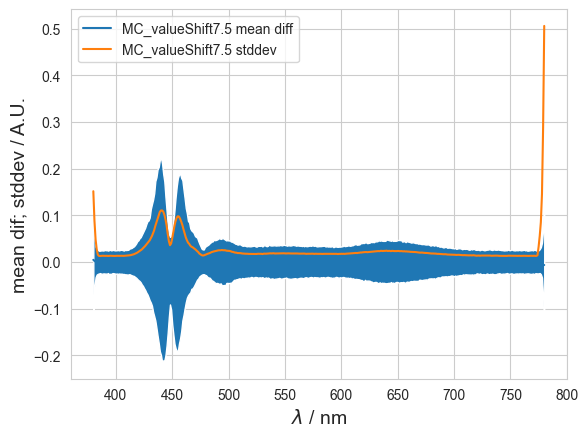

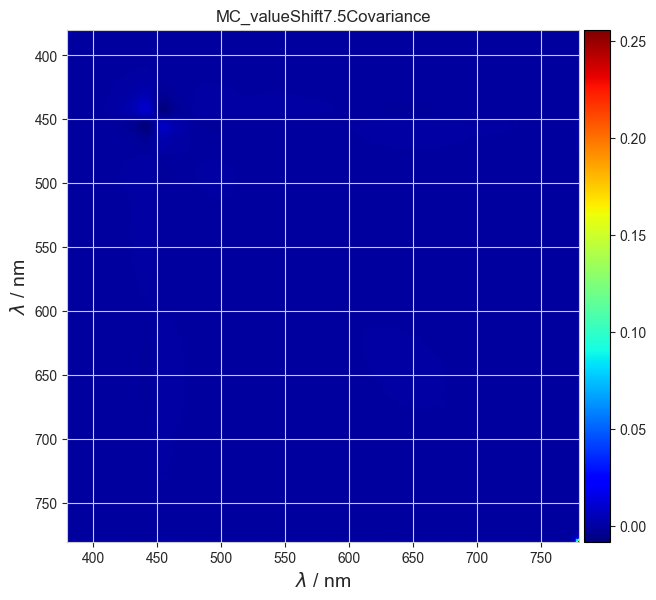

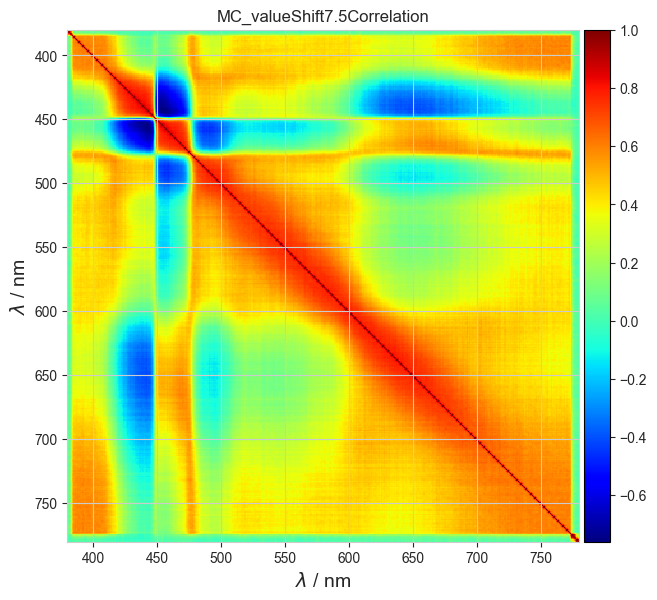

chisquare: 448.690621241841
Difference Vecotr: [-1.1153e-02 -5.0527e-03 -6.0996e-04 5.2450e-04 2.2816e-04 -2.4072e-04
 -2.3958e-04 -6.9240e-04 -1.3515e-03 -1.0209e-03 -1.3092e-03 -1.4682e-03
 -1.4427e-03 -1.4492e-03 -2.1906e-03 -2.5304e-03 -3.1536e-03 -3.8578e-03
 -4.6803e-03 -5.5288e-03 -6.5292e-03 -7.8562e-03 -8.7787e-03 -1.0100e-02
 -1.1839e-02 -1.4165e-02 -1.6494e-02 -1.9784e-02 -2.3021e-02 -2.6503e-02
 -3.0475e-02 -3.5942e-02 -4.2077e-02 -4.7342e-02 -5.3280e-02 -6.0647e-02
 -6.9090e-02 -7.6168e-02 -8.4886e-02 -9.5063e-02 -1.0434e-01 -1.1516e-01
 -1.2676e-01 -1.3798e-01 -1.5108e-01 -1.6529e-01 -1.8003e-01 -1.9876e-01
 -2.2086e-01 -2.4483e-01 -2.6861e-01 -2.9559e-01 -3.2261e-01 -3.4892e-01
 -3.7458e-01 -3.9523e-01 -4.0383e-01 -4.0589e-01 -3.9414e-01 -3.6843e-01
 -3.2901e-01 -2.7757e-01 -2.1294e-01 -1.3861e-01 -5.7609e-02 2.4314e-02
 1.0471e-01 1.7743e-01 2.3810e-01 2.8748e-01 3.2266e-01 3.4259e-01
 3.4838e-01 3.4382e-01 3.2795e-01 3.0552e-01 2.7738e-01 2.4772e-01
 2.2002e-01 1.9381e

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [9.6347e-03 -2.3337e-03] 0.00991329086319314
Resulting Covariance Matrix: [[1.1842e-05 4.7629e-06]
 [4.7629e-06 1.2828e-05]]
dy: 0.007195822465876884
DoE: 1.3776452810228004
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375601  6.376306e-04   
0           wl_noise_c    0    1.0  0       normal  0.375637  1.285177e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375611  1.821921e-03   
0       value_noise_nc    0   0.01  0       normal  0.375610  2.222570e

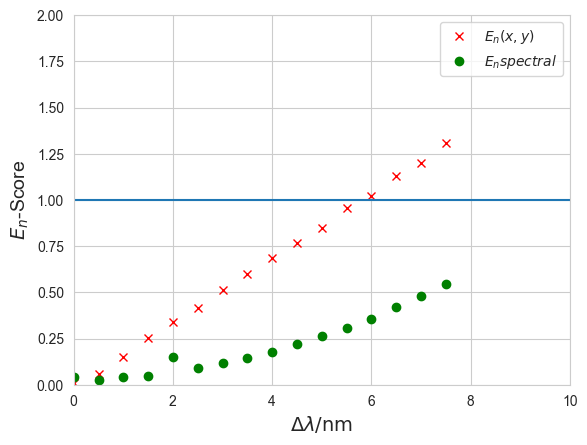

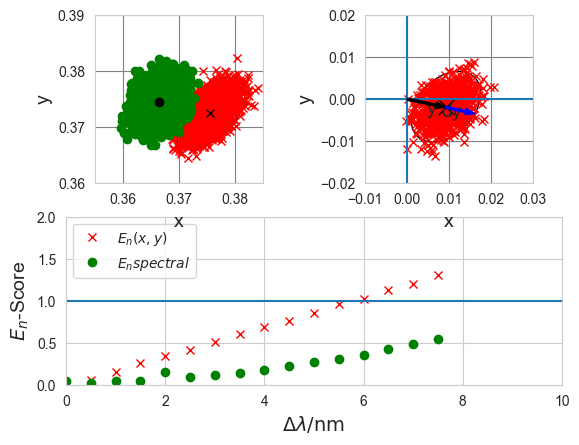

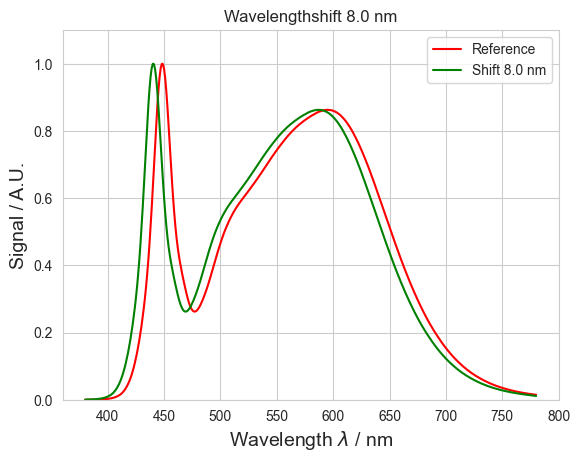

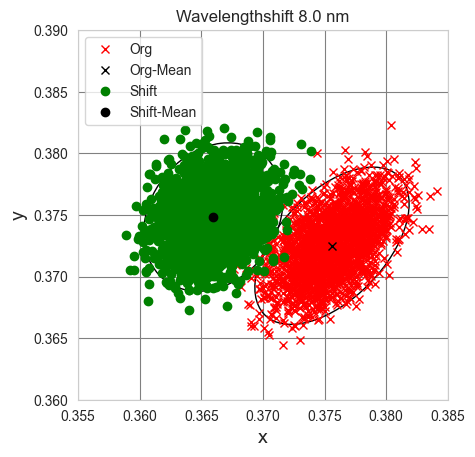

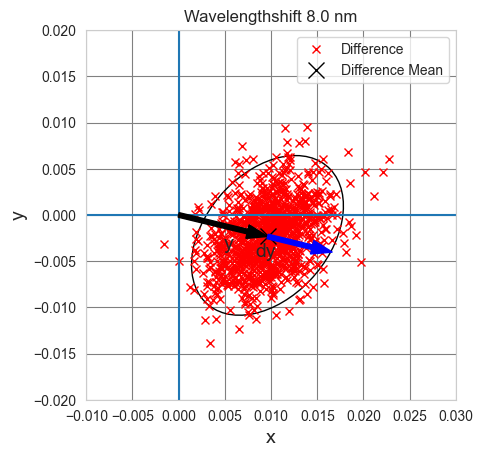

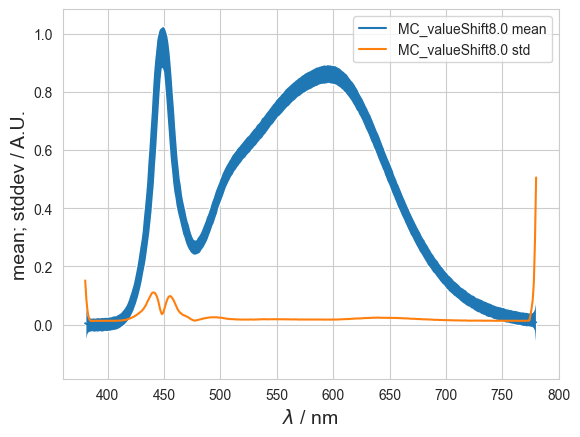

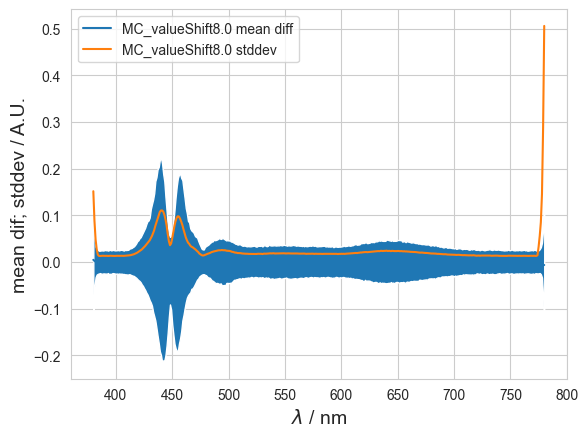

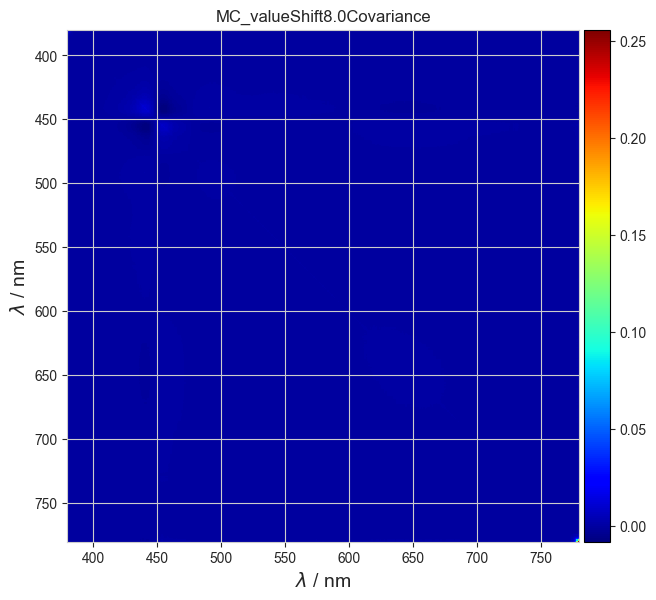

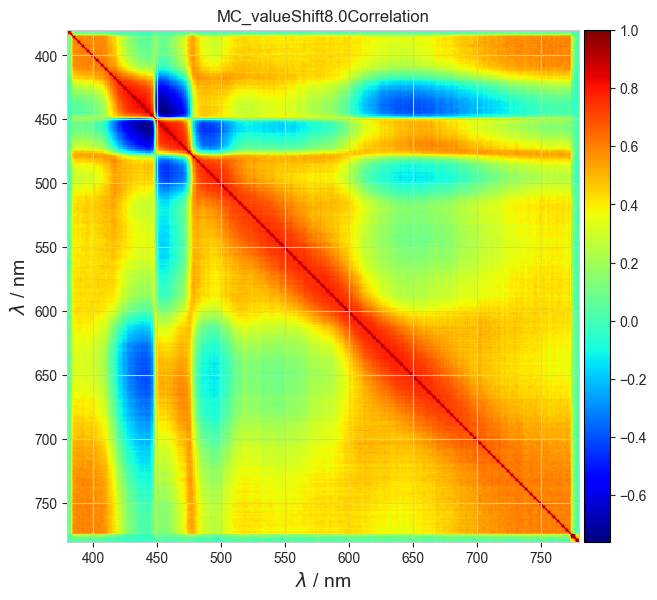

chisquare: 448.690621241841
Difference Vecotr: [7.0333e-03 5.1604e-03 1.3709e-03 9.6723e-04 5.3518e-04 8.3499e-05
 -2.9483e-04 -5.9863e-04 -1.1867e-03 -1.2492e-03 -8.5284e-04 -1.4511e-03
 -1.7381e-03 -1.8486e-03 -2.3377e-03 -2.4911e-03 -3.0178e-03 -4.2915e-03
 -5.2615e-03 -5.7888e-03 -6.7148e-03 -8.2593e-03 -9.7776e-03 -1.1480e-02
 -1.3143e-02 -1.5580e-02 -1.8550e-02 -2.2156e-02 -2.5894e-02 -2.9957e-02
 -3.4091e-02 -3.9710e-02 -4.5693e-02 -5.2340e-02 -5.9000e-02 -6.7224e-02
 -7.5406e-02 -8.4525e-02 -9.3652e-02 -1.0456e-01 -1.1490e-01 -1.2566e-01
 -1.3836e-01 -1.5122e-01 -1.6555e-01 -1.8128e-01 -1.9833e-01 -2.1927e-01
 -2.4090e-01 -2.6506e-01 -2.9166e-01 -3.2243e-01 -3.4983e-01 -3.7765e-01
 -4.0205e-01 -4.2118e-01 -4.2720e-01 -4.2705e-01 -4.0945e-01 -3.7779e-01
 -3.3177e-01 -2.7375e-01 -2.0338e-01 -1.2422e-01 -3.9287e-02 4.7095e-02
 1.2905e-01 2.0156e-01 2.6349e-01 3.1289e-01 3.4856e-01 3.6320e-01
 3.6732e-01 3.6021e-01 3.4230e-01 3.1903e-01 2.8897e-01 2.5769e-01
 2.2849e-01 2.0248e-01 

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [1.0227e-02 -2.5850e-03] 0.010548911476019546
Resulting Covariance Matrix: [[1.1777e-05 4.3971e-06]
 [4.3971e-06 1.2748e-05]]
dy: 0.007281764648454554
DoE: 1.4486751474806858
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375601  6.376306e-04   
0           wl_noise_c    0    1.0  0       normal  0.375637  1.285177e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375611  1.821921e-03   
0       value_noise_nc    0   0.01  0       normal  0.375610  2.222570

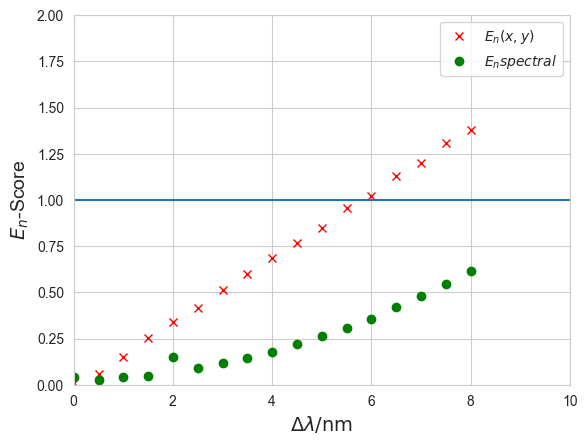

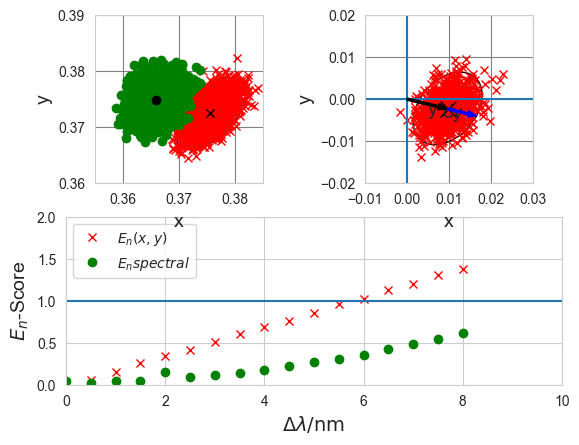

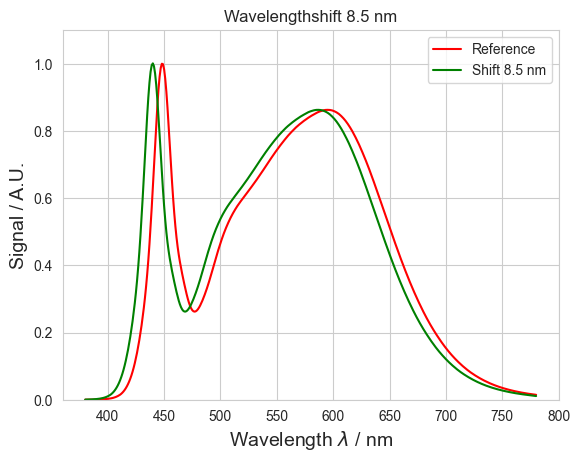

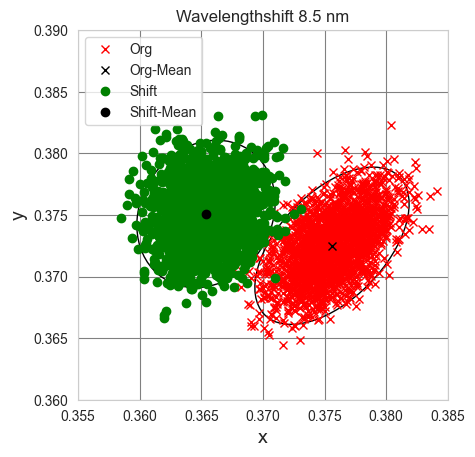

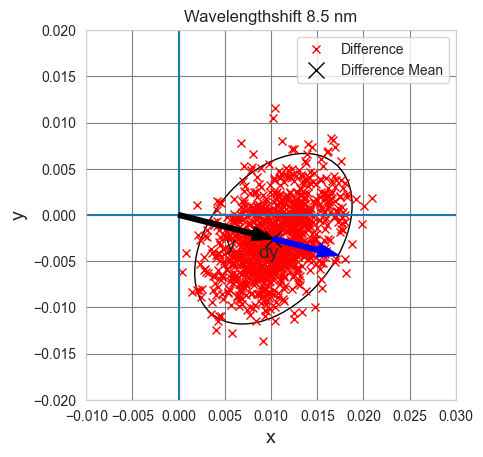

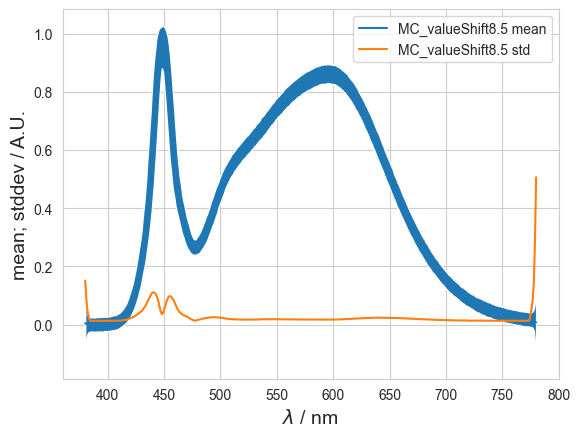

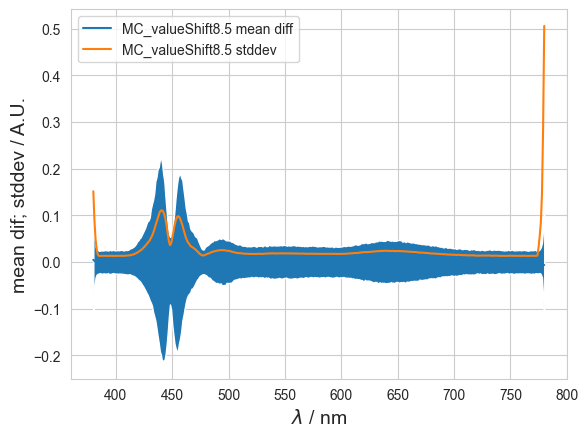

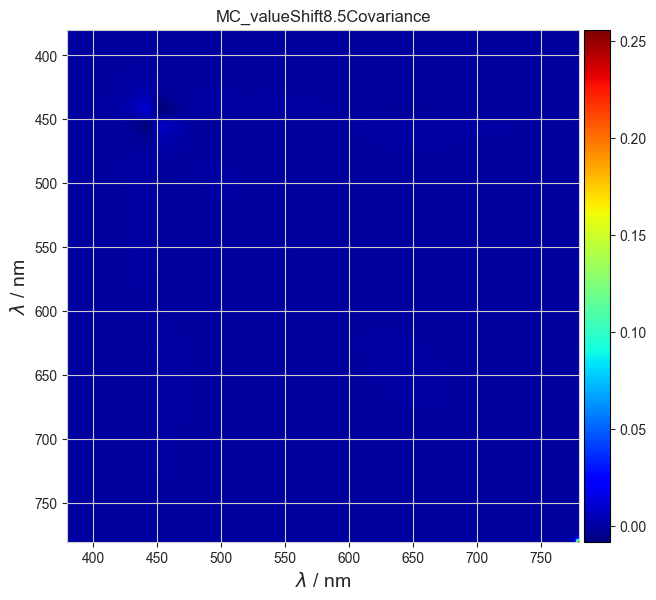

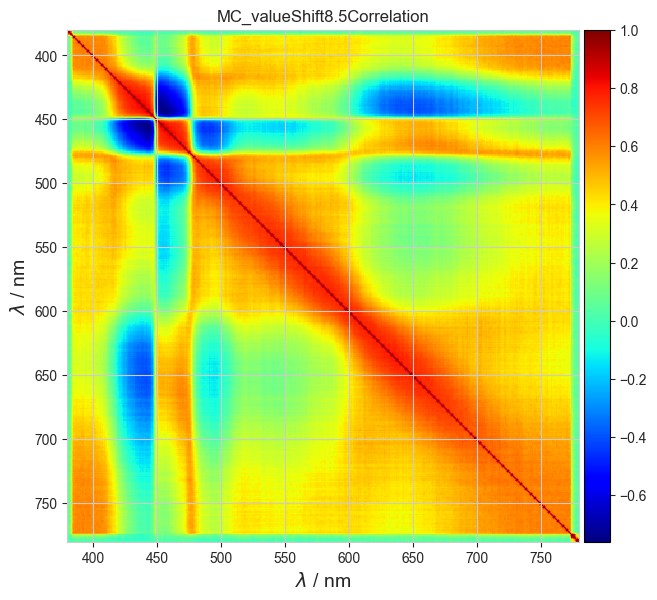

chisquare: 448.690621241841
Difference Vecotr: [9.5495e-03 5.5517e-03 5.4589e-03 4.0836e-03 1.3713e-03 -4.9736e-04
 -4.8019e-04 -6.1858e-04 -1.3981e-03 -1.3953e-03 -1.6145e-03 -1.6213e-03
 -1.5374e-03 -2.3428e-03 -2.9378e-03 -2.8438e-03 -3.4485e-03 -4.8718e-03
 -5.8620e-03 -6.9819e-03 -7.9329e-03 -9.4608e-03 -1.0922e-02 -1.2747e-02
 -1.5118e-02 -1.7808e-02 -2.0967e-02 -2.4471e-02 -2.8384e-02 -3.2835e-02
 -3.7661e-02 -4.4639e-02 -5.1607e-02 -5.8152e-02 -6.5809e-02 -7.4012e-02
 -8.3386e-02 -9.3287e-02 -1.0333e-01 -1.1479e-01 -1.2578e-01 -1.3788e-01
 -1.5184e-01 -1.6650e-01 -1.8082e-01 -1.9895e-01 -2.1920e-01 -2.4105e-01
 -2.6579e-01 -2.9341e-01 -3.2162e-01 -3.5348e-01 -3.8473e-01 -4.1060e-01
 -4.3478e-01 -4.4952e-01 -4.5186e-01 -4.4645e-01 -4.2353e-01 -3.8542e-01
 -3.3402e-01 -2.6959e-01 -1.9269e-01 -1.0900e-01 -1.8526e-02 7.2189e-02
 1.5440e-01 2.2668e-01 2.8954e-01 3.3864e-01 3.6969e-01 3.8558e-01
 3.8573e-01 3.7539e-01 3.5668e-01 3.3018e-01 2.9890e-01 2.6758e-01
 2.3707e-01 2.1034e-01

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [1.0725e-02 -2.9645e-03] 0.01112714474816293
Resulting Covariance Matrix: [[1.1350e-05 4.3604e-06]
 [4.3604e-06 1.3127e-05]]
dy: 0.007148227014539325
DoE: 1.5566300182591544
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375601  6.376306e-04   
0           wl_noise_c    0    1.0  0       normal  0.375637  1.285177e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375611  1.821921e-03   
0       value_noise_nc    0   0.01  0       normal  0.375610  2.222570e

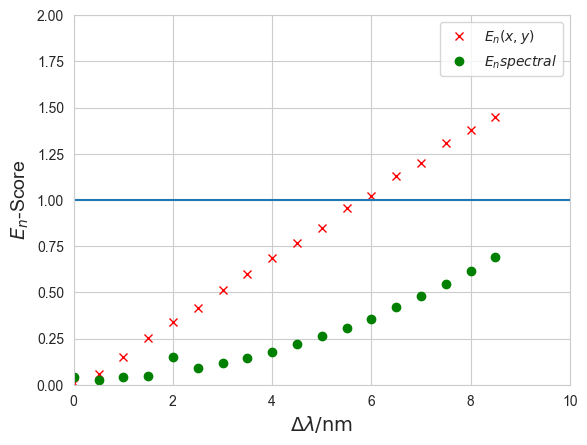

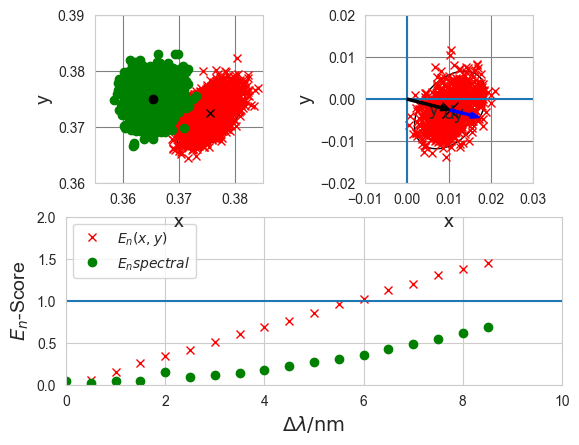

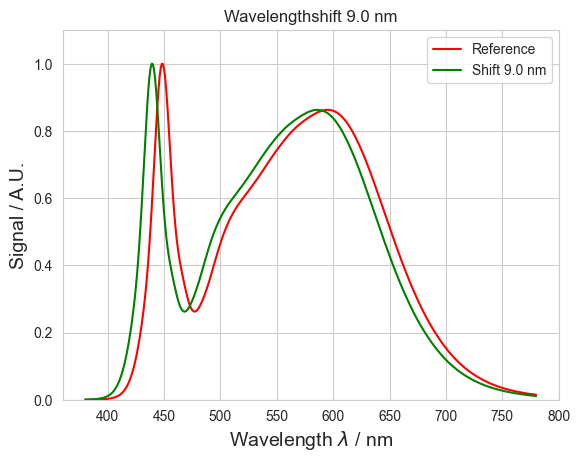

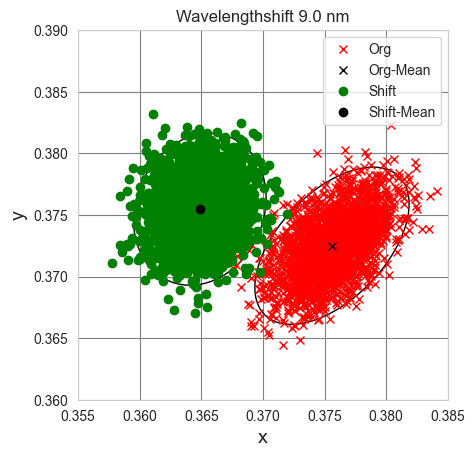

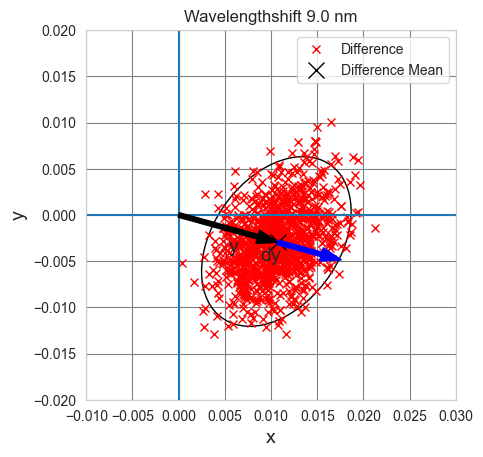

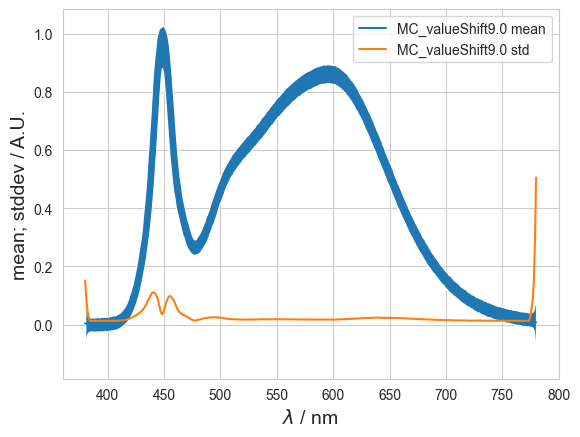

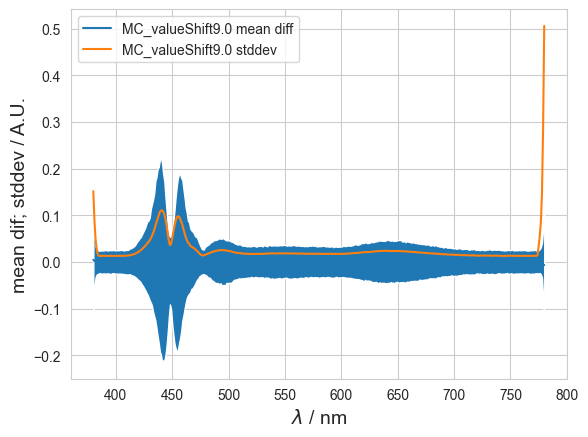

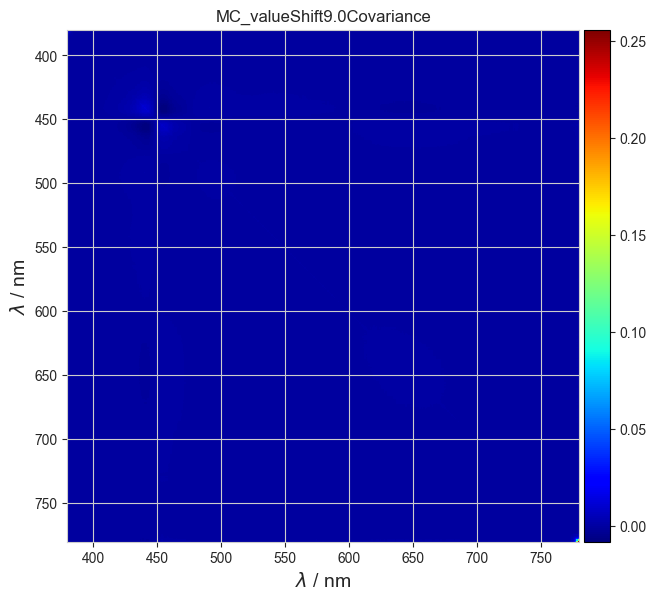

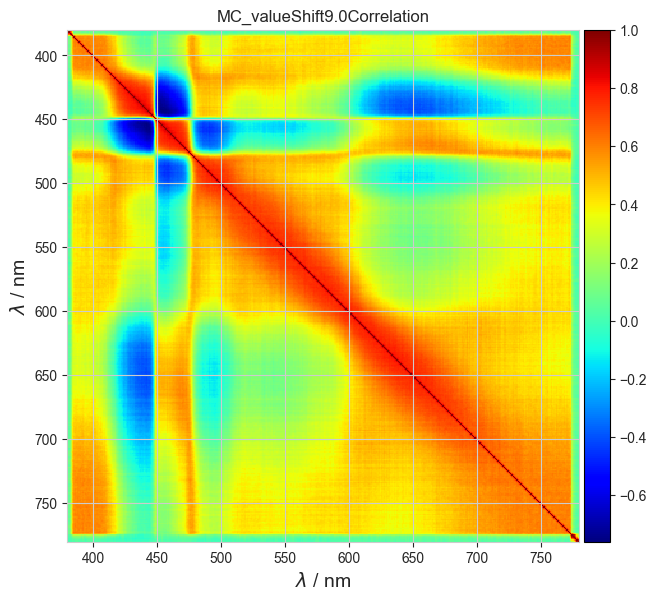

chisquare: 448.690621241841
Difference Vecotr: [-1.0666e-02 -2.3450e-03 -1.6629e-03 8.5980e-05 -3.7244e-04 -5.1893e-04
 -7.6157e-04 -7.5752e-04 -1.6919e-03 -1.5383e-03 -1.5612e-03 -1.8562e-03
 -2.4351e-03 -2.8870e-03 -3.2409e-03 -3.4113e-03 -3.9928e-03 -5.0691e-03
 -6.4339e-03 -7.4230e-03 -8.5672e-03 -1.0315e-02 -1.2261e-02 -1.4186e-02
 -1.6435e-02 -1.9666e-02 -2.2878e-02 -2.7126e-02 -3.1502e-02 -3.6323e-02
 -4.1892e-02 -4.8562e-02 -5.6077e-02 -6.3654e-02 -7.1675e-02 -8.1060e-02
 -9.1485e-02 -1.0188e-01 -1.1216e-01 -1.2429e-01 -1.3532e-01 -1.4949e-01
 -1.6555e-01 -1.8072e-01 -1.9786e-01 -2.1726e-01 -2.3797e-01 -2.6157e-01
 -2.8934e-01 -3.2089e-01 -3.5026e-01 -3.8226e-01 -4.1265e-01 -4.3964e-01
 -4.6175e-01 -4.7511e-01 -4.7501e-01 -4.6249e-01 -4.3414e-01 -3.9126e-01
 -3.3237e-01 -2.6121e-01 -1.7886e-01 -8.9659e-02 4.1885e-03 9.5569e-02
 1.8119e-01 2.5590e-01 3.1639e-01 3.6335e-01 3.9230e-01 4.0490e-01
 4.0322e-01 3.9186e-01 3.6935e-01 3.4158e-01 3.0953e-01 2.7747e-01
 2.4678e-01 2.1923e

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [1.1247e-02 -3.2918e-03] 0.01171912146002941
Resulting Covariance Matrix: [[1.1529e-05 4.2388e-06]
 [4.2388e-06 1.3052e-05]]
dy: 0.007223155482823797
DoE: 1.62243793420988
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375601  6.376306e-04   
0           wl_noise_c    0    1.0  0       normal  0.375637  1.285177e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375611  1.821921e-03   
0       value_noise_nc    0   0.01  0       normal  0.375610  2.222570e-0

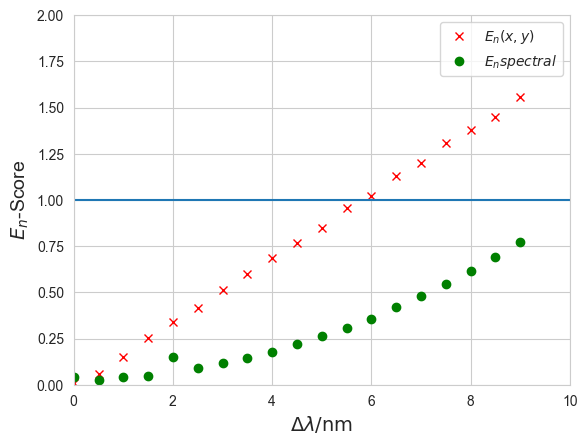

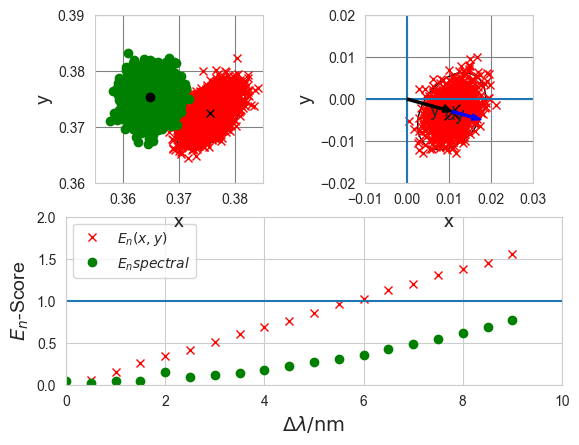

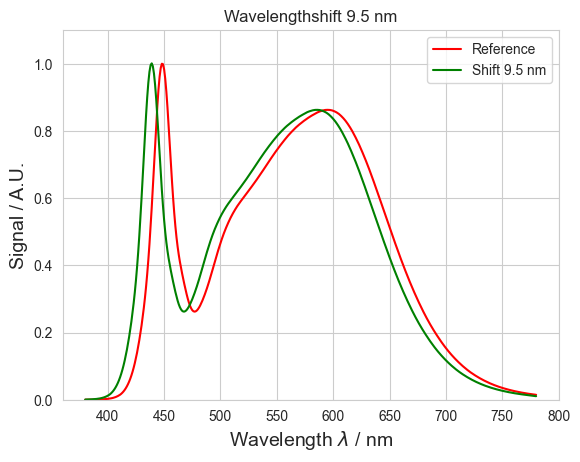

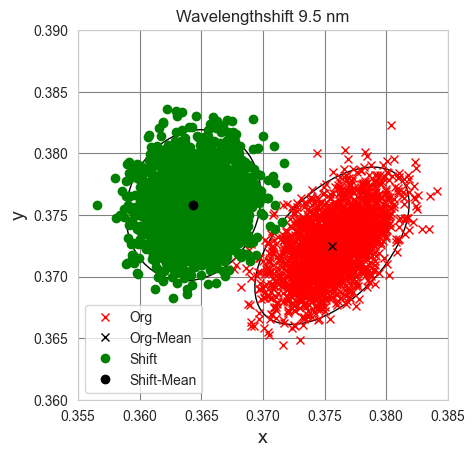

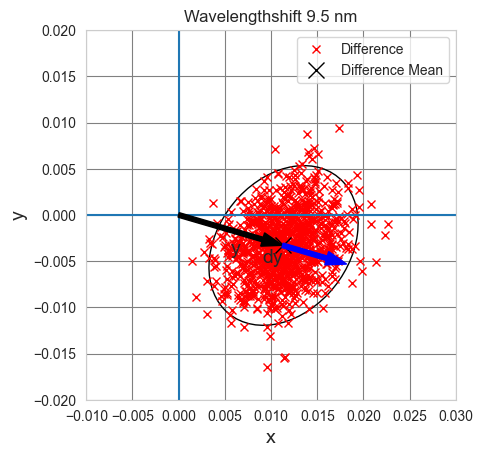

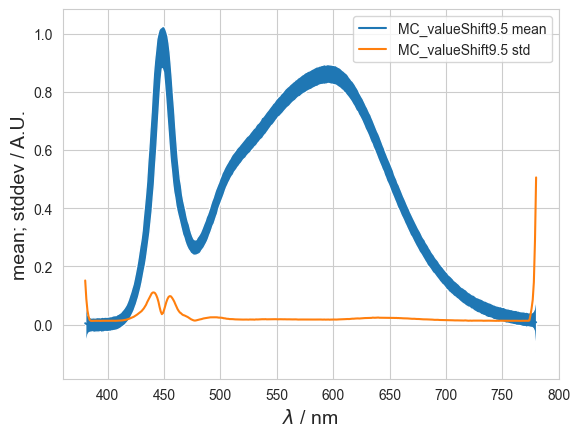

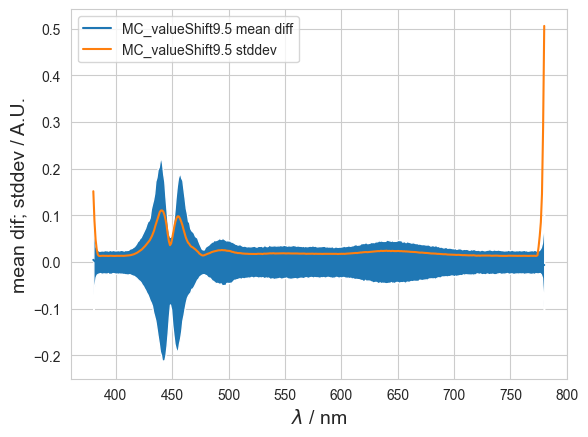

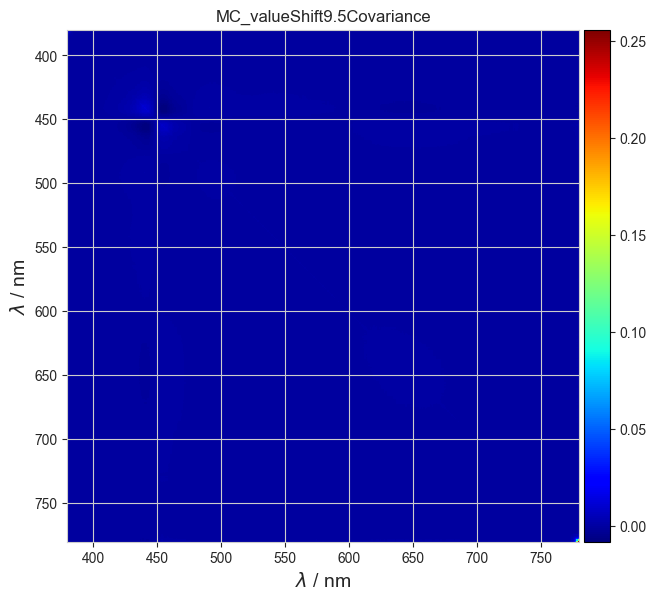

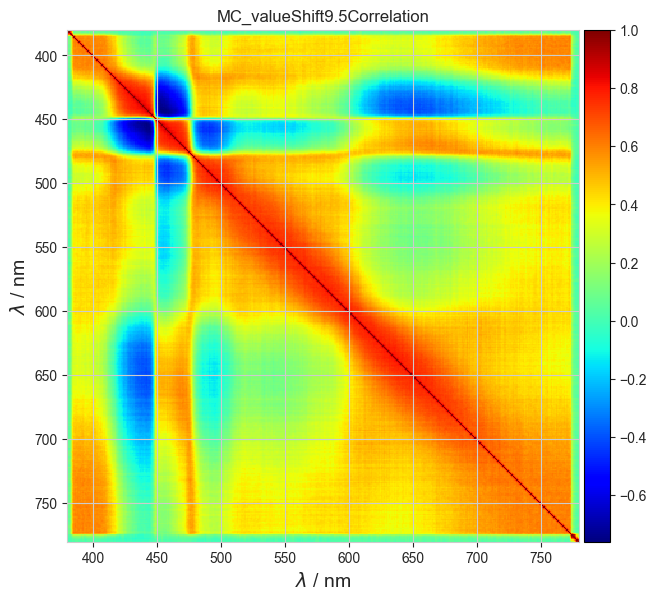

chisquare: 448.690621241841
Difference Vecotr: [7.4427e-03 5.2011e-03 1.4371e-03 8.1210e-04 7.3606e-05 -5.9379e-04
 -5.8801e-04 -8.0841e-04 -1.5719e-03 -1.3041e-03 -1.9338e-03 -2.1931e-03
 -2.2745e-03 -2.8681e-03 -3.6827e-03 -3.9789e-03 -5.1157e-03 -5.9980e-03
 -7.0061e-03 -7.9620e-03 -9.8571e-03 -1.1497e-02 -1.3184e-02 -1.5425e-02
 -1.8450e-02 -2.1927e-02 -2.5593e-02 -2.9893e-02 -3.4699e-02 -3.9830e-02
 -4.5840e-02 -5.2680e-02 -6.0186e-02 -6.7703e-02 -7.6987e-02 -8.7533e-02
 -9.7878e-02 -1.0862e-01 -1.2006e-01 -1.3277e-01 -1.4560e-01 -1.6024e-01
 -1.7699e-01 -1.9385e-01 -2.1140e-01 -2.3377e-01 -2.5650e-01 -2.8262e-01
 -3.1120e-01 -3.4351e-01 -3.7523e-01 -4.0888e-01 -4.3868e-01 -4.6532e-01
 -4.8655e-01 -4.9566e-01 -4.8974e-01 -4.7471e-01 -4.4075e-01 -3.9204e-01
 -3.2863e-01 -2.5317e-01 -1.6458e-01 -7.2138e-02 2.3913e-02 1.1803e-01
 2.0357e-01 2.7546e-01 3.3663e-01 3.8110e-01 4.0772e-01 4.1884e-01
 4.1607e-01 4.0199e-01 3.7838e-01 3.4963e-01 3.1685e-01 2.8420e-01
 2.5347e-01 2.2504e-01 

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


nothing
generate_random_numbers
wl_noise_nc
generate_random_numbers
A
wl_noise_c
generate_random_numbers
B
wl_fourier_noise
generate_random_numbers
C
value_noise_nc
generate_random_numbers
D
value_noise_c
generate_random_numbers
E
value_fourier_noise
generate_random_numbers
F
all
generate_random_numbers
A
B
C
D
E
F
chisquare: 5.991464547107979
Difference Vecotr: [1.1724e-02 -3.7253e-03] 0.012301797079387965
Resulting Covariance Matrix: [[1.1412e-05 4.4111e-06]
 [4.4111e-06 1.3194e-05]]
dy: 0.007101590445580175
DoE: 1.7322594387351988
           Contributon Mean StdDev NB Distribution         x            sx   
0              nothing    0    0.0  0         none  0.375605  5.551115e-17  \
0          wl_noise_nc    0    1.0  0       normal  0.375601  6.376306e-04   
0           wl_noise_c    0    1.0  0       normal  0.375637  1.285177e-03   
0     wl_fourier_noise    0    1.0  4            F  0.375611  1.821921e-03   
0       value_noise_nc    0   0.01  0       normal  0.375610  2.222570

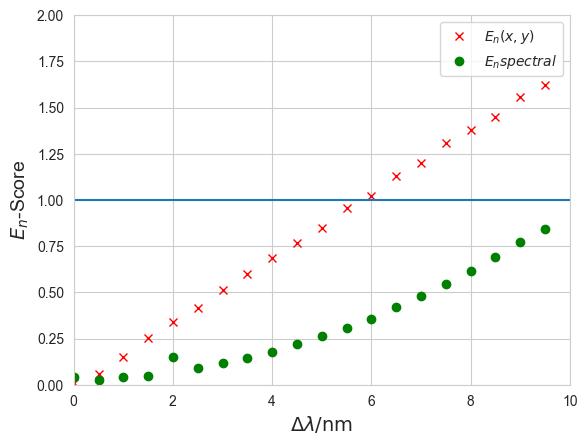

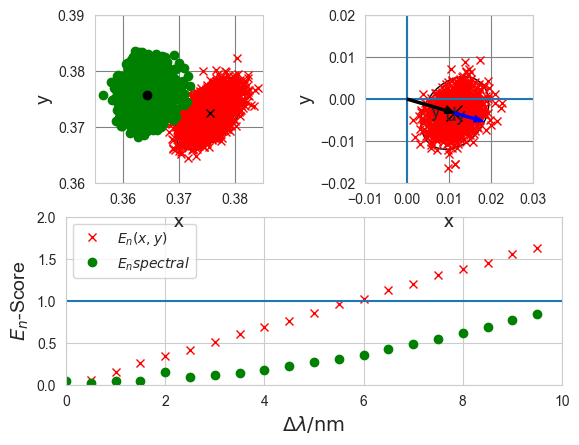

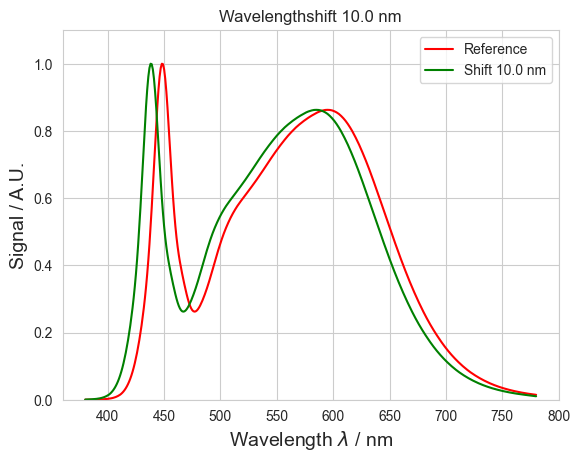

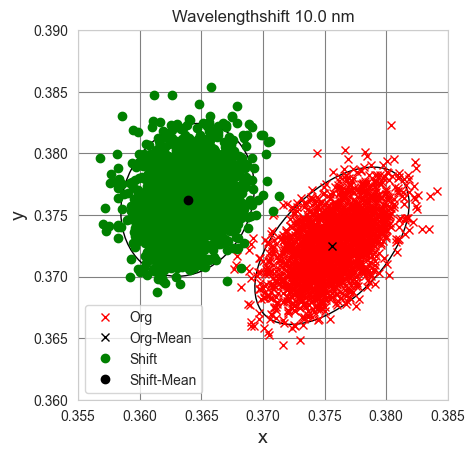

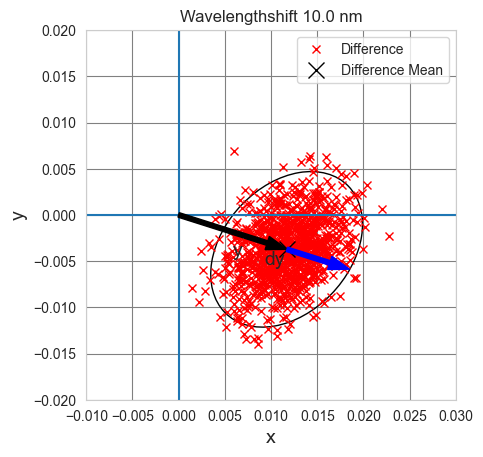

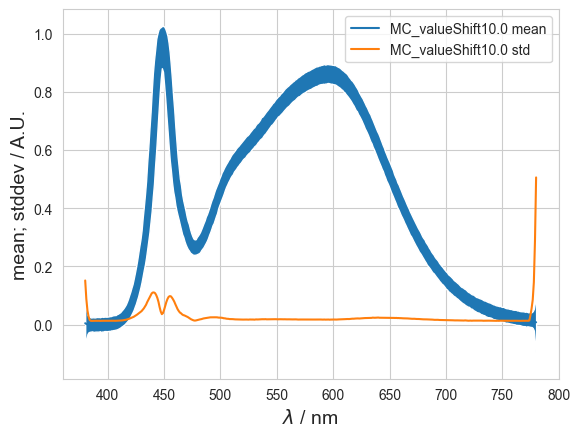

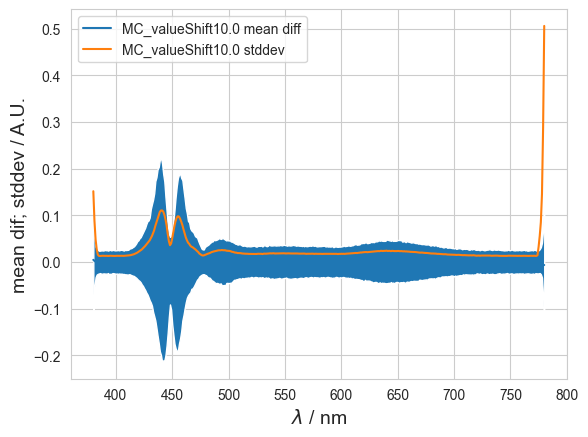

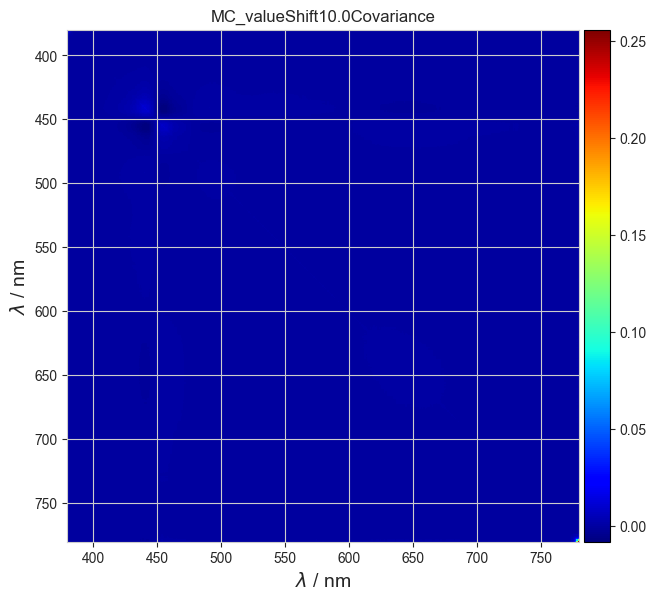

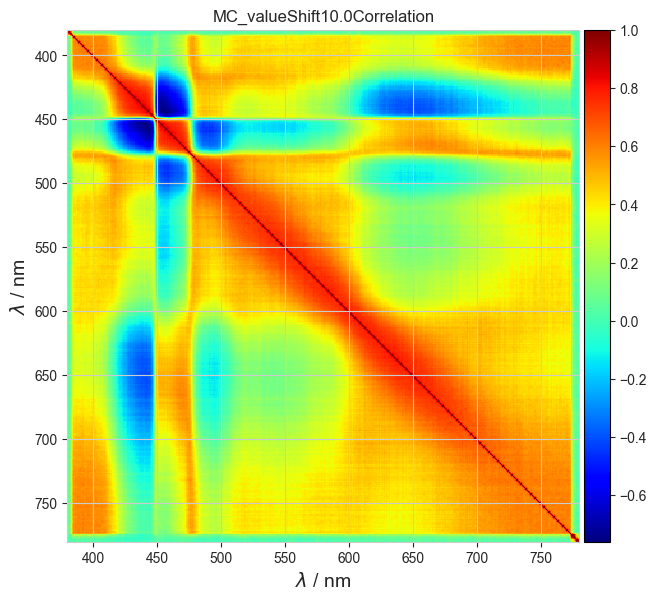

chisquare: 448.690621241841
Difference Vecotr: [-1.5741e-02 -1.7741e-02 -1.5753e-02 -5.8347e-03 -4.2837e-04 -5.5382e-04
 -8.6114e-04 -1.2732e-03 -1.8363e-03 -1.9149e-03 -2.0757e-03 -2.1710e-03
 -2.8141e-03 -3.1734e-03 -4.0257e-03 -4.6221e-03 -5.4285e-03 -6.5634e-03
 -8.4135e-03 -9.2943e-03 -1.0970e-02 -1.2887e-02 -1.4949e-02 -1.7232e-02
 -2.0521e-02 -2.3751e-02 -2.8023e-02 -3.2910e-02 -3.8427e-02 -4.4082e-02
 -5.0455e-02 -5.8161e-02 -6.6503e-02 -7.5398e-02 -8.4864e-02 -9.5235e-02
 -1.0623e-01 -1.1844e-01 -1.3100e-01 -1.4547e-01 -1.5956e-01 -1.7508e-01
 -1.9365e-01 -2.1195e-01 -2.3124e-01 -2.5502e-01 -2.8108e-01 -3.0886e-01
 -3.4084e-01 -3.7415e-01 -4.0740e-01 -4.4072e-01 -4.7263e-01 -4.9421e-01
 -5.1204e-01 -5.1803e-01 -5.0791e-01 -4.8638e-01 -4.4576e-01 -3.8908e-01
 -3.1800e-01 -2.3634e-01 -1.4395e-01 -4.7297e-02 5.0412e-02 1.4585e-01
 2.3338e-01 3.0503e-01 3.6457e-01 4.0520e-01 4.3154e-01 4.3902e-01
 4.3257e-01 4.1639e-01 3.9077e-01 3.6034e-01 3.2700e-01 2.9362e-01
 2.6229e-01 2.3363

C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:40: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = pyplot.subplot(212)
C:\Users\udo.krueger\AppData\Local\Temp\ipykernel_20832\1066453283.py:49: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax2 = pyplot.subplot(121)


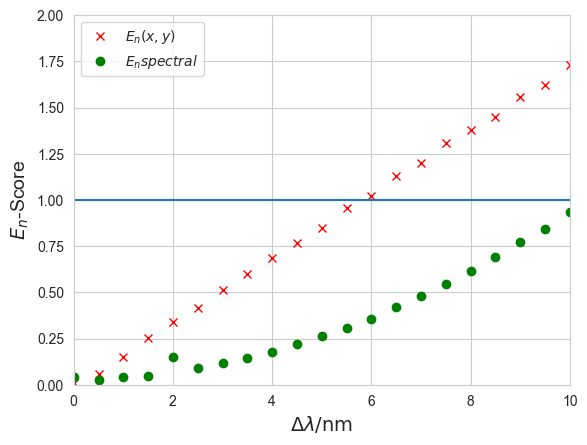

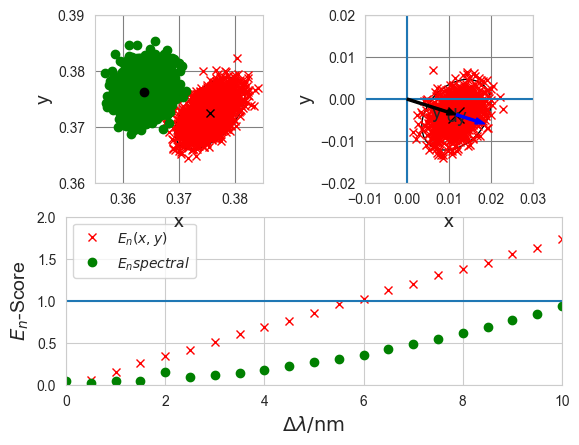

In [20]:
sample_number = 21
shift_range = 10
shift_field = np.zeros((sample_number))
DoE_xy = np.zeros((sample_number))
DoE_md = np.zeros((sample_number))
for i, shift in zip(range( sample_number), np.linspace(0, shift_range, sample_number)):
    shift_field[i]=shift
    spd_wlshift = lx.cie_interp(spd_init, \
            wl_new = shift + np.arange(wlStart,wlStop+1,wlResolution),\
            kind = 'S',negative_values_allowed=True)
    spd_wlshift[0] = spd_init[0]
    fig, ax = pyplot.subplots()
    plot_SD( fig, ax, spd_init, spd_wlshift, shift)
    add_frame( video_writer_L41, frame_size_v)

    mcSpectrumSamples2 = make2ndMC(shift, spd_wlshift)
    fig1, ax1 = pyplot.subplots()
    plotxySingle(fig, ax1, shift, mcSpectrumSamples2)
    add_frame( video_writer_single, frame_size_1)

    x1, cov1 = calcMeanCov(mcSpectrumSamples)
    x2, cov2 = calcMeanCov(mcSpectrumSamples2)
    d, dy, V, data = calc_multiDim_DoE(x1, cov1, x2, cov2)
    fig2, ax2 = pyplot.subplots()
    plot_multi_DoE(fig2, ax2, shift, d, dy, V, data)
    add_frame( video_writer_diff, frame_size_1)

    cov_image2 = showResults(mcSpectrumSamples, 'MC_valueShift'+str(shift))
    sd1 = mcSpectrumSamples.v_mean
    sd2 = mcSpectrumSamples2.v_mean
    d1, dy1, V1, data1 = calc_multiDim_DoE(sd1, cov_image, sd2, cov_image2)
    DoE_xy[i] = 1/dy
    DoE_md[i] = 1/dy1
    fig3, ax3 = pyplot.subplots()
    plot_DoE( fig3, ax3, shift_field[:i+1], DoE_xy[:i+1], DoE_md[:i+1])
    add_frame( video_writer_DoE, frame_size_v)


    fig4, ax4 = pyplot.subplots()
    ax1 = pyplot.subplot(212)
    plot_DoE( fig, ax1, shift_field[:i+1], DoE_xy[:i+1], DoE_md[:i+1])
    ax2 = pyplot.subplot(221)
    plotxySingle(fig, ax2, shift, mcSpectrumSamples2, legend=False)
    ax3 = pyplot.subplot(222)
    plot_multi_DoE(fig, ax3, shift, d, dy, V, data, legend=False)
    add_frame( video_writer_ges, frame_size_v)

    fig4, ax4 = pyplot.subplots()
    ax2 = pyplot.subplot(121)
    plotxySingle(fig, ax2, shift, mcSpectrumSamples2, legend=True)
    ax3 = pyplot.subplot(122)
    plot_multi_DoE(fig, ax3, shift, d, dy, V, data, legend=True)
    add_frame( video_writer_xy, frame_size_v)

    #break

    # delete temp files
    pyplot.clf()
    pyplot.cla()
    pyplot.close()

# close videowirter
video_writer_L41.release()
video_writer_single.release()
video_writer_diff.release()
video_writer_DoE.release()
video_writer_ges.release()
video_writer_xy.release()
cv2.destroyAllWindows()

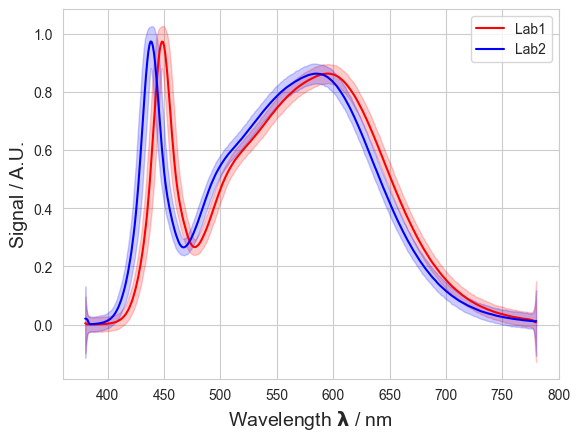

In [21]:
def plot_MU(ax1, samples, name, color):
    v_wl_ref, v_wl, v_wl_diff, v_mean, v_mean_diff, v_std, q_min, q_max, cov_image, corr_image, counts = samples.get_result()

    ax1.plot( v_wl_ref, v_mean, label=name, color=color)
    ax1.fill_between( v_wl_ref, q_min, q_max, alpha = 0.2, color=color)
    ax1.set_xlabel('Wavelength $\mathbf{\lambda}$ / nm', fontsize=label_font_size)
    ax1.set_ylabel( 'Signal / A.U.', fontsize=label_font_size)
    ax1.legend()

fig, ax1 = pyplot.subplots()
plot_MU( ax1, mcSpectrumSamples, 'Lab1', 'r')
plot_MU( ax1, mcSpectrumSamples2, 'Lab2', 'b')
save_fig( dir=out_dir, filename='CompareSD')
